In [91]:
import numpy as np, pandas as pd,seaborn as sns
import matplotlib.pyplot as plt

In [3]:
data = pd.read_csv('customerchurn.csv')

In [5]:
data.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [10]:
data.drop('customerID',axis=1,inplace=True)

In [13]:
def binary_encode(dataFrame,feature_name,positive_value):
    dataFrame[feature_name] = dataFrame[feature_name].apply(lambda x: 1 if x==positive_value else 0)
    return dataFrame

In [14]:
def ordinary_encode(dataFrame,feature_name,order_list):
    dataFrame[feature_name] = dataFrame[feature_name].apply(lambda x: order_list.index(x))
    return dataFrame

In [64]:
def one_hot_encode(dataFrame,feature_names):
    return pd.get_dummies(data=dataFrame,columns=feature_names,prefix="is") 

In [37]:
df = data.copy()

In [35]:
binaries = list()
for i in df.columns:
    if len(data[i].unique())==2 and data[i].dtypes=='object':
        binaries.append(i)

In [36]:
binaries

['gender',
 'Partner',
 'Dependents',
 'PhoneService',
 'PaperlessBilling',
 'Churn']

In [38]:
df = binary_encode(df,"gender","Female")
for i in binaries[1:]:
    df = binary_encode(df,i,"Yes")

In [41]:
df.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,1,0,1,0,1,0,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,1,Electronic check,29.85,29.85,0
1,0,0,0,0,34,1,No,DSL,Yes,No,Yes,No,No,No,One year,0,Mailed check,56.95,1889.5,0
2,0,0,0,0,2,1,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,1,Mailed check,53.85,108.15,1
3,0,0,0,0,45,0,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,0,Bank transfer (automatic),42.30,1840.75,0
4,1,0,0,0,2,1,No,Fiber optic,No,No,No,No,No,No,Month-to-month,1,Electronic check,70.70,151.65,1


In [47]:
df = ordinary_encode(df,"MultipleLines",['No phone service', 'No', 'Yes'])

In [59]:
df = ordinary_encode(df,"InternetService",['No', 'DSL','Fiber optic'])
for i in ["OnlineSecurity","OnlineBackup","DeviceProtection","TechSupport","StreamingTV","StreamingMovies"]:
    df = ordinary_encode(df,i,['No internet service','No', 'Yes'])

In [65]:
df = one_hot_encode(df,["Contract","PaymentMethod"])

In [82]:
nulldata = df.TotalCharges==" "

In [85]:
df = df[~nulldata]

In [87]:
df = df.astype(float) 

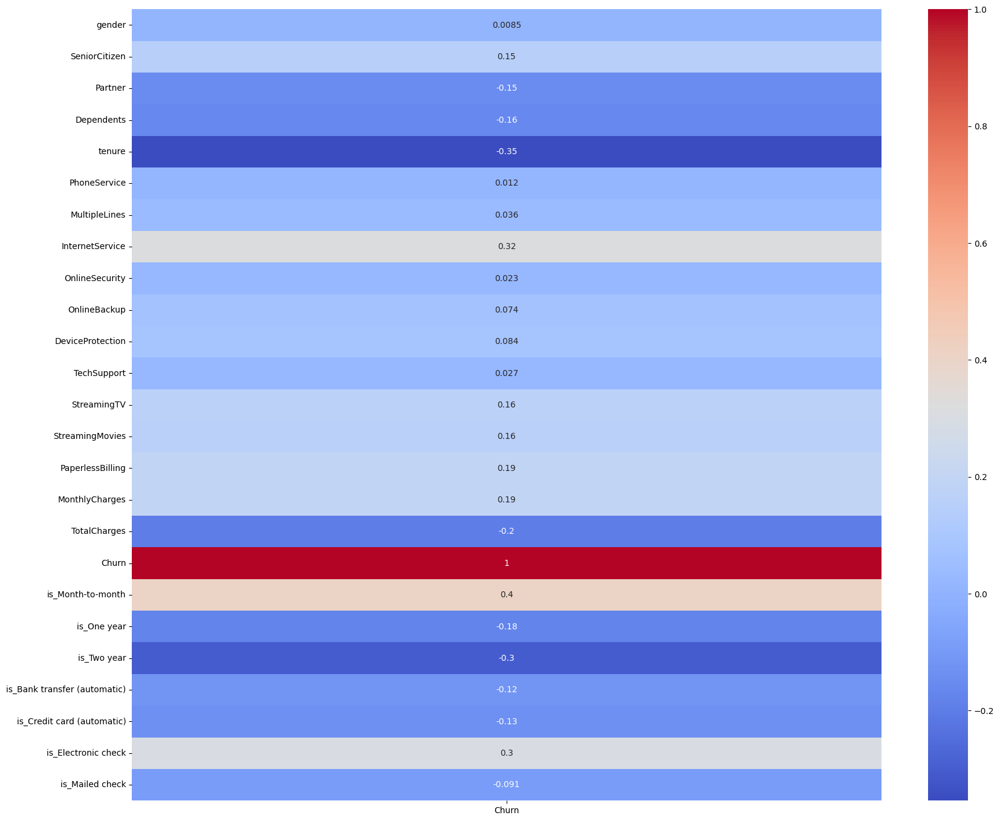

In [99]:
plt.figure(figsize=(20,17))
sns.heatmap(df.corr()[["Churn"]],annot=True,cmap=plt.cm.coolwarm)
plt.show()

In [97]:
#between independent variables
#internet service- montly charges=0.91
#tenure-totalcharges =0.82

In [106]:
#lets see the connection between independents and dependent
from sklearn.feature_selection import mutual_info_classif

mutual_info = mutual_info_classif(df.drop('Churn',axis=1),df.Churn)

In [110]:
mutual_df = pd.DataFrame(mutual_info)
mutual_df.index = df.drop('Churn',axis=1).columns

In [132]:
mutual_df.sort_values(0,ascending=False).T

,is_Month-to-month,tenure,TechSupport,OnlineSecurity,is_Two year,InternetService,OnlineBackup,MonthlyCharges,is_Electronic check,TotalCharges,...,Dependents,SeniorCitizen,PaperlessBilling,Partner,PhoneService,is_Mailed check,is_Credit card (automatic),gender,MultipleLines,is_Bank transfer (automatic)
0,0.097299,0.081499,0.067911,0.062471,0.059262,0.054929,0.047435,0.045079,0.04491,0.044435,...,0.018138,0.017802,0.016882,0.013941,0.007806,0.006249,0.005542,0.00477,0.002164,0.000945


In [116]:
#lets delete really unimportants like last 5 elements

df.drop(['MultipleLines','is_Bank transfer (automatic)','gender','is_Credit card (automatic)','is_Mailed check']
       ,axis=1,inplace=True)

In [118]:
#models
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier

In [119]:
X = df.drop('Churn',axis=1)
y = df.Churn

In [120]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler().fit(X)
X = scaler.transform(X)

In [122]:
from sklearn.model_selection import train_test_split

x_train,x_test,y_train,y_test = train_test_split(X,y,test_size=0.3,random_state=42)

In [123]:
models = dict(
    lr_model = LogisticRegression(),
    rf_model = RandomForestClassifier(),
    cb_model = CatBoostClassifier(),
    lgbm_model = LGBMClassifier()
)

In [124]:
for model in models.values():
    model.fit(x_train,y_train)

Learning rate set to 0.020346
0:	learn: 0.6776385	total: 63.7ms	remaining: 1m 3s
1:	learn: 0.6628152	total: 66.7ms	remaining: 33.3s
2:	learn: 0.6489919	total: 69.1ms	remaining: 23s
3:	learn: 0.6358222	total: 71.2ms	remaining: 17.7s
4:	learn: 0.6232881	total: 73.3ms	remaining: 14.6s
5:	learn: 0.6119617	total: 75ms	remaining: 12.4s
6:	learn: 0.6011392	total: 77.1ms	remaining: 10.9s
7:	learn: 0.5907492	total: 79.1ms	remaining: 9.81s
8:	learn: 0.5805037	total: 81.1ms	remaining: 8.93s
9:	learn: 0.5718546	total: 83ms	remaining: 8.22s
10:	learn: 0.5636770	total: 85ms	remaining: 7.64s
11:	learn: 0.5558458	total: 87ms	remaining: 7.16s
12:	learn: 0.5483760	total: 88.9ms	remaining: 6.75s
13:	learn: 0.5420522	total: 90.9ms	remaining: 6.41s
14:	learn: 0.5353609	total: 92.9ms	remaining: 6.1s
15:	learn: 0.5288960	total: 95ms	remaining: 5.84s
16:	learn: 0.5237439	total: 97ms	remaining: 5.61s
17:	learn: 0.5188871	total: 98.7ms	remaining: 5.38s
18:	learn: 0.5135836	total: 101ms	remaining: 5.2s
19:	learn

244:	learn: 0.3773099	total: 575ms	remaining: 1.77s
245:	learn: 0.3772359	total: 577ms	remaining: 1.77s
246:	learn: 0.3770758	total: 579ms	remaining: 1.77s
247:	learn: 0.3769979	total: 582ms	remaining: 1.76s
248:	learn: 0.3768934	total: 584ms	remaining: 1.76s
249:	learn: 0.3767930	total: 586ms	remaining: 1.76s
250:	learn: 0.3766227	total: 589ms	remaining: 1.76s
251:	learn: 0.3765320	total: 591ms	remaining: 1.75s
252:	learn: 0.3764332	total: 593ms	remaining: 1.75s
253:	learn: 0.3762731	total: 596ms	remaining: 1.75s
254:	learn: 0.3761976	total: 598ms	remaining: 1.75s
255:	learn: 0.3760443	total: 600ms	remaining: 1.74s
256:	learn: 0.3759946	total: 602ms	remaining: 1.74s
257:	learn: 0.3759148	total: 604ms	remaining: 1.74s
258:	learn: 0.3757977	total: 607ms	remaining: 1.74s
259:	learn: 0.3756466	total: 609ms	remaining: 1.73s
260:	learn: 0.3755361	total: 611ms	remaining: 1.73s
261:	learn: 0.3754073	total: 614ms	remaining: 1.73s
262:	learn: 0.3754030	total: 615ms	remaining: 1.72s
263:	learn: 

431:	learn: 0.3559455	total: 961ms	remaining: 1.26s
432:	learn: 0.3557263	total: 964ms	remaining: 1.26s
433:	learn: 0.3555509	total: 966ms	remaining: 1.26s
434:	learn: 0.3554259	total: 969ms	remaining: 1.26s
435:	learn: 0.3552778	total: 971ms	remaining: 1.26s
436:	learn: 0.3551846	total: 974ms	remaining: 1.25s
437:	learn: 0.3550945	total: 976ms	remaining: 1.25s
438:	learn: 0.3549297	total: 978ms	remaining: 1.25s
439:	learn: 0.3548002	total: 980ms	remaining: 1.25s
440:	learn: 0.3546971	total: 983ms	remaining: 1.25s
441:	learn: 0.3545398	total: 985ms	remaining: 1.24s
442:	learn: 0.3543457	total: 988ms	remaining: 1.24s
443:	learn: 0.3542321	total: 990ms	remaining: 1.24s
444:	learn: 0.3541038	total: 992ms	remaining: 1.24s
445:	learn: 0.3539628	total: 995ms	remaining: 1.24s
446:	learn: 0.3538871	total: 997ms	remaining: 1.23s
447:	learn: 0.3537441	total: 1000ms	remaining: 1.23s
448:	learn: 0.3535474	total: 1s	remaining: 1.23s
449:	learn: 0.3534284	total: 1s	remaining: 1.23s
450:	learn: 0.353

597:	learn: 0.3358005	total: 1.35s	remaining: 908ms
598:	learn: 0.3357326	total: 1.35s	remaining: 906ms
599:	learn: 0.3356202	total: 1.35s	remaining: 904ms
600:	learn: 0.3355039	total: 1.36s	remaining: 901ms
601:	learn: 0.3354069	total: 1.36s	remaining: 899ms
602:	learn: 0.3352886	total: 1.36s	remaining: 897ms
603:	learn: 0.3351396	total: 1.36s	remaining: 895ms
604:	learn: 0.3350784	total: 1.37s	remaining: 893ms
605:	learn: 0.3349728	total: 1.37s	remaining: 890ms
606:	learn: 0.3348963	total: 1.37s	remaining: 888ms
607:	learn: 0.3347817	total: 1.37s	remaining: 886ms
608:	learn: 0.3346747	total: 1.38s	remaining: 884ms
609:	learn: 0.3345562	total: 1.38s	remaining: 882ms
610:	learn: 0.3344365	total: 1.38s	remaining: 880ms
611:	learn: 0.3343295	total: 1.38s	remaining: 878ms
612:	learn: 0.3341968	total: 1.39s	remaining: 875ms
613:	learn: 0.3340837	total: 1.39s	remaining: 873ms
614:	learn: 0.3339802	total: 1.39s	remaining: 871ms
615:	learn: 0.3339463	total: 1.39s	remaining: 868ms
616:	learn: 

767:	learn: 0.3194007	total: 1.74s	remaining: 525ms
768:	learn: 0.3193471	total: 1.74s	remaining: 523ms
769:	learn: 0.3192477	total: 1.74s	remaining: 521ms
770:	learn: 0.3191848	total: 1.75s	remaining: 519ms
771:	learn: 0.3191315	total: 1.75s	remaining: 516ms
772:	learn: 0.3190741	total: 1.75s	remaining: 514ms
773:	learn: 0.3189866	total: 1.75s	remaining: 512ms
774:	learn: 0.3189627	total: 1.75s	remaining: 510ms
775:	learn: 0.3188632	total: 1.76s	remaining: 508ms
776:	learn: 0.3187695	total: 1.76s	remaining: 505ms
777:	learn: 0.3186750	total: 1.76s	remaining: 503ms
778:	learn: 0.3185490	total: 1.76s	remaining: 501ms
779:	learn: 0.3184930	total: 1.77s	remaining: 499ms
780:	learn: 0.3183826	total: 1.77s	remaining: 497ms
781:	learn: 0.3183059	total: 1.77s	remaining: 494ms
782:	learn: 0.3182477	total: 1.77s	remaining: 492ms
783:	learn: 0.3181616	total: 1.78s	remaining: 490ms
784:	learn: 0.3180939	total: 1.78s	remaining: 488ms
785:	learn: 0.3180250	total: 1.78s	remaining: 486ms
786:	learn: 

935:	learn: 0.3055390	total: 2.12s	remaining: 145ms
936:	learn: 0.3054997	total: 2.12s	remaining: 143ms
937:	learn: 0.3054612	total: 2.13s	remaining: 141ms
938:	learn: 0.3053740	total: 2.13s	remaining: 138ms
939:	learn: 0.3053520	total: 2.13s	remaining: 136ms
940:	learn: 0.3053025	total: 2.13s	remaining: 134ms
941:	learn: 0.3052272	total: 2.13s	remaining: 131ms
942:	learn: 0.3051355	total: 2.14s	remaining: 129ms
943:	learn: 0.3050505	total: 2.14s	remaining: 127ms
944:	learn: 0.3049789	total: 2.14s	remaining: 125ms
945:	learn: 0.3048573	total: 2.14s	remaining: 122ms
946:	learn: 0.3047659	total: 2.15s	remaining: 120ms
947:	learn: 0.3046795	total: 2.15s	remaining: 118ms
948:	learn: 0.3046289	total: 2.15s	remaining: 116ms
949:	learn: 0.3045393	total: 2.15s	remaining: 113ms
950:	learn: 0.3044419	total: 2.15s	remaining: 111ms
951:	learn: 0.3043958	total: 2.16s	remaining: 109ms
952:	learn: 0.3042939	total: 2.16s	remaining: 107ms
953:	learn: 0.3041942	total: 2.16s	remaining: 104ms
954:	learn: 

In [125]:
for k,v in models.items():
    print("{} has score => {}".format(k,v.score(x_test,y_test)))

lr_model has score => 0.8018957345971564
rf_model has score => 0.7843601895734598
cb_model has score => 0.795734597156398
lgbm_model has score => 0.785781990521327


In [126]:
cb_test_params = {
    "iterations":[200,300,500],
    "learning_rate":[0.01,0.05,0.1,0.001],
    "depth":[3,5,8,9]
}

In [127]:
from sklearn.model_selection import GridSearchCV

grid = GridSearchCV(models["cb_model"],cb_test_params,cv=10,verbose=1,n_jobs=-1).fit(x_train,y_train)

Fitting 10 folds for each of 48 candidates, totalling 480 fits
0:	learn: 0.6865882	total: 57.6ms	remaining: 11.5s
1:	learn: 0.6800571	total: 60ms	remaining: 5.94s
2:	learn: 0.6745555	total: 62.2ms	remaining: 4.08s
3:	learn: 0.6685035	total: 64.3ms	remaining: 3.15s
4:	learn: 0.6624113	total: 66.3ms	remaining: 2.58s
5:	learn: 0.6563123	total: 68ms	remaining: 2.2s
6:	learn: 0.6504251	total: 70ms	remaining: 1.93s
7:	learn: 0.6449390	total: 72ms	remaining: 1.73s
8:	learn: 0.6403824	total: 73.8ms	remaining: 1.57s
9:	learn: 0.6348945	total: 75.9ms	remaining: 1.44s
10:	learn: 0.6298933	total: 77.7ms	remaining: 1.33s
11:	learn: 0.6249170	total: 79.5ms	remaining: 1.25s
12:	learn: 0.6198697	total: 81.5ms	remaining: 1.17s
13:	learn: 0.6156038	total: 83.4ms	remaining: 1.11s
14:	learn: 0.6109455	total: 85.4ms	remaining: 1.05s
15:	learn: 0.6064283	total: 87.4ms	remaining: 1s
16:	learn: 0.6021484	total: 89.4ms	remaining: 963ms
17:	learn: 0.5977005	total: 91.4ms	remaining: 925ms
18:	learn: 0.5942392	to

117:	learn: 0.3999383	total: 252ms	remaining: 175ms
118:	learn: 0.3998780	total: 254ms	remaining: 173ms
119:	learn: 0.3997779	total: 256ms	remaining: 171ms
120:	learn: 0.3996907	total: 258ms	remaining: 168ms
121:	learn: 0.3995929	total: 260ms	remaining: 166ms
122:	learn: 0.3994657	total: 262ms	remaining: 164ms
123:	learn: 0.3994438	total: 264ms	remaining: 162ms
124:	learn: 0.3993496	total: 266ms	remaining: 160ms
125:	learn: 0.3992571	total: 268ms	remaining: 158ms
126:	learn: 0.3991803	total: 270ms	remaining: 155ms
127:	learn: 0.3990531	total: 273ms	remaining: 153ms
128:	learn: 0.3989788	total: 275ms	remaining: 151ms
129:	learn: 0.3989271	total: 277ms	remaining: 149ms
130:	learn: 0.3988345	total: 279ms	remaining: 147ms
131:	learn: 0.3987679	total: 280ms	remaining: 144ms
132:	learn: 0.3986489	total: 283ms	remaining: 142ms
133:	learn: 0.3986108	total: 285ms	remaining: 140ms
134:	learn: 0.3984719	total: 286ms	remaining: 138ms
135:	learn: 0.3984331	total: 289ms	remaining: 136ms
136:	learn: 

31:	learn: 0.4101305	total: 77.3ms	remaining: 406ms
32:	learn: 0.4091745	total: 79.6ms	remaining: 403ms
33:	learn: 0.4085487	total: 81.8ms	remaining: 400ms
34:	learn: 0.4078043	total: 89.3ms	remaining: 421ms
35:	learn: 0.4074761	total: 91.2ms	remaining: 415ms
36:	learn: 0.4069852	total: 99.1ms	remaining: 437ms
37:	learn: 0.4067839	total: 101ms	remaining: 432ms
38:	learn: 0.4065560	total: 104ms	remaining: 429ms
39:	learn: 0.4061621	total: 106ms	remaining: 423ms
40:	learn: 0.4057429	total: 112ms	remaining: 436ms
41:	learn: 0.4054417	total: 114ms	remaining: 430ms
42:	learn: 0.4051531	total: 117ms	remaining: 426ms
43:	learn: 0.4048177	total: 119ms	remaining: 420ms
44:	learn: 0.4043253	total: 121ms	remaining: 416ms
45:	learn: 0.4037712	total: 124ms	remaining: 414ms
46:	learn: 0.4034974	total: 126ms	remaining: 409ms
47:	learn: 0.4030322	total: 128ms	remaining: 404ms
48:	learn: 0.4029149	total: 129ms	remaining: 399ms
49:	learn: 0.4023778	total: 132ms	remaining: 395ms
50:	learn: 0.4020537	tota

147:	learn: 0.6087850	total: 381ms	remaining: 134ms
148:	learn: 0.6083197	total: 383ms	remaining: 131ms
149:	learn: 0.6079295	total: 385ms	remaining: 128ms
150:	learn: 0.6075977	total: 388ms	remaining: 126ms
151:	learn: 0.6071386	total: 390ms	remaining: 123ms
152:	learn: 0.6066682	total: 392ms	remaining: 120ms
153:	learn: 0.6062188	total: 394ms	remaining: 118ms
154:	learn: 0.6058217	total: 396ms	remaining: 115ms
155:	learn: 0.6053547	total: 401ms	remaining: 113ms
156:	learn: 0.6049084	total: 403ms	remaining: 111ms
157:	learn: 0.6045148	total: 405ms	remaining: 108ms
158:	learn: 0.6040596	total: 407ms	remaining: 105ms
159:	learn: 0.6036744	total: 409ms	remaining: 102ms
160:	learn: 0.6032236	total: 412ms	remaining: 99.7ms
161:	learn: 0.6027734	total: 414ms	remaining: 97ms
162:	learn: 0.6023076	total: 416ms	remaining: 94.4ms
163:	learn: 0.6018578	total: 418ms	remaining: 91.7ms
164:	learn: 0.6014141	total: 420ms	remaining: 89ms
165:	learn: 0.6009728	total: 426ms	remaining: 87.3ms
166:	learn

262:	learn: 0.4140918	total: 619ms	remaining: 87.1ms
263:	learn: 0.4140411	total: 625ms	remaining: 85.2ms
264:	learn: 0.4139534	total: 630ms	remaining: 83.2ms
265:	learn: 0.4138401	total: 632ms	remaining: 80.7ms
266:	learn: 0.4137419	total: 634ms	remaining: 78.3ms
267:	learn: 0.4136485	total: 636ms	remaining: 75.9ms
268:	learn: 0.4135690	total: 638ms	remaining: 73.5ms
269:	learn: 0.4134617	total: 641ms	remaining: 71.2ms
270:	learn: 0.4133733	total: 643ms	remaining: 68.8ms
271:	learn: 0.4132672	total: 645ms	remaining: 66.4ms
272:	learn: 0.4132127	total: 647ms	remaining: 64ms
273:	learn: 0.4130903	total: 649ms	remaining: 61.6ms
274:	learn: 0.4130058	total: 656ms	remaining: 59.7ms
275:	learn: 0.4129145	total: 658ms	remaining: 57.3ms
276:	learn: 0.4128388	total: 661ms	remaining: 54.9ms
277:	learn: 0.4127602	total: 663ms	remaining: 52.4ms
278:	learn: 0.4127154	total: 667ms	remaining: 50.2ms
279:	learn: 0.4126382	total: 669ms	remaining: 47.8ms
280:	learn: 0.4125421	total: 671ms	remaining: 45

277:	learn: 0.3850722	total: 664ms	remaining: 52.6ms
278:	learn: 0.3849899	total: 666ms	remaining: 50.2ms
279:	learn: 0.3849385	total: 668ms	remaining: 47.7ms
280:	learn: 0.3848916	total: 675ms	remaining: 45.6ms
281:	learn: 0.3848075	total: 677ms	remaining: 43.2ms
282:	learn: 0.3847452	total: 679ms	remaining: 40.8ms
283:	learn: 0.3846343	total: 681ms	remaining: 38.4ms
284:	learn: 0.3845272	total: 683ms	remaining: 35.9ms
285:	learn: 0.3844291	total: 686ms	remaining: 33.6ms
286:	learn: 0.3843715	total: 688ms	remaining: 31.2ms
287:	learn: 0.3843013	total: 690ms	remaining: 28.7ms
288:	learn: 0.3842538	total: 692ms	remaining: 26.3ms
289:	learn: 0.3842137	total: 695ms	remaining: 23.9ms
290:	learn: 0.3841468	total: 697ms	remaining: 21.5ms
291:	learn: 0.3840722	total: 699ms	remaining: 19.1ms
292:	learn: 0.3839958	total: 701ms	remaining: 16.7ms
293:	learn: 0.3839386	total: 703ms	remaining: 14.3ms
294:	learn: 0.3838297	total: 706ms	remaining: 12ms
295:	learn: 0.3837565	total: 708ms	remaining: 9.

277:	learn: 0.3812332	total: 745ms	remaining: 59ms
278:	learn: 0.3811411	total: 748ms	remaining: 56.3ms
279:	learn: 0.3810474	total: 750ms	remaining: 53.6ms
280:	learn: 0.3809615	total: 752ms	remaining: 50.8ms
281:	learn: 0.3809108	total: 754ms	remaining: 48.1ms
282:	learn: 0.3808197	total: 756ms	remaining: 45.4ms
283:	learn: 0.3807563	total: 760ms	remaining: 42.8ms
284:	learn: 0.3805828	total: 761ms	remaining: 40.1ms
285:	learn: 0.3805351	total: 762ms	remaining: 37.3ms
286:	learn: 0.3804468	total: 764ms	remaining: 34.6ms
287:	learn: 0.3802676	total: 767ms	remaining: 31.9ms
288:	learn: 0.3801525	total: 768ms	remaining: 29.2ms
289:	learn: 0.3800710	total: 774ms	remaining: 26.7ms
290:	learn: 0.3799398	total: 777ms	remaining: 24ms
291:	learn: 0.3798398	total: 779ms	remaining: 21.3ms
292:	learn: 0.3797218	total: 781ms	remaining: 18.7ms
293:	learn: 0.3796511	total: 783ms	remaining: 16ms
294:	learn: 0.3795667	total: 787ms	remaining: 13.3ms
295:	learn: 0.3794896	total: 789ms	remaining: 10.7ms

292:	learn: 0.3791083	total: 798ms	remaining: 19.1ms
293:	learn: 0.3790422	total: 800ms	remaining: 16.3ms
294:	learn: 0.3789831	total: 802ms	remaining: 13.6ms
295:	learn: 0.3789145	total: 804ms	remaining: 10.9ms
296:	learn: 0.3787424	total: 806ms	remaining: 8.14ms
297:	learn: 0.3786273	total: 809ms	remaining: 5.43ms
298:	learn: 0.3785425	total: 811ms	remaining: 2.71ms
299:	learn: 0.3784643	total: 813ms	remaining: 0us
0:	learn: 0.6319198	total: 2.05ms	remaining: 614ms
1:	learn: 0.5838554	total: 4.05ms	remaining: 604ms
2:	learn: 0.5497437	total: 6.16ms	remaining: 610ms
3:	learn: 0.5245364	total: 8.48ms	remaining: 627ms
4:	learn: 0.5054322	total: 10.4ms	remaining: 616ms
5:	learn: 0.4900954	total: 12.4ms	remaining: 607ms
6:	learn: 0.4794956	total: 14.3ms	remaining: 597ms
7:	learn: 0.4678308	total: 16.2ms	remaining: 591ms
8:	learn: 0.4583947	total: 20.8ms	remaining: 671ms
9:	learn: 0.4506289	total: 22.9ms	remaining: 664ms
10:	learn: 0.4452768	total: 24.7ms	remaining: 648ms
11:	learn: 0.4399

7:	learn: 0.6878407	total: 16.9ms	remaining: 615ms
8:	learn: 0.6871580	total: 21ms	remaining: 680ms
9:	learn: 0.6864873	total: 22.9ms	remaining: 664ms
10:	learn: 0.6858314	total: 25.2ms	remaining: 662ms
11:	learn: 0.6851776	total: 27.6ms	remaining: 662ms
12:	learn: 0.6844935	total: 29.2ms	remaining: 644ms
13:	learn: 0.6838287	total: 30.6ms	remaining: 625ms
14:	learn: 0.6831691	total: 32.7ms	remaining: 621ms
15:	learn: 0.6824933	total: 36.4ms	remaining: 646ms
16:	learn: 0.6818594	total: 38.3ms	remaining: 638ms
17:	learn: 0.6812247	total: 40.4ms	remaining: 633ms
18:	learn: 0.6805830	total: 42.3ms	remaining: 626ms
19:	learn: 0.6799211	total: 44.3ms	remaining: 620ms
20:	learn: 0.6792823	total: 48.7ms	remaining: 647ms
21:	learn: 0.6786322	total: 50.7ms	remaining: 640ms
22:	learn: 0.6779692	total: 52.6ms	remaining: 634ms
23:	learn: 0.6773467	total: 54.7ms	remaining: 629ms
24:	learn: 0.6767137	total: 57.4ms	remaining: 631ms
25:	learn: 0.6761030	total: 59.5ms	remaining: 627ms
26:	learn: 0.6754

7:	learn: 0.6878653	total: 18.2ms	remaining: 663ms
8:	learn: 0.6872057	total: 20.8ms	remaining: 673ms
9:	learn: 0.6865480	total: 22.9ms	remaining: 664ms
10:	learn: 0.6859054	total: 24.9ms	remaining: 655ms
11:	learn: 0.6852762	total: 26.9ms	remaining: 646ms
12:	learn: 0.6846041	total: 29.1ms	remaining: 642ms
13:	learn: 0.6839515	total: 32.6ms	remaining: 667ms
14:	learn: 0.6833681	total: 34.7ms	remaining: 659ms
15:	learn: 0.6827555	total: 36.7ms	remaining: 651ms
16:	learn: 0.6821222	total: 38.8ms	remaining: 645ms
17:	learn: 0.6814718	total: 44.1ms	remaining: 692ms
18:	learn: 0.6808364	total: 46.1ms	remaining: 682ms
19:	learn: 0.6803115	total: 48.1ms	remaining: 674ms
20:	learn: 0.6796529	total: 51.2ms	remaining: 680ms
21:	learn: 0.6790829	total: 53.3ms	remaining: 674ms
22:	learn: 0.6784652	total: 57ms	remaining: 687ms
23:	learn: 0.6778227	total: 59.2ms	remaining: 680ms
24:	learn: 0.6771718	total: 61.3ms	remaining: 674ms
25:	learn: 0.6765280	total: 63.9ms	remaining: 674ms
26:	learn: 0.6759

22:	learn: 0.5794910	total: 55.1ms	remaining: 1.14s
23:	learn: 0.5758093	total: 57.1ms	remaining: 1.13s
24:	learn: 0.5726343	total: 60.4ms	remaining: 1.15s
25:	learn: 0.5692853	total: 62.2ms	remaining: 1.13s
26:	learn: 0.5660778	total: 64ms	remaining: 1.12s
27:	learn: 0.5628972	total: 66.2ms	remaining: 1.11s
28:	learn: 0.5597407	total: 68.2ms	remaining: 1.11s
29:	learn: 0.5567671	total: 70.5ms	remaining: 1.1s
30:	learn: 0.5539022	total: 72.3ms	remaining: 1.09s
31:	learn: 0.5508236	total: 74.4ms	remaining: 1.09s
32:	learn: 0.5477788	total: 76.4ms	remaining: 1.08s
33:	learn: 0.5451878	total: 78.4ms	remaining: 1.07s
34:	learn: 0.5423137	total: 86.3ms	remaining: 1.15s
35:	learn: 0.5395601	total: 89.1ms	remaining: 1.15s
36:	learn: 0.5372796	total: 91ms	remaining: 1.14s
37:	learn: 0.5352919	total: 92.7ms	remaining: 1.13s
38:	learn: 0.5327742	total: 94.7ms	remaining: 1.12s
39:	learn: 0.5302974	total: 101ms	remaining: 1.16s
40:	learn: 0.5283105	total: 103ms	remaining: 1.15s
41:	learn: 0.525869

22:	learn: 0.5775657	total: 64.6ms	remaining: 1.34s
23:	learn: 0.5738514	total: 66.9ms	remaining: 1.33s
24:	learn: 0.5702591	total: 68.9ms	remaining: 1.31s
25:	learn: 0.5667433	total: 71ms	remaining: 1.29s
26:	learn: 0.5639732	total: 73.2ms	remaining: 1.28s
27:	learn: 0.5610909	total: 75.2ms	remaining: 1.27s
28:	learn: 0.5578407	total: 77.4ms	remaining: 1.26s
29:	learn: 0.5546758	total: 79.4ms	remaining: 1.24s
30:	learn: 0.5518860	total: 81.3ms	remaining: 1.23s
31:	learn: 0.5487935	total: 83.6ms	remaining: 1.22s
32:	learn: 0.5462902	total: 85.7ms	remaining: 1.21s
33:	learn: 0.5435677	total: 87.7ms	remaining: 1.2s
34:	learn: 0.5411738	total: 89.8ms	remaining: 1.19s
35:	learn: 0.5385150	total: 91.8ms	remaining: 1.18s
36:	learn: 0.5357939	total: 94.3ms	remaining: 1.18s
37:	learn: 0.5332786	total: 96.5ms	remaining: 1.17s
38:	learn: 0.5308141	total: 98.5ms	remaining: 1.16s
39:	learn: 0.5284498	total: 101ms	remaining: 1.16s
40:	learn: 0.5259726	total: 103ms	remaining: 1.15s
41:	learn: 0.5239

338:	learn: 0.4094996	total: 825ms	remaining: 392ms
339:	learn: 0.4094476	total: 827ms	remaining: 389ms
340:	learn: 0.4093984	total: 830ms	remaining: 387ms
341:	learn: 0.4093430	total: 838ms	remaining: 387ms
342:	learn: 0.4092813	total: 855ms	remaining: 392ms
343:	learn: 0.4092480	total: 866ms	remaining: 393ms
344:	learn: 0.4091882	total: 868ms	remaining: 390ms
345:	learn: 0.4091413	total: 870ms	remaining: 387ms
346:	learn: 0.4090662	total: 872ms	remaining: 385ms
347:	learn: 0.4090194	total: 882ms	remaining: 385ms
348:	learn: 0.4089697	total: 884ms	remaining: 382ms
349:	learn: 0.4089096	total: 886ms	remaining: 380ms
350:	learn: 0.4088566	total: 888ms	remaining: 377ms
351:	learn: 0.4088075	total: 890ms	remaining: 374ms
352:	learn: 0.4087531	total: 900ms	remaining: 375ms
353:	learn: 0.4087201	total: 902ms	remaining: 372ms
354:	learn: 0.4086627	total: 903ms	remaining: 369ms
355:	learn: 0.4086276	total: 905ms	remaining: 366ms
356:	learn: 0.4085813	total: 907ms	remaining: 363ms
357:	learn: 

337:	learn: 0.4114990	total: 911ms	remaining: 436ms
338:	learn: 0.4114657	total: 922ms	remaining: 438ms
339:	learn: 0.4114230	total: 924ms	remaining: 435ms
340:	learn: 0.4113809	total: 926ms	remaining: 432ms
341:	learn: 0.4113393	total: 929ms	remaining: 429ms
342:	learn: 0.4112755	total: 931ms	remaining: 426ms
343:	learn: 0.4112361	total: 933ms	remaining: 423ms
344:	learn: 0.4112031	total: 935ms	remaining: 420ms
345:	learn: 0.4111812	total: 937ms	remaining: 417ms
346:	learn: 0.4111375	total: 939ms	remaining: 414ms
347:	learn: 0.4110919	total: 941ms	remaining: 411ms
348:	learn: 0.4110408	total: 943ms	remaining: 408ms
349:	learn: 0.4109895	total: 946ms	remaining: 405ms
350:	learn: 0.4109485	total: 948ms	remaining: 402ms
351:	learn: 0.4108966	total: 950ms	remaining: 399ms
352:	learn: 0.4108695	total: 953ms	remaining: 397ms
353:	learn: 0.4108076	total: 955ms	remaining: 394ms
354:	learn: 0.4107552	total: 957ms	remaining: 391ms
355:	learn: 0.4106731	total: 959ms	remaining: 388ms
356:	learn: 

154:	learn: 0.4341481	total: 388ms	remaining: 863ms
155:	learn: 0.4338611	total: 390ms	remaining: 860ms
156:	learn: 0.4336085	total: 392ms	remaining: 856ms
157:	learn: 0.4333711	total: 394ms	remaining: 853ms
158:	learn: 0.4330749	total: 396ms	remaining: 850ms
159:	learn: 0.4328156	total: 398ms	remaining: 846ms
160:	learn: 0.4325590	total: 400ms	remaining: 843ms
161:	learn: 0.4321898	total: 402ms	remaining: 839ms
162:	learn: 0.4320312	total: 409ms	remaining: 845ms
163:	learn: 0.4317032	total: 411ms	remaining: 842ms
164:	learn: 0.4314518	total: 413ms	remaining: 838ms
165:	learn: 0.4312384	total: 415ms	remaining: 835ms
166:	learn: 0.4310202	total: 423ms	remaining: 843ms
167:	learn: 0.4308218	total: 425ms	remaining: 840ms
168:	learn: 0.4305071	total: 427ms	remaining: 836ms
169:	learn: 0.4302526	total: 429ms	remaining: 833ms
170:	learn: 0.4299807	total: 431ms	remaining: 829ms
171:	learn: 0.4297917	total: 434ms	remaining: 827ms
172:	learn: 0.4296224	total: 436ms	remaining: 824ms
173:	learn: 

155:	learn: 0.3937336	total: 395ms	remaining: 871ms
156:	learn: 0.3936866	total: 397ms	remaining: 867ms
157:	learn: 0.3936580	total: 406ms	remaining: 878ms
158:	learn: 0.3935276	total: 408ms	remaining: 875ms
159:	learn: 0.3934453	total: 410ms	remaining: 871ms
160:	learn: 0.3933713	total: 412ms	remaining: 867ms
161:	learn: 0.3932812	total: 414ms	remaining: 864ms
162:	learn: 0.3932489	total: 418ms	remaining: 865ms
163:	learn: 0.3931590	total: 421ms	remaining: 863ms
164:	learn: 0.3930777	total: 423ms	remaining: 860ms
165:	learn: 0.3929626	total: 425ms	remaining: 856ms
166:	learn: 0.3928309	total: 428ms	remaining: 853ms
167:	learn: 0.3927372	total: 437ms	remaining: 864ms
168:	learn: 0.3926224	total: 439ms	remaining: 860ms
169:	learn: 0.3924964	total: 442ms	remaining: 858ms
170:	learn: 0.3923692	total: 444ms	remaining: 855ms
171:	learn: 0.3922784	total: 447ms	remaining: 852ms
172:	learn: 0.3922051	total: 450ms	remaining: 850ms
173:	learn: 0.3921191	total: 452ms	remaining: 846ms
174:	learn: 

468:	learn: 0.4060533	total: 1.18s	remaining: 78.1ms
469:	learn: 0.4060285	total: 1.18s	remaining: 75.5ms
470:	learn: 0.4060183	total: 1.19s	remaining: 73ms
471:	learn: 0.4059953	total: 1.19s	remaining: 70.6ms
472:	learn: 0.4059338	total: 1.19s	remaining: 68ms
473:	learn: 0.4059130	total: 1.19s	remaining: 65.5ms
474:	learn: 0.4058779	total: 1.2s	remaining: 63ms
475:	learn: 0.4058552	total: 1.2s	remaining: 60.4ms
476:	learn: 0.4058443	total: 1.21s	remaining: 58.3ms
477:	learn: 0.4057987	total: 1.21s	remaining: 55.7ms
478:	learn: 0.4057741	total: 1.21s	remaining: 53.2ms
479:	learn: 0.4057572	total: 1.22s	remaining: 50.6ms
480:	learn: 0.4057415	total: 1.22s	remaining: 48.1ms
481:	learn: 0.4057259	total: 1.22s	remaining: 45.6ms
482:	learn: 0.4056907	total: 1.22s	remaining: 43ms
483:	learn: 0.4056761	total: 1.22s	remaining: 40.5ms
484:	learn: 0.4056465	total: 1.23s	remaining: 37.9ms
485:	learn: 0.4056359	total: 1.23s	remaining: 35.4ms
486:	learn: 0.4056187	total: 1.23s	remaining: 32.9ms
487

469:	learn: 0.3658817	total: 1.27s	remaining: 81.1ms
470:	learn: 0.3658046	total: 1.27s	remaining: 78.4ms
471:	learn: 0.3657114	total: 1.27s	remaining: 75.7ms
472:	learn: 0.3656403	total: 1.28s	remaining: 73.1ms
473:	learn: 0.3655925	total: 1.28s	remaining: 70.3ms
474:	learn: 0.3655364	total: 1.28s	remaining: 67.6ms
475:	learn: 0.3654722	total: 1.28s	remaining: 64.8ms
476:	learn: 0.3653834	total: 1.29s	remaining: 62.1ms
477:	learn: 0.3653050	total: 1.29s	remaining: 59.4ms
478:	learn: 0.3652245	total: 1.29s	remaining: 56.7ms
479:	learn: 0.3651485	total: 1.29s	remaining: 54ms
480:	learn: 0.3651008	total: 1.3s	remaining: 51.2ms
481:	learn: 0.3650583	total: 1.3s	remaining: 48.6ms
482:	learn: 0.3649917	total: 1.3s	remaining: 45.9ms
483:	learn: 0.3649204	total: 1.3s	remaining: 43.1ms
484:	learn: 0.3648815	total: 1.31s	remaining: 40.4ms
485:	learn: 0.3647888	total: 1.31s	remaining: 37.8ms
486:	learn: 0.3646640	total: 1.31s	remaining: 35.1ms
487:	learn: 0.3646301	total: 1.32s	remaining: 32.4ms

283:	learn: 0.3861767	total: 902ms	remaining: 686ms
284:	learn: 0.3860853	total: 904ms	remaining: 682ms
285:	learn: 0.3859893	total: 906ms	remaining: 678ms
286:	learn: 0.3859130	total: 912ms	remaining: 677ms
287:	learn: 0.3858042	total: 914ms	remaining: 673ms
288:	learn: 0.3856600	total: 917ms	remaining: 670ms
289:	learn: 0.3855937	total: 924ms	remaining: 669ms
290:	learn: 0.3855130	total: 927ms	remaining: 665ms
291:	learn: 0.3854360	total: 929ms	remaining: 662ms
292:	learn: 0.3853394	total: 931ms	remaining: 658ms
293:	learn: 0.3852257	total: 940ms	remaining: 658ms
294:	learn: 0.3851747	total: 943ms	remaining: 656ms
295:	learn: 0.3850632	total: 945ms	remaining: 652ms
296:	learn: 0.3849582	total: 948ms	remaining: 648ms
297:	learn: 0.3848712	total: 955ms	remaining: 647ms
298:	learn: 0.3846846	total: 957ms	remaining: 643ms
299:	learn: 0.3845756	total: 960ms	remaining: 640ms
300:	learn: 0.3844985	total: 962ms	remaining: 636ms
301:	learn: 0.3844521	total: 965ms	remaining: 632ms
302:	learn: 

284:	learn: 0.3621480	total: 892ms	remaining: 673ms
285:	learn: 0.3619514	total: 894ms	remaining: 669ms
286:	learn: 0.3618125	total: 896ms	remaining: 665ms
287:	learn: 0.3617250	total: 898ms	remaining: 661ms
288:	learn: 0.3614625	total: 901ms	remaining: 658ms
289:	learn: 0.3613266	total: 904ms	remaining: 655ms
290:	learn: 0.3611752	total: 906ms	remaining: 651ms
291:	learn: 0.3610019	total: 909ms	remaining: 647ms
292:	learn: 0.3608833	total: 921ms	remaining: 651ms
293:	learn: 0.3607094	total: 923ms	remaining: 647ms
294:	learn: 0.3604052	total: 929ms	remaining: 645ms
295:	learn: 0.3603250	total: 931ms	remaining: 641ms
296:	learn: 0.3602391	total: 933ms	remaining: 638ms
297:	learn: 0.3600473	total: 935ms	remaining: 634ms
298:	learn: 0.3599803	total: 937ms	remaining: 630ms
299:	learn: 0.3599042	total: 942ms	remaining: 628ms
300:	learn: 0.3597551	total: 944ms	remaining: 624ms
301:	learn: 0.3596608	total: 948ms	remaining: 621ms
302:	learn: 0.3595609	total: 955ms	remaining: 621ms
303:	learn: 

100:	learn: 0.3916142	total: 290ms	remaining: 1.14s
101:	learn: 0.3913321	total: 292ms	remaining: 1.14s
102:	learn: 0.3909466	total: 294ms	remaining: 1.13s
103:	learn: 0.3907666	total: 298ms	remaining: 1.13s
104:	learn: 0.3906086	total: 300ms	remaining: 1.13s
105:	learn: 0.3904380	total: 307ms	remaining: 1.14s
106:	learn: 0.3901861	total: 309ms	remaining: 1.14s
107:	learn: 0.3900784	total: 311ms	remaining: 1.13s
108:	learn: 0.3898003	total: 316ms	remaining: 1.13s
109:	learn: 0.3896447	total: 318ms	remaining: 1.13s
110:	learn: 0.3894732	total: 330ms	remaining: 1.16s
111:	learn: 0.3892951	total: 332ms	remaining: 1.15s
112:	learn: 0.3891265	total: 334ms	remaining: 1.15s
113:	learn: 0.3888825	total: 336ms	remaining: 1.14s
114:	learn: 0.3886212	total: 339ms	remaining: 1.13s
115:	learn: 0.3884960	total: 344ms	remaining: 1.14s
116:	learn: 0.3881823	total: 346ms	remaining: 1.13s
117:	learn: 0.3879997	total: 349ms	remaining: 1.13s
118:	learn: 0.3878861	total: 351ms	remaining: 1.12s
119:	learn: 

289:	learn: 0.5571750	total: 857ms	remaining: 621ms
290:	learn: 0.5568914	total: 860ms	remaining: 617ms
291:	learn: 0.5565725	total: 868ms	remaining: 618ms
292:	learn: 0.5562800	total: 871ms	remaining: 615ms
293:	learn: 0.5559625	total: 873ms	remaining: 612ms
294:	learn: 0.5557017	total: 875ms	remaining: 608ms
295:	learn: 0.5553855	total: 877ms	remaining: 605ms
296:	learn: 0.5550703	total: 888ms	remaining: 607ms
297:	learn: 0.5547373	total: 890ms	remaining: 603ms
298:	learn: 0.5544177	total: 892ms	remaining: 600ms
299:	learn: 0.5541451	total: 894ms	remaining: 596ms
300:	learn: 0.5538878	total: 896ms	remaining: 593ms
301:	learn: 0.5535679	total: 899ms	remaining: 590ms
302:	learn: 0.5532616	total: 901ms	remaining: 586ms
303:	learn: 0.5529559	total: 909ms	remaining: 586ms
304:	learn: 0.5526362	total: 911ms	remaining: 583ms
305:	learn: 0.5523323	total: 914ms	remaining: 579ms
306:	learn: 0.5520202	total: 916ms	remaining: 576ms
307:	learn: 0.5517221	total: 918ms	remaining: 572ms
308:	learn: 

414:	learn: 0.3460325	total: 1.29s	remaining: 265ms
415:	learn: 0.3459466	total: 1.3s	remaining: 262ms
416:	learn: 0.3457917	total: 1.3s	remaining: 258ms
417:	learn: 0.3455763	total: 1.3s	remaining: 255ms
418:	learn: 0.3454750	total: 1.3s	remaining: 252ms
419:	learn: 0.3453835	total: 1.3s	remaining: 249ms
420:	learn: 0.3452944	total: 1.31s	remaining: 246ms
421:	learn: 0.3451602	total: 1.31s	remaining: 242ms
422:	learn: 0.3450459	total: 1.31s	remaining: 239ms
423:	learn: 0.3449022	total: 1.31s	remaining: 236ms
424:	learn: 0.3448356	total: 1.32s	remaining: 232ms
425:	learn: 0.3446955	total: 1.32s	remaining: 230ms
426:	learn: 0.3443816	total: 1.32s	remaining: 226ms
427:	learn: 0.3442771	total: 1.32s	remaining: 223ms
428:	learn: 0.3441941	total: 1.33s	remaining: 220ms
429:	learn: 0.3441038	total: 1.33s	remaining: 217ms
430:	learn: 0.3439269	total: 1.34s	remaining: 215ms
431:	learn: 0.3438062	total: 1.34s	remaining: 211ms
432:	learn: 0.3437153	total: 1.34s	remaining: 208ms
433:	learn: 0.343

230:	learn: 0.5776950	total: 544ms	remaining: 634ms
231:	learn: 0.5773150	total: 546ms	remaining: 631ms
232:	learn: 0.5769428	total: 548ms	remaining: 628ms
233:	learn: 0.5765789	total: 554ms	remaining: 630ms
234:	learn: 0.5762086	total: 557ms	remaining: 628ms
235:	learn: 0.5758257	total: 559ms	remaining: 625ms
236:	learn: 0.5755182	total: 561ms	remaining: 622ms
237:	learn: 0.5752105	total: 563ms	remaining: 620ms
238:	learn: 0.5748585	total: 566ms	remaining: 618ms
239:	learn: 0.5745342	total: 568ms	remaining: 615ms
240:	learn: 0.5741647	total: 570ms	remaining: 612ms
241:	learn: 0.5738030	total: 572ms	remaining: 610ms
242:	learn: 0.5734176	total: 576ms	remaining: 609ms
243:	learn: 0.5730830	total: 578ms	remaining: 607ms
244:	learn: 0.5727523	total: 580ms	remaining: 604ms
245:	learn: 0.5723956	total: 583ms	remaining: 601ms
246:	learn: 0.5720317	total: 585ms	remaining: 599ms
247:	learn: 0.5716662	total: 587ms	remaining: 597ms
248:	learn: 0.5713003	total: 589ms	remaining: 594ms
249:	learn: 

45:	learn: 0.5031162	total: 203ms	remaining: 680ms
46:	learn: 0.5010513	total: 206ms	remaining: 670ms
47:	learn: 0.4991449	total: 209ms	remaining: 662ms
48:	learn: 0.4972567	total: 213ms	remaining: 657ms
49:	learn: 0.4953331	total: 216ms	remaining: 648ms
50:	learn: 0.4934192	total: 219ms	remaining: 640ms
51:	learn: 0.4917415	total: 223ms	remaining: 634ms
52:	learn: 0.4897721	total: 231ms	remaining: 641ms
53:	learn: 0.4879717	total: 234ms	remaining: 633ms
54:	learn: 0.4865406	total: 246ms	remaining: 648ms
55:	learn: 0.4851099	total: 249ms	remaining: 640ms
56:	learn: 0.4835168	total: 252ms	remaining: 632ms
57:	learn: 0.4819256	total: 255ms	remaining: 625ms
58:	learn: 0.4807303	total: 257ms	remaining: 615ms
59:	learn: 0.4796029	total: 260ms	remaining: 606ms
60:	learn: 0.4780166	total: 268ms	remaining: 610ms
61:	learn: 0.4770394	total: 270ms	remaining: 600ms
62:	learn: 0.4756972	total: 280ms	remaining: 609ms
63:	learn: 0.4742790	total: 293ms	remaining: 622ms
64:	learn: 0.4727864	total: 296

41:	learn: 0.5134274	total: 172ms	remaining: 648ms
42:	learn: 0.5112850	total: 184ms	remaining: 671ms
43:	learn: 0.5090571	total: 187ms	remaining: 662ms
44:	learn: 0.5068018	total: 190ms	remaining: 654ms
45:	learn: 0.5052061	total: 199ms	remaining: 666ms
46:	learn: 0.5030984	total: 203ms	remaining: 660ms
47:	learn: 0.5010484	total: 206ms	remaining: 653ms
48:	learn: 0.4991014	total: 216ms	remaining: 664ms
49:	learn: 0.4973126	total: 218ms	remaining: 655ms
50:	learn: 0.4952749	total: 221ms	remaining: 647ms
51:	learn: 0.4933222	total: 224ms	remaining: 639ms
52:	learn: 0.4916919	total: 238ms	remaining: 660ms
53:	learn: 0.4900630	total: 241ms	remaining: 651ms
54:	learn: 0.4883441	total: 244ms	remaining: 643ms
55:	learn: 0.4868522	total: 257ms	remaining: 662ms
56:	learn: 0.4851403	total: 260ms	remaining: 653ms
57:	learn: 0.4837022	total: 263ms	remaining: 645ms
58:	learn: 0.4822945	total: 269ms	remaining: 644ms
59:	learn: 0.4808225	total: 272ms	remaining: 635ms
60:	learn: 0.4793307	total: 275

162:	learn: 0.4197119	total: 705ms	remaining: 160ms
163:	learn: 0.4193732	total: 708ms	remaining: 155ms
164:	learn: 0.4190874	total: 712ms	remaining: 151ms
165:	learn: 0.4188797	total: 715ms	remaining: 146ms
166:	learn: 0.4186820	total: 718ms	remaining: 142ms
167:	learn: 0.4184084	total: 730ms	remaining: 139ms
168:	learn: 0.4181435	total: 733ms	remaining: 134ms
169:	learn: 0.4179156	total: 736ms	remaining: 130ms
170:	learn: 0.4176665	total: 740ms	remaining: 126ms
171:	learn: 0.4173954	total: 743ms	remaining: 121ms
172:	learn: 0.4170979	total: 746ms	remaining: 116ms
173:	learn: 0.4168803	total: 752ms	remaining: 112ms
174:	learn: 0.4166199	total: 755ms	remaining: 108ms
175:	learn: 0.4163912	total: 757ms	remaining: 103ms
176:	learn: 0.4161329	total: 761ms	remaining: 98.9ms
177:	learn: 0.4159125	total: 764ms	remaining: 94.4ms
178:	learn: 0.4156355	total: 767ms	remaining: 89.9ms
179:	learn: 0.4154458	total: 770ms	remaining: 85.5ms
180:	learn: 0.4152493	total: 775ms	remaining: 81.4ms
181:	le

76:	learn: 0.3741970	total: 265ms	remaining: 423ms
77:	learn: 0.3735213	total: 268ms	remaining: 419ms
78:	learn: 0.3727132	total: 271ms	remaining: 415ms
79:	learn: 0.3724703	total: 274ms	remaining: 412ms
80:	learn: 0.3720869	total: 278ms	remaining: 408ms
81:	learn: 0.3717040	total: 281ms	remaining: 404ms
82:	learn: 0.3711808	total: 285ms	remaining: 401ms
83:	learn: 0.3709590	total: 288ms	remaining: 397ms
84:	learn: 0.3705463	total: 291ms	remaining: 393ms
85:	learn: 0.3702391	total: 294ms	remaining: 390ms
86:	learn: 0.3697839	total: 297ms	remaining: 386ms
87:	learn: 0.3692558	total: 300ms	remaining: 382ms
88:	learn: 0.3691185	total: 304ms	remaining: 379ms
89:	learn: 0.3685518	total: 307ms	remaining: 375ms
90:	learn: 0.3683653	total: 310ms	remaining: 371ms
91:	learn: 0.3679158	total: 313ms	remaining: 367ms
92:	learn: 0.3674407	total: 317ms	remaining: 364ms
93:	learn: 0.3670031	total: 320ms	remaining: 360ms
94:	learn: 0.3662946	total: 322ms	remaining: 356ms
95:	learn: 0.3662152	total: 325

193:	learn: 0.5822958	total: 730ms	remaining: 22.6ms
194:	learn: 0.5818504	total: 733ms	remaining: 18.8ms
195:	learn: 0.5814074	total: 737ms	remaining: 15ms
196:	learn: 0.5809855	total: 740ms	remaining: 11.3ms
197:	learn: 0.5805391	total: 744ms	remaining: 7.52ms
198:	learn: 0.5801190	total: 747ms	remaining: 3.75ms
199:	learn: 0.5797051	total: 750ms	remaining: 0us
0:	learn: 0.6854317	total: 3.31ms	remaining: 991ms
1:	learn: 0.6788513	total: 5.67ms	remaining: 845ms
2:	learn: 0.6715174	total: 8.66ms	remaining: 858ms
3:	learn: 0.6646354	total: 14.2ms	remaining: 1.05s
4:	learn: 0.6581590	total: 17.2ms	remaining: 1.01s
5:	learn: 0.6517205	total: 20.1ms	remaining: 984ms
6:	learn: 0.6461213	total: 30.1ms	remaining: 1.26s
7:	learn: 0.6398441	total: 32.9ms	remaining: 1.2s
8:	learn: 0.6339802	total: 35.9ms	remaining: 1.16s
9:	learn: 0.6283538	total: 38.7ms	remaining: 1.12s
10:	learn: 0.6229655	total: 43ms	remaining: 1.13s
11:	learn: 0.6172646	total: 45.7ms	remaining: 1.1s
12:	learn: 0.6117926	tot

30:	learn: 0.5401275	total: 121ms	remaining: 1.05s
31:	learn: 0.5371851	total: 123ms	remaining: 1.03s
32:	learn: 0.5345058	total: 127ms	remaining: 1.02s
33:	learn: 0.5317980	total: 130ms	remaining: 1.02s
34:	learn: 0.5289431	total: 137ms	remaining: 1.03s
35:	learn: 0.5261568	total: 143ms	remaining: 1.05s
36:	learn: 0.5234505	total: 147ms	remaining: 1.05s
37:	learn: 0.5207473	total: 150ms	remaining: 1.04s
38:	learn: 0.5180943	total: 154ms	remaining: 1.03s
39:	learn: 0.5159344	total: 157ms	remaining: 1.02s
40:	learn: 0.5133564	total: 160ms	remaining: 1.01s
41:	learn: 0.5111037	total: 164ms	remaining: 1.01s
42:	learn: 0.5087561	total: 167ms	remaining: 999ms
43:	learn: 0.5063249	total: 171ms	remaining: 994ms
44:	learn: 0.5041326	total: 174ms	remaining: 987ms
45:	learn: 0.5018748	total: 177ms	remaining: 978ms
46:	learn: 0.4998446	total: 182ms	remaining: 982ms
47:	learn: 0.4982108	total: 188ms	remaining: 985ms
48:	learn: 0.4962161	total: 191ms	remaining: 976ms
49:	learn: 0.4943872	total: 196

9:	learn: 0.6302026	total: 38.3ms	remaining: 1.11s
10:	learn: 0.6249078	total: 41.3ms	remaining: 1.09s
11:	learn: 0.6197650	total: 44.3ms	remaining: 1.06s
12:	learn: 0.6146492	total: 47.1ms	remaining: 1.04s
13:	learn: 0.6095330	total: 50ms	remaining: 1.02s
14:	learn: 0.6051248	total: 55.8ms	remaining: 1.06s
15:	learn: 0.6005195	total: 58.7ms	remaining: 1.04s
16:	learn: 0.5958050	total: 62.6ms	remaining: 1.04s
17:	learn: 0.5912771	total: 65.4ms	remaining: 1.02s
18:	learn: 0.5871835	total: 68.2ms	remaining: 1.01s
19:	learn: 0.5828250	total: 73.9ms	remaining: 1.03s
20:	learn: 0.5784701	total: 76.8ms	remaining: 1.02s
21:	learn: 0.5748725	total: 80.1ms	remaining: 1.01s
22:	learn: 0.5706078	total: 83.6ms	remaining: 1.01s
23:	learn: 0.5665658	total: 86.7ms	remaining: 997ms
24:	learn: 0.5626284	total: 89.6ms	remaining: 986ms
25:	learn: 0.5590321	total: 94.6ms	remaining: 997ms
26:	learn: 0.5558250	total: 97.5ms	remaining: 986ms
27:	learn: 0.5523861	total: 100ms	remaining: 975ms
28:	learn: 0.548

46:	learn: 0.4044523	total: 153ms	remaining: 824ms
47:	learn: 0.4036250	total: 156ms	remaining: 821ms
48:	learn: 0.4031705	total: 159ms	remaining: 817ms
49:	learn: 0.4026017	total: 162ms	remaining: 812ms
50:	learn: 0.4021773	total: 166ms	remaining: 809ms
51:	learn: 0.4016919	total: 169ms	remaining: 805ms
52:	learn: 0.4010072	total: 172ms	remaining: 801ms
53:	learn: 0.4005625	total: 175ms	remaining: 796ms
54:	learn: 0.4002523	total: 187ms	remaining: 833ms
55:	learn: 0.3996376	total: 190ms	remaining: 828ms
56:	learn: 0.3991097	total: 193ms	remaining: 823ms
57:	learn: 0.3986378	total: 196ms	remaining: 819ms
58:	learn: 0.3983663	total: 199ms	remaining: 814ms
59:	learn: 0.3979355	total: 202ms	remaining: 809ms
60:	learn: 0.3973577	total: 206ms	remaining: 806ms
61:	learn: 0.3969028	total: 209ms	remaining: 803ms
62:	learn: 0.3967062	total: 212ms	remaining: 799ms
63:	learn: 0.3963211	total: 215ms	remaining: 794ms
64:	learn: 0.3959497	total: 219ms	remaining: 790ms
65:	learn: 0.3956500	total: 222

23:	learn: 0.4338742	total: 94.8ms	remaining: 1.09s
24:	learn: 0.4323901	total: 96.9ms	remaining: 1.06s
25:	learn: 0.4305816	total: 99.7ms	remaining: 1.05s
26:	learn: 0.4290622	total: 110ms	remaining: 1.11s
27:	learn: 0.4266706	total: 113ms	remaining: 1.1s
28:	learn: 0.4252933	total: 116ms	remaining: 1.08s
29:	learn: 0.4241613	total: 119ms	remaining: 1.07s
30:	learn: 0.4225112	total: 122ms	remaining: 1.06s
31:	learn: 0.4210079	total: 125ms	remaining: 1.05s
32:	learn: 0.4198136	total: 128ms	remaining: 1.04s
33:	learn: 0.4185896	total: 131ms	remaining: 1.03s
34:	learn: 0.4175162	total: 134ms	remaining: 1.02s
35:	learn: 0.4164417	total: 137ms	remaining: 1.01s
36:	learn: 0.4152113	total: 140ms	remaining: 996ms
37:	learn: 0.4140867	total: 143ms	remaining: 986ms
38:	learn: 0.4133914	total: 146ms	remaining: 977ms
39:	learn: 0.4122538	total: 149ms	remaining: 970ms
40:	learn: 0.4110821	total: 152ms	remaining: 961ms
41:	learn: 0.4103683	total: 155ms	remaining: 952ms
42:	learn: 0.4094869	total: 1

60:	learn: 0.3791337	total: 207ms	remaining: 813ms
61:	learn: 0.3787182	total: 211ms	remaining: 809ms
62:	learn: 0.3779656	total: 214ms	remaining: 804ms
63:	learn: 0.3776647	total: 217ms	remaining: 800ms
64:	learn: 0.3774362	total: 220ms	remaining: 796ms
65:	learn: 0.3772262	total: 223ms	remaining: 791ms
66:	learn: 0.3765881	total: 226ms	remaining: 786ms
67:	learn: 0.3760443	total: 229ms	remaining: 781ms
68:	learn: 0.3757637	total: 232ms	remaining: 778ms
69:	learn: 0.3757619	total: 234ms	remaining: 770ms
70:	learn: 0.3750677	total: 237ms	remaining: 765ms
71:	learn: 0.3747675	total: 241ms	remaining: 764ms
72:	learn: 0.3742638	total: 244ms	remaining: 759ms
73:	learn: 0.3739885	total: 247ms	remaining: 755ms
74:	learn: 0.3735496	total: 250ms	remaining: 751ms
75:	learn: 0.3727559	total: 254ms	remaining: 749ms
76:	learn: 0.3721704	total: 257ms	remaining: 745ms
77:	learn: 0.3712767	total: 260ms	remaining: 741ms
78:	learn: 0.3708613	total: 263ms	remaining: 736ms
79:	learn: 0.3702770	total: 267

38:	learn: 0.3899652	total: 139ms	remaining: 931ms
39:	learn: 0.3897538	total: 142ms	remaining: 924ms
40:	learn: 0.3893490	total: 150ms	remaining: 945ms
41:	learn: 0.3890540	total: 152ms	remaining: 936ms
42:	learn: 0.3886791	total: 155ms	remaining: 927ms
43:	learn: 0.3881188	total: 158ms	remaining: 918ms
44:	learn: 0.3876522	total: 163ms	remaining: 922ms
45:	learn: 0.3870389	total: 166ms	remaining: 916ms
46:	learn: 0.3865380	total: 169ms	remaining: 910ms
47:	learn: 0.3857109	total: 172ms	remaining: 905ms
48:	learn: 0.3854346	total: 176ms	remaining: 902ms
49:	learn: 0.3851551	total: 179ms	remaining: 895ms
50:	learn: 0.3847167	total: 182ms	remaining: 888ms
51:	learn: 0.3839967	total: 185ms	remaining: 883ms
52:	learn: 0.3835677	total: 189ms	remaining: 880ms
53:	learn: 0.3831961	total: 192ms	remaining: 873ms
54:	learn: 0.3829188	total: 195ms	remaining: 868ms
55:	learn: 0.3821768	total: 200ms	remaining: 871ms
56:	learn: 0.3816974	total: 210ms	remaining: 894ms
57:	learn: 0.3812488	total: 213

37:	learn: 0.6660820	total: 127ms	remaining: 874ms
38:	learn: 0.6654119	total: 130ms	remaining: 869ms
39:	learn: 0.6647704	total: 133ms	remaining: 864ms
40:	learn: 0.6640710	total: 136ms	remaining: 859ms
41:	learn: 0.6634381	total: 140ms	remaining: 857ms
42:	learn: 0.6627290	total: 143ms	remaining: 852ms
43:	learn: 0.6620712	total: 145ms	remaining: 846ms
44:	learn: 0.6614176	total: 149ms	remaining: 844ms
45:	learn: 0.6607415	total: 152ms	remaining: 839ms
46:	learn: 0.6600555	total: 156ms	remaining: 842ms
47:	learn: 0.6594100	total: 160ms	remaining: 840ms
48:	learn: 0.6587612	total: 163ms	remaining: 835ms
49:	learn: 0.6581038	total: 166ms	remaining: 830ms
50:	learn: 0.6574506	total: 170ms	remaining: 828ms
51:	learn: 0.6568099	total: 173ms	remaining: 824ms
52:	learn: 0.6561381	total: 176ms	remaining: 820ms
53:	learn: 0.6554537	total: 179ms	remaining: 816ms
54:	learn: 0.6548406	total: 182ms	remaining: 811ms
55:	learn: 0.6541703	total: 185ms	remaining: 806ms
56:	learn: 0.6535100	total: 190

54:	learn: 0.6553267	total: 226ms	remaining: 1.01s
55:	learn: 0.6546811	total: 229ms	remaining: 999ms
56:	learn: 0.6540263	total: 232ms	remaining: 990ms
57:	learn: 0.6533538	total: 235ms	remaining: 982ms
58:	learn: 0.6527185	total: 238ms	remaining: 974ms
59:	learn: 0.6520605	total: 241ms	remaining: 966ms
60:	learn: 0.6514591	total: 244ms	remaining: 958ms
61:	learn: 0.6508503	total: 252ms	remaining: 968ms
62:	learn: 0.6502200	total: 255ms	remaining: 960ms
63:	learn: 0.6495860	total: 258ms	remaining: 952ms
64:	learn: 0.6489698	total: 261ms	remaining: 944ms
65:	learn: 0.6483713	total: 265ms	remaining: 939ms
66:	learn: 0.6477823	total: 268ms	remaining: 931ms
67:	learn: 0.6471718	total: 271ms	remaining: 923ms
68:	learn: 0.6465346	total: 274ms	remaining: 917ms
69:	learn: 0.6459221	total: 277ms	remaining: 910ms
70:	learn: 0.6452674	total: 280ms	remaining: 902ms
71:	learn: 0.6446669	total: 283ms	remaining: 896ms
72:	learn: 0.6440275	total: 286ms	remaining: 890ms
73:	learn: 0.6434177	total: 289

53:	learn: 0.6569506	total: 192ms	remaining: 877ms
54:	learn: 0.6563670	total: 196ms	remaining: 871ms
55:	learn: 0.6557219	total: 199ms	remaining: 865ms
56:	learn: 0.6550795	total: 202ms	remaining: 860ms
57:	learn: 0.6544150	total: 205ms	remaining: 857ms
58:	learn: 0.6537689	total: 208ms	remaining: 851ms
59:	learn: 0.6531069	total: 211ms	remaining: 846ms
60:	learn: 0.6524643	total: 215ms	remaining: 841ms
61:	learn: 0.6518047	total: 224ms	remaining: 860ms
62:	learn: 0.6511561	total: 227ms	remaining: 854ms
63:	learn: 0.6505207	total: 230ms	remaining: 848ms
64:	learn: 0.6499116	total: 237ms	remaining: 857ms
65:	learn: 0.6492922	total: 240ms	remaining: 851ms
66:	learn: 0.6486939	total: 243ms	remaining: 845ms
67:	learn: 0.6481155	total: 246ms	remaining: 840ms
68:	learn: 0.6474927	total: 250ms	remaining: 836ms
69:	learn: 0.6468773	total: 253ms	remaining: 832ms
70:	learn: 0.6462462	total: 256ms	remaining: 826ms
71:	learn: 0.6456127	total: 259ms	remaining: 822ms
72:	learn: 0.6450108	total: 262

71:	learn: 0.4602473	total: 273ms	remaining: 1.62s
72:	learn: 0.4588668	total: 278ms	remaining: 1.63s
73:	learn: 0.4577898	total: 288ms	remaining: 1.66s
74:	learn: 0.4569429	total: 290ms	remaining: 1.64s
75:	learn: 0.4557381	total: 293ms	remaining: 1.64s
76:	learn: 0.4547411	total: 297ms	remaining: 1.63s
77:	learn: 0.4537417	total: 300ms	remaining: 1.62s
78:	learn: 0.4529346	total: 303ms	remaining: 1.61s
79:	learn: 0.4520534	total: 306ms	remaining: 1.6s
80:	learn: 0.4512161	total: 309ms	remaining: 1.6s
81:	learn: 0.4503800	total: 312ms	remaining: 1.59s
82:	learn: 0.4494420	total: 316ms	remaining: 1.58s
83:	learn: 0.4486257	total: 319ms	remaining: 1.58s
84:	learn: 0.4477065	total: 322ms	remaining: 1.57s
85:	learn: 0.4469522	total: 326ms	remaining: 1.57s
86:	learn: 0.4461604	total: 329ms	remaining: 1.56s
87:	learn: 0.4453860	total: 332ms	remaining: 1.55s
88:	learn: 0.4444801	total: 338ms	remaining: 1.56s
89:	learn: 0.4437428	total: 341ms	remaining: 1.55s
90:	learn: 0.4430410	total: 344ms

69:	learn: 0.4675191	total: 263ms	remaining: 1.61s
70:	learn: 0.4662212	total: 266ms	remaining: 1.61s
71:	learn: 0.4652659	total: 269ms	remaining: 1.6s
72:	learn: 0.4640496	total: 273ms	remaining: 1.59s
73:	learn: 0.4630730	total: 281ms	remaining: 1.61s
74:	learn: 0.4621089	total: 284ms	remaining: 1.61s
75:	learn: 0.4611307	total: 286ms	remaining: 1.6s
76:	learn: 0.4602261	total: 289ms	remaining: 1.59s
77:	learn: 0.4593374	total: 293ms	remaining: 1.59s
78:	learn: 0.4584023	total: 296ms	remaining: 1.58s
79:	learn: 0.4575502	total: 299ms	remaining: 1.57s
80:	learn: 0.4565181	total: 303ms	remaining: 1.57s
81:	learn: 0.4556248	total: 307ms	remaining: 1.56s
82:	learn: 0.4548280	total: 310ms	remaining: 1.56s
83:	learn: 0.4539257	total: 313ms	remaining: 1.55s
84:	learn: 0.4531200	total: 316ms	remaining: 1.54s
85:	learn: 0.4522668	total: 320ms	remaining: 1.54s
86:	learn: 0.4513907	total: 323ms	remaining: 1.53s
87:	learn: 0.4506968	total: 327ms	remaining: 1.53s
88:	learn: 0.4499421	total: 330ms

386:	learn: 0.3888104	total: 1.42s	remaining: 414ms
387:	learn: 0.3887566	total: 1.42s	remaining: 410ms
388:	learn: 0.3886852	total: 1.42s	remaining: 406ms
389:	learn: 0.3886342	total: 1.43s	remaining: 403ms
390:	learn: 0.3885972	total: 1.43s	remaining: 399ms
391:	learn: 0.3885304	total: 1.44s	remaining: 396ms
392:	learn: 0.3884756	total: 1.44s	remaining: 392ms
393:	learn: 0.3884355	total: 1.44s	remaining: 389ms
394:	learn: 0.3883640	total: 1.45s	remaining: 385ms
395:	learn: 0.3882764	total: 1.45s	remaining: 381ms
396:	learn: 0.3882345	total: 1.46s	remaining: 378ms
397:	learn: 0.3881423	total: 1.46s	remaining: 375ms
398:	learn: 0.3880997	total: 1.46s	remaining: 371ms
399:	learn: 0.3880080	total: 1.47s	remaining: 367ms
400:	learn: 0.3879148	total: 1.47s	remaining: 363ms
401:	learn: 0.3878588	total: 1.47s	remaining: 359ms
402:	learn: 0.3877952	total: 1.48s	remaining: 356ms
403:	learn: 0.3877462	total: 1.48s	remaining: 352ms
404:	learn: 0.3876678	total: 1.48s	remaining: 348ms
405:	learn: 

203:	learn: 0.4113826	total: 814ms	remaining: 1.18s
204:	learn: 0.4112513	total: 826ms	remaining: 1.19s
205:	learn: 0.4111286	total: 828ms	remaining: 1.18s
206:	learn: 0.4109760	total: 832ms	remaining: 1.18s
207:	learn: 0.4108120	total: 851ms	remaining: 1.19s
208:	learn: 0.4106596	total: 864ms	remaining: 1.2s
209:	learn: 0.4104868	total: 876ms	remaining: 1.21s
210:	learn: 0.4103507	total: 880ms	remaining: 1.2s
211:	learn: 0.4101307	total: 883ms	remaining: 1.2s
212:	learn: 0.4099766	total: 887ms	remaining: 1.19s
213:	learn: 0.4098496	total: 889ms	remaining: 1.19s
214:	learn: 0.4096247	total: 894ms	remaining: 1.19s
215:	learn: 0.4095306	total: 902ms	remaining: 1.19s
216:	learn: 0.4093960	total: 906ms	remaining: 1.18s
217:	learn: 0.4092719	total: 910ms	remaining: 1.18s
218:	learn: 0.4091204	total: 913ms	remaining: 1.17s
219:	learn: 0.4090137	total: 922ms	remaining: 1.17s
220:	learn: 0.4089753	total: 924ms	remaining: 1.17s
221:	learn: 0.4088169	total: 927ms	remaining: 1.16s
222:	learn: 0.4

16:	learn: 0.4517711	total: 66.3ms	remaining: 1.88s
17:	learn: 0.4479636	total: 76ms	remaining: 2.04s
18:	learn: 0.4448113	total: 78.9ms	remaining: 2s
19:	learn: 0.4421382	total: 81.9ms	remaining: 1.97s
20:	learn: 0.4393759	total: 86.3ms	remaining: 1.97s
21:	learn: 0.4370085	total: 90ms	remaining: 1.96s
22:	learn: 0.4351506	total: 93.8ms	remaining: 1.95s
23:	learn: 0.4328127	total: 97ms	remaining: 1.92s
24:	learn: 0.4306976	total: 102ms	remaining: 1.94s
25:	learn: 0.4282417	total: 105ms	remaining: 1.91s
26:	learn: 0.4268868	total: 108ms	remaining: 1.89s
27:	learn: 0.4255329	total: 119ms	remaining: 2s
28:	learn: 0.4241971	total: 122ms	remaining: 1.98s
29:	learn: 0.4228925	total: 125ms	remaining: 1.96s
30:	learn: 0.4216012	total: 130ms	remaining: 1.97s
31:	learn: 0.4202519	total: 141ms	remaining: 2.06s
32:	learn: 0.4188234	total: 147ms	remaining: 2.08s
33:	learn: 0.4172403	total: 150ms	remaining: 2.05s
34:	learn: 0.4162980	total: 153ms	remaining: 2.03s
35:	learn: 0.4155087	total: 163ms	r

332:	learn: 0.3384883	total: 1.22s	remaining: 614ms
333:	learn: 0.3383285	total: 1.23s	remaining: 613ms
334:	learn: 0.3381840	total: 1.24s	remaining: 609ms
335:	learn: 0.3379851	total: 1.24s	remaining: 605ms
336:	learn: 0.3377499	total: 1.24s	remaining: 601ms
337:	learn: 0.3375509	total: 1.25s	remaining: 597ms
338:	learn: 0.3372898	total: 1.25s	remaining: 593ms
339:	learn: 0.3371117	total: 1.25s	remaining: 589ms
340:	learn: 0.3368092	total: 1.25s	remaining: 586ms
341:	learn: 0.3366273	total: 1.26s	remaining: 582ms
342:	learn: 0.3364683	total: 1.26s	remaining: 578ms
343:	learn: 0.3362997	total: 1.26s	remaining: 574ms
344:	learn: 0.3361068	total: 1.27s	remaining: 570ms
345:	learn: 0.3359891	total: 1.27s	remaining: 566ms
346:	learn: 0.3358794	total: 1.27s	remaining: 562ms
347:	learn: 0.3357674	total: 1.28s	remaining: 558ms
348:	learn: 0.3356484	total: 1.28s	remaining: 554ms
349:	learn: 0.3353050	total: 1.28s	remaining: 550ms
350:	learn: 0.3350782	total: 1.29s	remaining: 547ms
351:	learn: 

150:	learn: 0.3384248	total: 589ms	remaining: 1.36s
151:	learn: 0.3381171	total: 592ms	remaining: 1.36s
152:	learn: 0.3377846	total: 597ms	remaining: 1.35s
153:	learn: 0.3374850	total: 600ms	remaining: 1.35s
154:	learn: 0.3370656	total: 604ms	remaining: 1.34s
155:	learn: 0.3364923	total: 607ms	remaining: 1.34s
156:	learn: 0.3360383	total: 611ms	remaining: 1.33s
157:	learn: 0.3357624	total: 614ms	remaining: 1.33s
158:	learn: 0.3354736	total: 619ms	remaining: 1.33s
159:	learn: 0.3350746	total: 622ms	remaining: 1.32s
160:	learn: 0.3346166	total: 626ms	remaining: 1.32s
161:	learn: 0.3340383	total: 629ms	remaining: 1.31s
162:	learn: 0.3335354	total: 632ms	remaining: 1.31s
163:	learn: 0.3331304	total: 636ms	remaining: 1.3s
164:	learn: 0.3328774	total: 640ms	remaining: 1.3s
165:	learn: 0.3326526	total: 643ms	remaining: 1.29s
166:	learn: 0.3320858	total: 648ms	remaining: 1.29s
167:	learn: 0.3315984	total: 651ms	remaining: 1.29s
168:	learn: 0.3313667	total: 654ms	remaining: 1.28s
169:	learn: 0.

466:	learn: 0.2539324	total: 1.8s	remaining: 127ms
467:	learn: 0.2537637	total: 1.8s	remaining: 123ms
468:	learn: 0.2536545	total: 1.8s	remaining: 119ms
469:	learn: 0.2533946	total: 1.81s	remaining: 115ms
470:	learn: 0.2529569	total: 1.81s	remaining: 112ms
471:	learn: 0.2526956	total: 1.81s	remaining: 108ms
472:	learn: 0.2525704	total: 1.82s	remaining: 104ms
473:	learn: 0.2523342	total: 1.82s	remaining: 100ms
474:	learn: 0.2522092	total: 1.82s	remaining: 96.1ms
475:	learn: 0.2519249	total: 1.83s	remaining: 92.2ms
476:	learn: 0.2517555	total: 1.83s	remaining: 88.3ms
477:	learn: 0.2516573	total: 1.83s	remaining: 84.5ms
478:	learn: 0.2514403	total: 1.84s	remaining: 80.6ms
479:	learn: 0.2512316	total: 1.84s	remaining: 76.7ms
480:	learn: 0.2509913	total: 1.84s	remaining: 72.9ms
481:	learn: 0.2508068	total: 1.85s	remaining: 69ms
482:	learn: 0.2504961	total: 1.85s	remaining: 65.2ms
483:	learn: 0.2503641	total: 1.85s	remaining: 61.3ms
484:	learn: 0.2501970	total: 1.86s	remaining: 57.5ms
485:	l

281:	learn: 0.5443870	total: 1.16s	remaining: 897ms
282:	learn: 0.5440044	total: 1.16s	remaining: 893ms
283:	learn: 0.5436581	total: 1.17s	remaining: 888ms
284:	learn: 0.5433142	total: 1.17s	remaining: 885ms
285:	learn: 0.5429751	total: 1.18s	remaining: 880ms
286:	learn: 0.5426525	total: 1.18s	remaining: 876ms
287:	learn: 0.5422684	total: 1.18s	remaining: 871ms
288:	learn: 0.5419437	total: 1.19s	remaining: 867ms
289:	learn: 0.5416026	total: 1.19s	remaining: 863ms
290:	learn: 0.5412723	total: 1.19s	remaining: 858ms
291:	learn: 0.5410033	total: 1.2s	remaining: 853ms
292:	learn: 0.5406990	total: 1.2s	remaining: 849ms
293:	learn: 0.5403943	total: 1.2s	remaining: 844ms
294:	learn: 0.5400734	total: 1.21s	remaining: 839ms
295:	learn: 0.5397886	total: 1.21s	remaining: 835ms
296:	learn: 0.5395005	total: 1.22s	remaining: 831ms
297:	learn: 0.5392050	total: 1.22s	remaining: 826ms
298:	learn: 0.5389597	total: 1.23s	remaining: 824ms
299:	learn: 0.5386571	total: 1.23s	remaining: 820ms
300:	learn: 0.5

452:	learn: 0.5070187	total: 1.82s	remaining: 189ms
453:	learn: 0.5068157	total: 1.82s	remaining: 185ms
454:	learn: 0.5065922	total: 1.82s	remaining: 181ms
455:	learn: 0.5063729	total: 1.83s	remaining: 177ms
456:	learn: 0.5061680	total: 1.83s	remaining: 173ms
457:	learn: 0.5059472	total: 1.84s	remaining: 169ms
458:	learn: 0.5057041	total: 1.84s	remaining: 164ms
459:	learn: 0.5054924	total: 1.85s	remaining: 161ms
460:	learn: 0.5052957	total: 1.85s	remaining: 157ms
461:	learn: 0.5051112	total: 1.85s	remaining: 152ms
462:	learn: 0.5049044	total: 1.86s	remaining: 148ms
463:	learn: 0.5047161	total: 1.86s	remaining: 144ms
464:	learn: 0.5045418	total: 1.86s	remaining: 140ms
465:	learn: 0.5043374	total: 1.87s	remaining: 136ms
466:	learn: 0.5041143	total: 1.87s	remaining: 132ms
467:	learn: 0.5039238	total: 1.87s	remaining: 128ms
468:	learn: 0.5037356	total: 1.88s	remaining: 124ms
469:	learn: 0.5035681	total: 1.88s	remaining: 120ms
470:	learn: 0.5033717	total: 1.89s	remaining: 116ms
471:	learn: 

97:	learn: 0.4263404	total: 1.06s	remaining: 1.1s
98:	learn: 0.4255277	total: 1.07s	remaining: 1.09s
99:	learn: 0.4245648	total: 1.09s	remaining: 1.09s
100:	learn: 0.4238089	total: 1.11s	remaining: 1.08s
101:	learn: 0.4231583	total: 1.11s	remaining: 1.07s
102:	learn: 0.4222955	total: 1.13s	remaining: 1.06s
103:	learn: 0.4214129	total: 1.14s	remaining: 1.05s
104:	learn: 0.4206471	total: 1.15s	remaining: 1.04s
105:	learn: 0.4198946	total: 1.17s	remaining: 1.03s
106:	learn: 0.4190330	total: 1.18s	remaining: 1.02s
107:	learn: 0.4183546	total: 1.19s	remaining: 1.01s
108:	learn: 0.4176335	total: 1.2s	remaining: 999ms
109:	learn: 0.4169363	total: 1.21s	remaining: 987ms
110:	learn: 0.4162490	total: 1.22s	remaining: 975ms
111:	learn: 0.4159593	total: 1.22s	remaining: 957ms
112:	learn: 0.4153377	total: 1.23s	remaining: 944ms
113:	learn: 0.4145199	total: 1.24s	remaining: 933ms
114:	learn: 0.4141993	total: 1.24s	remaining: 917ms
115:	learn: 0.4135607	total: 1.25s	remaining: 905ms
116:	learn: 0.412

95:	learn: 0.4259440	total: 1.09s	remaining: 1.18s
96:	learn: 0.4253285	total: 1.1s	remaining: 1.17s
97:	learn: 0.4249453	total: 1.1s	remaining: 1.15s
98:	learn: 0.4241960	total: 1.12s	remaining: 1.14s
99:	learn: 0.4234108	total: 1.13s	remaining: 1.13s
100:	learn: 0.4226697	total: 1.14s	remaining: 1.12s
101:	learn: 0.4219335	total: 1.15s	remaining: 1.11s
102:	learn: 0.4211042	total: 1.16s	remaining: 1.09s
103:	learn: 0.4204380	total: 1.17s	remaining: 1.08s
104:	learn: 0.4200549	total: 1.18s	remaining: 1.07s
105:	learn: 0.4193408	total: 1.19s	remaining: 1.05s
106:	learn: 0.4186288	total: 1.2s	remaining: 1.04s
107:	learn: 0.4180608	total: 1.21s	remaining: 1.03s
108:	learn: 0.4174188	total: 1.22s	remaining: 1.02s
109:	learn: 0.4167832	total: 1.23s	remaining: 1.01s
110:	learn: 0.4161284	total: 1.24s	remaining: 996ms
111:	learn: 0.4155088	total: 1.25s	remaining: 984ms
112:	learn: 0.4152134	total: 1.26s	remaining: 967ms
113:	learn: 0.4146176	total: 1.27s	remaining: 956ms
114:	learn: 0.413996

111:	learn: 0.3294927	total: 1.07s	remaining: 840ms
112:	learn: 0.3289237	total: 1.08s	remaining: 831ms
113:	learn: 0.3282382	total: 1.09s	remaining: 824ms
114:	learn: 0.3279833	total: 1.11s	remaining: 818ms
115:	learn: 0.3276973	total: 1.11s	remaining: 808ms
116:	learn: 0.3271095	total: 1.13s	remaining: 799ms
117:	learn: 0.3266413	total: 1.14s	remaining: 790ms
118:	learn: 0.3265626	total: 1.14s	remaining: 778ms
119:	learn: 0.3262565	total: 1.16s	remaining: 773ms
120:	learn: 0.3255405	total: 1.17s	remaining: 763ms
121:	learn: 0.3249023	total: 1.18s	remaining: 754ms
122:	learn: 0.3246895	total: 1.19s	remaining: 744ms
123:	learn: 0.3235205	total: 1.2s	remaining: 736ms
124:	learn: 0.3229230	total: 1.21s	remaining: 726ms
125:	learn: 0.3223626	total: 1.23s	remaining: 720ms
126:	learn: 0.3222168	total: 1.23s	remaining: 709ms
127:	learn: 0.3217659	total: 1.24s	remaining: 700ms
128:	learn: 0.3207627	total: 1.26s	remaining: 695ms
129:	learn: 0.3199794	total: 1.28s	remaining: 688ms
130:	learn: 0

16:	learn: 0.4401140	total: 170ms	remaining: 1.83s
17:	learn: 0.4371206	total: 174ms	remaining: 1.76s
18:	learn: 0.4334015	total: 184ms	remaining: 1.75s
19:	learn: 0.4291640	total: 196ms	remaining: 1.77s
20:	learn: 0.4274896	total: 201ms	remaining: 1.71s
21:	learn: 0.4240389	total: 210ms	remaining: 1.7s
22:	learn: 0.4199553	total: 220ms	remaining: 1.69s
23:	learn: 0.4169836	total: 230ms	remaining: 1.69s
24:	learn: 0.4140832	total: 241ms	remaining: 1.69s
25:	learn: 0.4125984	total: 246ms	remaining: 1.65s
26:	learn: 0.4100406	total: 255ms	remaining: 1.64s
27:	learn: 0.4077903	total: 264ms	remaining: 1.62s
28:	learn: 0.4050757	total: 274ms	remaining: 1.62s
29:	learn: 0.4023434	total: 283ms	remaining: 1.6s
30:	learn: 0.4002473	total: 294ms	remaining: 1.6s
31:	learn: 0.3993886	total: 299ms	remaining: 1.57s
32:	learn: 0.3974875	total: 314ms	remaining: 1.59s
33:	learn: 0.3967351	total: 326ms	remaining: 1.59s
34:	learn: 0.3947204	total: 339ms	remaining: 1.6s
35:	learn: 0.3932687	total: 349ms	r

12:	learn: 0.4125368	total: 112ms	remaining: 1.61s
13:	learn: 0.4083384	total: 122ms	remaining: 1.62s
14:	learn: 0.4029057	total: 132ms	remaining: 1.62s
15:	learn: 0.3993101	total: 141ms	remaining: 1.62s
16:	learn: 0.3959122	total: 151ms	remaining: 1.63s
17:	learn: 0.3914041	total: 162ms	remaining: 1.64s
18:	learn: 0.3874710	total: 171ms	remaining: 1.63s
19:	learn: 0.3837570	total: 183ms	remaining: 1.64s
20:	learn: 0.3831392	total: 185ms	remaining: 1.57s
21:	learn: 0.3800616	total: 197ms	remaining: 1.59s
22:	learn: 0.3764927	total: 211ms	remaining: 1.63s
23:	learn: 0.3744505	total: 221ms	remaining: 1.62s
24:	learn: 0.3718780	total: 232ms	remaining: 1.62s
25:	learn: 0.3686414	total: 245ms	remaining: 1.64s
26:	learn: 0.3680489	total: 248ms	remaining: 1.59s
27:	learn: 0.3664620	total: 261ms	remaining: 1.6s
28:	learn: 0.3653526	total: 276ms	remaining: 1.63s
29:	learn: 0.3621166	total: 287ms	remaining: 1.62s
30:	learn: 0.3602736	total: 298ms	remaining: 1.63s
31:	learn: 0.3578910	total: 310m

131:	learn: 0.2564370	total: 1.32s	remaining: 680ms
132:	learn: 0.2556261	total: 1.33s	remaining: 670ms
133:	learn: 0.2550108	total: 1.34s	remaining: 659ms
134:	learn: 0.2539508	total: 1.35s	remaining: 648ms
135:	learn: 0.2531808	total: 1.36s	remaining: 638ms
136:	learn: 0.2521755	total: 1.37s	remaining: 629ms
137:	learn: 0.2517194	total: 1.38s	remaining: 619ms
138:	learn: 0.2509822	total: 1.39s	remaining: 609ms
139:	learn: 0.2506964	total: 1.4s	remaining: 599ms
140:	learn: 0.2496972	total: 1.41s	remaining: 588ms
141:	learn: 0.2490362	total: 1.42s	remaining: 578ms
142:	learn: 0.2482523	total: 1.43s	remaining: 569ms
143:	learn: 0.2472653	total: 1.44s	remaining: 559ms
144:	learn: 0.2465572	total: 1.45s	remaining: 549ms
145:	learn: 0.2458033	total: 1.46s	remaining: 539ms
146:	learn: 0.2447579	total: 1.47s	remaining: 530ms
147:	learn: 0.2440719	total: 1.48s	remaining: 519ms
148:	learn: 0.2430758	total: 1.49s	remaining: 509ms
149:	learn: 0.2418613	total: 1.5s	remaining: 500ms
150:	learn: 0.

132:	learn: 0.2577277	total: 1.29s	remaining: 648ms
133:	learn: 0.2566947	total: 1.29s	remaining: 638ms
134:	learn: 0.2557423	total: 1.3s	remaining: 628ms
135:	learn: 0.2551869	total: 1.31s	remaining: 618ms
136:	learn: 0.2547512	total: 1.32s	remaining: 609ms
137:	learn: 0.2538656	total: 1.34s	remaining: 601ms
138:	learn: 0.2527336	total: 1.35s	remaining: 594ms
139:	learn: 0.2518531	total: 1.37s	remaining: 586ms
140:	learn: 0.2512819	total: 1.38s	remaining: 579ms
141:	learn: 0.2508052	total: 1.39s	remaining: 568ms
142:	learn: 0.2503270	total: 1.4s	remaining: 559ms
143:	learn: 0.2496931	total: 1.42s	remaining: 551ms
144:	learn: 0.2490496	total: 1.43s	remaining: 542ms
145:	learn: 0.2484560	total: 1.44s	remaining: 533ms
146:	learn: 0.2480258	total: 1.45s	remaining: 524ms
147:	learn: 0.2472425	total: 1.46s	remaining: 515ms
148:	learn: 0.2463719	total: 1.47s	remaining: 504ms
149:	learn: 0.2458341	total: 1.49s	remaining: 497ms
150:	learn: 0.2453415	total: 1.5s	remaining: 488ms
151:	learn: 0.2

131:	learn: 0.2663861	total: 1.33s	remaining: 687ms
132:	learn: 0.2657490	total: 1.35s	remaining: 680ms
133:	learn: 0.2652029	total: 1.37s	remaining: 674ms
134:	learn: 0.2647008	total: 1.38s	remaining: 663ms
135:	learn: 0.2638659	total: 1.39s	remaining: 656ms
136:	learn: 0.2635119	total: 1.41s	remaining: 650ms
137:	learn: 0.2630489	total: 1.42s	remaining: 640ms
138:	learn: 0.2625236	total: 1.43s	remaining: 629ms
139:	learn: 0.2615916	total: 1.44s	remaining: 618ms
140:	learn: 0.2605466	total: 1.45s	remaining: 608ms
141:	learn: 0.2596035	total: 1.46s	remaining: 597ms
142:	learn: 0.2590240	total: 1.47s	remaining: 587ms
143:	learn: 0.2585841	total: 1.48s	remaining: 577ms
144:	learn: 0.2576028	total: 1.49s	remaining: 566ms
145:	learn: 0.2568328	total: 1.5s	remaining: 556ms
146:	learn: 0.2557277	total: 1.51s	remaining: 545ms
147:	learn: 0.2546600	total: 1.52s	remaining: 535ms
148:	learn: 0.2540109	total: 1.53s	remaining: 524ms
149:	learn: 0.2532990	total: 1.54s	remaining: 513ms
150:	learn: 0

48:	learn: 0.4889134	total: 353ms	remaining: 1.81s
49:	learn: 0.4867250	total: 364ms	remaining: 1.82s
50:	learn: 0.4848062	total: 370ms	remaining: 1.81s
51:	learn: 0.4830145	total: 378ms	remaining: 1.8s
52:	learn: 0.4810107	total: 389ms	remaining: 1.81s
53:	learn: 0.4793116	total: 399ms	remaining: 1.82s
54:	learn: 0.4781001	total: 401ms	remaining: 1.79s
55:	learn: 0.4762092	total: 410ms	remaining: 1.79s
56:	learn: 0.4745111	total: 420ms	remaining: 1.79s
57:	learn: 0.4726209	total: 431ms	remaining: 1.8s
58:	learn: 0.4709090	total: 442ms	remaining: 1.81s
59:	learn: 0.4692109	total: 453ms	remaining: 1.81s
60:	learn: 0.4676075	total: 464ms	remaining: 1.82s
61:	learn: 0.4658224	total: 474ms	remaining: 1.82s
62:	learn: 0.4642274	total: 484ms	remaining: 1.82s
63:	learn: 0.4627370	total: 491ms	remaining: 1.81s
64:	learn: 0.4618204	total: 493ms	remaining: 1.78s
65:	learn: 0.4603719	total: 503ms	remaining: 1.78s
66:	learn: 0.4593853	total: 507ms	remaining: 1.76s
67:	learn: 0.4581237	total: 512ms

83:	learn: 0.4363998	total: 682ms	remaining: 1.75s
84:	learn: 0.4353240	total: 692ms	remaining: 1.75s
85:	learn: 0.4343999	total: 701ms	remaining: 1.75s
86:	learn: 0.4334754	total: 712ms	remaining: 1.74s
87:	learn: 0.4325021	total: 723ms	remaining: 1.74s
88:	learn: 0.4316068	total: 732ms	remaining: 1.73s
89:	learn: 0.4306942	total: 741ms	remaining: 1.73s
90:	learn: 0.4298377	total: 751ms	remaining: 1.72s
91:	learn: 0.4290489	total: 757ms	remaining: 1.71s
92:	learn: 0.4283680	total: 764ms	remaining: 1.7s
93:	learn: 0.4275171	total: 773ms	remaining: 1.69s
94:	learn: 0.4267088	total: 784ms	remaining: 1.69s
95:	learn: 0.4259440	total: 794ms	remaining: 1.69s
96:	learn: 0.4253285	total: 801ms	remaining: 1.68s
97:	learn: 0.4249453	total: 804ms	remaining: 1.66s
98:	learn: 0.4241960	total: 814ms	remaining: 1.65s
99:	learn: 0.4234108	total: 824ms	remaining: 1.65s
100:	learn: 0.4226697	total: 834ms	remaining: 1.64s
101:	learn: 0.4219335	total: 843ms	remaining: 1.64s
102:	learn: 0.4211042	total: 8

49:	learn: 0.4840489	total: 391ms	remaining: 1.96s
50:	learn: 0.4820543	total: 403ms	remaining: 1.97s
51:	learn: 0.4800042	total: 413ms	remaining: 1.97s
52:	learn: 0.4783177	total: 422ms	remaining: 1.97s
53:	learn: 0.4764961	total: 432ms	remaining: 1.97s
54:	learn: 0.4748023	total: 442ms	remaining: 1.97s
55:	learn: 0.4730016	total: 452ms	remaining: 1.97s
56:	learn: 0.4714098	total: 456ms	remaining: 1.95s
57:	learn: 0.4695544	total: 467ms	remaining: 1.95s
58:	learn: 0.4679335	total: 481ms	remaining: 1.96s
59:	learn: 0.4662413	total: 492ms	remaining: 1.97s
60:	learn: 0.4644991	total: 502ms	remaining: 1.96s
61:	learn: 0.4627800	total: 511ms	remaining: 1.96s
62:	learn: 0.4613406	total: 521ms	remaining: 1.96s
63:	learn: 0.4598980	total: 531ms	remaining: 1.96s
64:	learn: 0.4584636	total: 540ms	remaining: 1.95s
65:	learn: 0.4569731	total: 551ms	remaining: 1.95s
66:	learn: 0.4555799	total: 562ms	remaining: 1.95s
67:	learn: 0.4540631	total: 569ms	remaining: 1.94s
68:	learn: 0.4528401	total: 579

65:	learn: 0.4626456	total: 511ms	remaining: 1.81s
66:	learn: 0.4610899	total: 520ms	remaining: 1.81s
67:	learn: 0.4599629	total: 527ms	remaining: 1.8s
68:	learn: 0.4585308	total: 537ms	remaining: 1.8s
69:	learn: 0.4573376	total: 542ms	remaining: 1.78s
70:	learn: 0.4561225	total: 551ms	remaining: 1.78s
71:	learn: 0.4549209	total: 561ms	remaining: 1.77s
72:	learn: 0.4537318	total: 567ms	remaining: 1.76s
73:	learn: 0.4527931	total: 573ms	remaining: 1.75s
74:	learn: 0.4516331	total: 581ms	remaining: 1.74s
75:	learn: 0.4505798	total: 590ms	remaining: 1.74s
76:	learn: 0.4491141	total: 599ms	remaining: 1.74s
77:	learn: 0.4480656	total: 608ms	remaining: 1.73s
78:	learn: 0.4468425	total: 617ms	remaining: 1.73s
79:	learn: 0.4461954	total: 625ms	remaining: 1.72s
80:	learn: 0.4450148	total: 634ms	remaining: 1.71s
81:	learn: 0.4440040	total: 643ms	remaining: 1.71s
82:	learn: 0.4434304	total: 646ms	remaining: 1.69s
83:	learn: 0.4426534	total: 650ms	remaining: 1.67s
84:	learn: 0.4422123	total: 653ms

67:	learn: 0.3568404	total: 554ms	remaining: 1.89s
68:	learn: 0.3555609	total: 564ms	remaining: 1.89s
69:	learn: 0.3555088	total: 566ms	remaining: 1.86s
70:	learn: 0.3550082	total: 576ms	remaining: 1.86s
71:	learn: 0.3549653	total: 578ms	remaining: 1.83s
72:	learn: 0.3543413	total: 588ms	remaining: 1.83s
73:	learn: 0.3537153	total: 597ms	remaining: 1.82s
74:	learn: 0.3535851	total: 604ms	remaining: 1.81s
75:	learn: 0.3524632	total: 614ms	remaining: 1.81s
76:	learn: 0.3516215	total: 623ms	remaining: 1.8s
77:	learn: 0.3506305	total: 633ms	remaining: 1.8s
78:	learn: 0.3505348	total: 636ms	remaining: 1.78s
79:	learn: 0.3495687	total: 648ms	remaining: 1.78s
80:	learn: 0.3494543	total: 651ms	remaining: 1.76s
81:	learn: 0.3482710	total: 661ms	remaining: 1.76s
82:	learn: 0.3477273	total: 672ms	remaining: 1.76s
83:	learn: 0.3470586	total: 682ms	remaining: 1.75s
84:	learn: 0.3460797	total: 690ms	remaining: 1.74s
85:	learn: 0.3455246	total: 700ms	remaining: 1.74s
86:	learn: 0.3446404	total: 709ms

61:	learn: 0.3579382	total: 541ms	remaining: 2.08s
62:	learn: 0.3573528	total: 550ms	remaining: 2.07s
63:	learn: 0.3566759	total: 561ms	remaining: 2.07s
64:	learn: 0.3556268	total: 570ms	remaining: 2.06s
65:	learn: 0.3549417	total: 579ms	remaining: 2.05s
66:	learn: 0.3547605	total: 585ms	remaining: 2.04s
67:	learn: 0.3537909	total: 595ms	remaining: 2.03s
68:	learn: 0.3530739	total: 603ms	remaining: 2.02s
69:	learn: 0.3520277	total: 614ms	remaining: 2.02s
70:	learn: 0.3519593	total: 617ms	remaining: 1.99s
71:	learn: 0.3517302	total: 621ms	remaining: 1.97s
72:	learn: 0.3507434	total: 634ms	remaining: 1.97s
73:	learn: 0.3495252	total: 643ms	remaining: 1.97s
74:	learn: 0.3487893	total: 652ms	remaining: 1.96s
75:	learn: 0.3479022	total: 661ms	remaining: 1.95s
76:	learn: 0.3474025	total: 672ms	remaining: 1.95s
77:	learn: 0.3469445	total: 682ms	remaining: 1.94s
78:	learn: 0.3464393	total: 693ms	remaining: 1.94s
79:	learn: 0.3457480	total: 705ms	remaining: 1.94s
80:	learn: 0.3452644	total: 713

65:	learn: 0.3561701	total: 561ms	remaining: 1.99s
66:	learn: 0.3556890	total: 572ms	remaining: 1.99s
67:	learn: 0.3540884	total: 582ms	remaining: 1.98s
68:	learn: 0.3531497	total: 591ms	remaining: 1.98s
69:	learn: 0.3521569	total: 602ms	remaining: 1.98s
70:	learn: 0.3507166	total: 612ms	remaining: 1.97s
71:	learn: 0.3500329	total: 620ms	remaining: 1.96s
72:	learn: 0.3496370	total: 630ms	remaining: 1.96s
73:	learn: 0.3490222	total: 640ms	remaining: 1.96s
74:	learn: 0.3487098	total: 645ms	remaining: 1.93s
75:	learn: 0.3482197	total: 655ms	remaining: 1.93s
76:	learn: 0.3481228	total: 659ms	remaining: 1.91s
77:	learn: 0.3474074	total: 667ms	remaining: 1.9s
78:	learn: 0.3465698	total: 679ms	remaining: 1.9s
79:	learn: 0.3453351	total: 688ms	remaining: 1.89s
80:	learn: 0.3448892	total: 699ms	remaining: 1.89s
81:	learn: 0.3442192	total: 709ms	remaining: 1.88s
82:	learn: 0.3437326	total: 718ms	remaining: 1.88s
83:	learn: 0.3427867	total: 728ms	remaining: 1.87s
84:	learn: 0.3422363	total: 737ms

82:	learn: 0.3426932	total: 734ms	remaining: 1.92s
83:	learn: 0.3421996	total: 744ms	remaining: 1.91s
84:	learn: 0.3418241	total: 754ms	remaining: 1.91s
85:	learn: 0.3412188	total: 762ms	remaining: 1.9s
86:	learn: 0.3408872	total: 771ms	remaining: 1.89s
87:	learn: 0.3398720	total: 780ms	remaining: 1.88s
88:	learn: 0.3392595	total: 790ms	remaining: 1.87s
89:	learn: 0.3389759	total: 801ms	remaining: 1.87s
90:	learn: 0.3388634	total: 804ms	remaining: 1.85s
91:	learn: 0.3379641	total: 813ms	remaining: 1.84s
92:	learn: 0.3372127	total: 822ms	remaining: 1.83s
93:	learn: 0.3366063	total: 832ms	remaining: 1.82s
94:	learn: 0.3365795	total: 835ms	remaining: 1.8s
95:	learn: 0.3359493	total: 845ms	remaining: 1.79s
96:	learn: 0.3352843	total: 855ms	remaining: 1.79s
97:	learn: 0.3344861	total: 865ms	remaining: 1.78s
98:	learn: 0.3338077	total: 874ms	remaining: 1.77s
99:	learn: 0.3329149	total: 882ms	remaining: 1.76s
100:	learn: 0.3325057	total: 894ms	remaining: 1.76s
101:	learn: 0.3315407	total: 905

82:	learn: 0.3025086	total: 733ms	remaining: 1.92s
83:	learn: 0.3013173	total: 743ms	remaining: 1.91s
84:	learn: 0.3006365	total: 752ms	remaining: 1.9s
85:	learn: 0.2998773	total: 762ms	remaining: 1.9s
86:	learn: 0.2983299	total: 771ms	remaining: 1.89s
87:	learn: 0.2976807	total: 782ms	remaining: 1.88s
88:	learn: 0.2974075	total: 789ms	remaining: 1.87s
89:	learn: 0.2965788	total: 799ms	remaining: 1.86s
90:	learn: 0.2955181	total: 810ms	remaining: 1.86s
91:	learn: 0.2948228	total: 820ms	remaining: 1.85s
92:	learn: 0.2927009	total: 830ms	remaining: 1.85s
93:	learn: 0.2913584	total: 838ms	remaining: 1.84s
94:	learn: 0.2900483	total: 848ms	remaining: 1.83s
95:	learn: 0.2895881	total: 857ms	remaining: 1.82s
96:	learn: 0.2886653	total: 867ms	remaining: 1.81s
97:	learn: 0.2874827	total: 876ms	remaining: 1.8s
98:	learn: 0.2860712	total: 886ms	remaining: 1.8s
99:	learn: 0.2852915	total: 897ms	remaining: 1.79s
100:	learn: 0.2841186	total: 907ms	remaining: 1.79s
101:	learn: 0.2828838	total: 918ms

82:	learn: 0.3073388	total: 693ms	remaining: 1.81s
83:	learn: 0.3059071	total: 703ms	remaining: 1.81s
84:	learn: 0.3048915	total: 712ms	remaining: 1.8s
85:	learn: 0.3030811	total: 720ms	remaining: 1.79s
86:	learn: 0.3023026	total: 730ms	remaining: 1.79s
87:	learn: 0.3010326	total: 739ms	remaining: 1.78s
88:	learn: 0.3002382	total: 749ms	remaining: 1.77s
89:	learn: 0.2986450	total: 758ms	remaining: 1.77s
90:	learn: 0.2979885	total: 767ms	remaining: 1.76s
91:	learn: 0.2970240	total: 777ms	remaining: 1.76s
92:	learn: 0.2964095	total: 787ms	remaining: 1.75s
93:	learn: 0.2959098	total: 799ms	remaining: 1.75s
94:	learn: 0.2953238	total: 810ms	remaining: 1.75s
95:	learn: 0.2946241	total: 821ms	remaining: 1.74s
96:	learn: 0.2935959	total: 829ms	remaining: 1.74s
97:	learn: 0.2928954	total: 838ms	remaining: 1.73s
98:	learn: 0.2919624	total: 848ms	remaining: 1.72s
99:	learn: 0.2914280	total: 858ms	remaining: 1.72s
100:	learn: 0.2901930	total: 869ms	remaining: 1.71s
101:	learn: 0.2892681	total: 87

99:	learn: 0.2838533	total: 985ms	remaining: 1.97s
100:	learn: 0.2830269	total: 994ms	remaining: 1.96s
101:	learn: 0.2823488	total: 1s	remaining: 1.95s
102:	learn: 0.2809539	total: 1.01s	remaining: 1.94s
103:	learn: 0.2801493	total: 1.03s	remaining: 1.93s
104:	learn: 0.2792012	total: 1.04s	remaining: 1.93s
105:	learn: 0.2782582	total: 1.04s	remaining: 1.91s
106:	learn: 0.2773704	total: 1.05s	remaining: 1.9s
107:	learn: 0.2767206	total: 1.06s	remaining: 1.89s
108:	learn: 0.2758781	total: 1.07s	remaining: 1.88s
109:	learn: 0.2752416	total: 1.08s	remaining: 1.87s
110:	learn: 0.2739673	total: 1.09s	remaining: 1.86s
111:	learn: 0.2726862	total: 1.1s	remaining: 1.85s
112:	learn: 0.2721187	total: 1.11s	remaining: 1.84s
113:	learn: 0.2711356	total: 1.12s	remaining: 1.83s
114:	learn: 0.2700411	total: 1.13s	remaining: 1.82s
115:	learn: 0.2683382	total: 1.14s	remaining: 1.81s
116:	learn: 0.2677959	total: 1.15s	remaining: 1.8s
117:	learn: 0.2665959	total: 1.16s	remaining: 1.79s
118:	learn: 0.26569

217:	learn: 0.2119821	total: 2.1s	remaining: 792ms
218:	learn: 0.2114331	total: 2.12s	remaining: 783ms
219:	learn: 0.2110627	total: 2.13s	remaining: 775ms
220:	learn: 0.2102946	total: 2.14s	remaining: 765ms
221:	learn: 0.2095277	total: 2.15s	remaining: 756ms
222:	learn: 0.2089689	total: 2.16s	remaining: 746ms
223:	learn: 0.2084095	total: 2.18s	remaining: 739ms
224:	learn: 0.2075600	total: 2.19s	remaining: 729ms
225:	learn: 0.2070168	total: 2.2s	remaining: 720ms
226:	learn: 0.2064284	total: 2.21s	remaining: 710ms
227:	learn: 0.2057075	total: 2.22s	remaining: 700ms
228:	learn: 0.2052545	total: 2.23s	remaining: 690ms
229:	learn: 0.2046591	total: 2.24s	remaining: 681ms
230:	learn: 0.2038117	total: 2.24s	remaining: 670ms
231:	learn: 0.2035525	total: 2.25s	remaining: 660ms
232:	learn: 0.2031188	total: 2.26s	remaining: 651ms
233:	learn: 0.2023339	total: 2.27s	remaining: 641ms
234:	learn: 0.2015210	total: 2.28s	remaining: 631ms
235:	learn: 0.2013131	total: 2.29s	remaining: 621ms
236:	learn: 0.

99:	learn: 0.2925560	total: 913ms	remaining: 1.83s
100:	learn: 0.2919472	total: 923ms	remaining: 1.82s
101:	learn: 0.2912215	total: 934ms	remaining: 1.81s
102:	learn: 0.2903801	total: 946ms	remaining: 1.81s
103:	learn: 0.2898810	total: 954ms	remaining: 1.8s
104:	learn: 0.2890490	total: 965ms	remaining: 1.79s
105:	learn: 0.2882481	total: 975ms	remaining: 1.78s
106:	learn: 0.2873061	total: 984ms	remaining: 1.77s
107:	learn: 0.2863347	total: 994ms	remaining: 1.77s
108:	learn: 0.2857745	total: 1s	remaining: 1.76s
109:	learn: 0.2850666	total: 1.01s	remaining: 1.75s
110:	learn: 0.2843025	total: 1.02s	remaining: 1.74s
111:	learn: 0.2836157	total: 1.03s	remaining: 1.73s
112:	learn: 0.2830329	total: 1.04s	remaining: 1.72s
113:	learn: 0.2821628	total: 1.05s	remaining: 1.72s
114:	learn: 0.2811737	total: 1.06s	remaining: 1.71s
115:	learn: 0.2803776	total: 1.07s	remaining: 1.7s
116:	learn: 0.2791648	total: 1.08s	remaining: 1.69s
117:	learn: 0.2781773	total: 1.09s	remaining: 1.68s
118:	learn: 0.2775

117:	learn: 0.6148706	total: 949ms	remaining: 1.46s
118:	learn: 0.6142934	total: 958ms	remaining: 1.46s
119:	learn: 0.6136893	total: 967ms	remaining: 1.45s
120:	learn: 0.6131395	total: 975ms	remaining: 1.44s
121:	learn: 0.6126598	total: 977ms	remaining: 1.43s
122:	learn: 0.6121489	total: 982ms	remaining: 1.41s
123:	learn: 0.6115602	total: 991ms	remaining: 1.41s
124:	learn: 0.6109910	total: 1s	remaining: 1.4s
125:	learn: 0.6104443	total: 1.01s	remaining: 1.4s
126:	learn: 0.6098863	total: 1.02s	remaining: 1.39s
127:	learn: 0.6093851	total: 1.02s	remaining: 1.38s
128:	learn: 0.6088662	total: 1.03s	remaining: 1.36s
129:	learn: 0.6083107	total: 1.04s	remaining: 1.36s
130:	learn: 0.6077926	total: 1.05s	remaining: 1.35s
131:	learn: 0.6072551	total: 1.06s	remaining: 1.35s
132:	learn: 0.6066938	total: 1.07s	remaining: 1.34s
133:	learn: 0.6061827	total: 1.07s	remaining: 1.33s
134:	learn: 0.6056140	total: 1.08s	remaining: 1.32s
135:	learn: 0.6050486	total: 1.09s	remaining: 1.31s
136:	learn: 0.604

119:	learn: 0.6159301	total: 807ms	remaining: 1.21s
120:	learn: 0.6153724	total: 817ms	remaining: 1.21s
121:	learn: 0.6148215	total: 827ms	remaining: 1.21s
122:	learn: 0.6142409	total: 836ms	remaining: 1.2s
123:	learn: 0.6136392	total: 846ms	remaining: 1.2s
124:	learn: 0.6131123	total: 856ms	remaining: 1.2s
125:	learn: 0.6126479	total: 859ms	remaining: 1.19s
126:	learn: 0.6120734	total: 870ms	remaining: 1.18s
127:	learn: 0.6114977	total: 881ms	remaining: 1.18s
128:	learn: 0.6109260	total: 893ms	remaining: 1.18s
129:	learn: 0.6103718	total: 899ms	remaining: 1.18s
130:	learn: 0.6098074	total: 908ms	remaining: 1.17s
131:	learn: 0.6092944	total: 913ms	remaining: 1.16s
132:	learn: 0.6088199	total: 916ms	remaining: 1.15s
133:	learn: 0.6082529	total: 926ms	remaining: 1.15s
134:	learn: 0.6077135	total: 936ms	remaining: 1.14s
135:	learn: 0.6071427	total: 946ms	remaining: 1.14s
136:	learn: 0.6066266	total: 952ms	remaining: 1.13s
137:	learn: 0.6060906	total: 961ms	remaining: 1.13s
138:	learn: 0.6

116:	learn: 0.6175234	total: 836ms	remaining: 1.31s
117:	learn: 0.6169580	total: 846ms	remaining: 1.3s
118:	learn: 0.6163864	total: 856ms	remaining: 1.3s
119:	learn: 0.6159379	total: 859ms	remaining: 1.29s
120:	learn: 0.6153629	total: 868ms	remaining: 1.28s
121:	learn: 0.6148160	total: 872ms	remaining: 1.27s
122:	learn: 0.6142720	total: 878ms	remaining: 1.26s
123:	learn: 0.6137257	total: 887ms	remaining: 1.26s
124:	learn: 0.6131372	total: 897ms	remaining: 1.25s
125:	learn: 0.6126308	total: 901ms	remaining: 1.24s
126:	learn: 0.6121342	total: 904ms	remaining: 1.23s
127:	learn: 0.6115602	total: 913ms	remaining: 1.23s
128:	learn: 0.6109976	total: 921ms	remaining: 1.22s
129:	learn: 0.6104424	total: 930ms	remaining: 1.22s
130:	learn: 0.6098966	total: 939ms	remaining: 1.21s
131:	learn: 0.6094207	total: 943ms	remaining: 1.2s
132:	learn: 0.6088707	total: 953ms	remaining: 1.2s
133:	learn: 0.6082973	total: 964ms	remaining: 1.19s
134:	learn: 0.6077635	total: 968ms	remaining: 1.18s
135:	learn: 0.60

136:	learn: 0.4071616	total: 1.25s	remaining: 3.33s
137:	learn: 0.4066856	total: 1.27s	remaining: 3.32s
138:	learn: 0.4061991	total: 1.28s	remaining: 3.31s
139:	learn: 0.4055897	total: 1.29s	remaining: 3.31s
140:	learn: 0.4053791	total: 1.29s	remaining: 3.29s
141:	learn: 0.4047697	total: 1.3s	remaining: 3.27s
142:	learn: 0.4043178	total: 1.31s	remaining: 3.27s
143:	learn: 0.4038004	total: 1.32s	remaining: 3.26s
144:	learn: 0.4036151	total: 1.32s	remaining: 3.24s
145:	learn: 0.4034897	total: 1.32s	remaining: 3.21s
146:	learn: 0.4029253	total: 1.34s	remaining: 3.21s
147:	learn: 0.4024991	total: 1.35s	remaining: 3.2s
148:	learn: 0.4023140	total: 1.35s	remaining: 3.19s
149:	learn: 0.4019494	total: 1.36s	remaining: 3.18s
150:	learn: 0.4014512	total: 1.37s	remaining: 3.17s
151:	learn: 0.4010587	total: 1.39s	remaining: 3.18s
152:	learn: 0.4006575	total: 1.4s	remaining: 3.17s
153:	learn: 0.4002390	total: 1.41s	remaining: 3.16s
154:	learn: 0.3998921	total: 1.42s	remaining: 3.16s
155:	learn: 0.3

171:	learn: 0.3899919	total: 1.6s	remaining: 3.06s
172:	learn: 0.3896626	total: 1.61s	remaining: 3.05s
173:	learn: 0.3891751	total: 1.62s	remaining: 3.04s
174:	learn: 0.3887540	total: 1.63s	remaining: 3.03s
175:	learn: 0.3883549	total: 1.65s	remaining: 3.03s
176:	learn: 0.3880780	total: 1.66s	remaining: 3.02s
177:	learn: 0.3877680	total: 1.66s	remaining: 3.01s
178:	learn: 0.3873449	total: 1.67s	remaining: 3s
179:	learn: 0.3870595	total: 1.68s	remaining: 2.99s
180:	learn: 0.3868061	total: 1.69s	remaining: 2.98s
181:	learn: 0.3867126	total: 1.7s	remaining: 2.96s
182:	learn: 0.3866228	total: 1.7s	remaining: 2.94s
183:	learn: 0.3862900	total: 1.71s	remaining: 2.94s
184:	learn: 0.3859719	total: 1.72s	remaining: 2.93s
185:	learn: 0.3858061	total: 1.73s	remaining: 2.92s
186:	learn: 0.3853441	total: 1.74s	remaining: 2.91s
187:	learn: 0.3851144	total: 1.75s	remaining: 2.9s
188:	learn: 0.3848458	total: 1.76s	remaining: 2.89s
189:	learn: 0.3845736	total: 1.76s	remaining: 2.88s
190:	learn: 0.38431

347:	learn: 0.3564975	total: 3.33s	remaining: 1.45s
348:	learn: 0.3563476	total: 3.34s	remaining: 1.44s
349:	learn: 0.3563442	total: 3.34s	remaining: 1.43s
350:	learn: 0.3562872	total: 3.34s	remaining: 1.42s
351:	learn: 0.3560899	total: 3.35s	remaining: 1.41s
352:	learn: 0.3558734	total: 3.36s	remaining: 1.4s
353:	learn: 0.3557242	total: 3.37s	remaining: 1.39s
354:	learn: 0.3553944	total: 3.38s	remaining: 1.38s
355:	learn: 0.3553789	total: 3.38s	remaining: 1.37s
356:	learn: 0.3551370	total: 3.39s	remaining: 1.36s
357:	learn: 0.3549911	total: 3.4s	remaining: 1.35s
358:	learn: 0.3547354	total: 3.41s	remaining: 1.34s
359:	learn: 0.3544008	total: 3.42s	remaining: 1.33s
360:	learn: 0.3541437	total: 3.43s	remaining: 1.32s
361:	learn: 0.3539617	total: 3.44s	remaining: 1.31s
362:	learn: 0.3538184	total: 3.45s	remaining: 1.3s
363:	learn: 0.3536357	total: 3.46s	remaining: 1.29s
364:	learn: 0.3534555	total: 3.47s	remaining: 1.28s
365:	learn: 0.3533062	total: 3.48s	remaining: 1.27s
366:	learn: 0.3

133:	learn: 0.4099168	total: 1.19s	remaining: 3.24s
134:	learn: 0.4093250	total: 1.19s	remaining: 3.23s
135:	learn: 0.4089732	total: 1.21s	remaining: 3.23s
136:	learn: 0.4084185	total: 1.21s	remaining: 3.22s
137:	learn: 0.4082114	total: 1.22s	remaining: 3.2s
138:	learn: 0.4075764	total: 1.23s	remaining: 3.19s
139:	learn: 0.4071585	total: 1.24s	remaining: 3.18s
140:	learn: 0.4069705	total: 1.24s	remaining: 3.16s
141:	learn: 0.4065958	total: 1.25s	remaining: 3.16s
142:	learn: 0.4059917	total: 1.26s	remaining: 3.15s
143:	learn: 0.4055878	total: 1.27s	remaining: 3.14s
144:	learn: 0.4051619	total: 1.28s	remaining: 3.13s
145:	learn: 0.4046671	total: 1.29s	remaining: 3.13s
146:	learn: 0.4044902	total: 1.29s	remaining: 3.11s
147:	learn: 0.4040328	total: 1.3s	remaining: 3.1s
148:	learn: 0.4034979	total: 1.31s	remaining: 3.1s
149:	learn: 0.4033034	total: 1.32s	remaining: 3.08s
150:	learn: 0.4029457	total: 1.33s	remaining: 3.07s
151:	learn: 0.4024918	total: 1.34s	remaining: 3.06s
152:	learn: 0.40

452:	learn: 0.3427328	total: 4.11s	remaining: 427ms
453:	learn: 0.3426964	total: 4.11s	remaining: 417ms
454:	learn: 0.3426962	total: 4.12s	remaining: 407ms
455:	learn: 0.3426153	total: 4.13s	remaining: 398ms
456:	learn: 0.3424997	total: 4.13s	remaining: 389ms
457:	learn: 0.3424918	total: 4.14s	remaining: 379ms
458:	learn: 0.3423772	total: 4.15s	remaining: 370ms
459:	learn: 0.3423415	total: 4.15s	remaining: 361ms
460:	learn: 0.3423227	total: 4.15s	remaining: 351ms
461:	learn: 0.3422753	total: 4.16s	remaining: 342ms
462:	learn: 0.3421806	total: 4.17s	remaining: 333ms
463:	learn: 0.3421294	total: 4.18s	remaining: 324ms
464:	learn: 0.3421278	total: 4.18s	remaining: 315ms
465:	learn: 0.3419652	total: 4.19s	remaining: 306ms
466:	learn: 0.3417848	total: 4.2s	remaining: 297ms
467:	learn: 0.3416773	total: 4.21s	remaining: 288ms
468:	learn: 0.3415776	total: 4.22s	remaining: 279ms
469:	learn: 0.3415029	total: 4.23s	remaining: 270ms
470:	learn: 0.3413909	total: 4.24s	remaining: 261ms
471:	learn: 0

450:	learn: 0.3410619	total: 4.18s	remaining: 455ms
451:	learn: 0.3409797	total: 4.2s	remaining: 446ms
452:	learn: 0.3407175	total: 4.2s	remaining: 436ms
453:	learn: 0.3406013	total: 4.21s	remaining: 427ms
454:	learn: 0.3405770	total: 4.22s	remaining: 417ms
455:	learn: 0.3405308	total: 4.22s	remaining: 408ms
456:	learn: 0.3404059	total: 4.23s	remaining: 398ms
457:	learn: 0.3404031	total: 4.24s	remaining: 388ms
458:	learn: 0.3401543	total: 4.25s	remaining: 379ms
459:	learn: 0.3400232	total: 4.25s	remaining: 370ms
460:	learn: 0.3399683	total: 4.27s	remaining: 361ms
461:	learn: 0.3398847	total: 4.28s	remaining: 352ms
462:	learn: 0.3397009	total: 4.29s	remaining: 343ms
463:	learn: 0.3396408	total: 4.3s	remaining: 333ms
464:	learn: 0.3395309	total: 4.31s	remaining: 324ms
465:	learn: 0.3394230	total: 4.32s	remaining: 315ms
466:	learn: 0.3392641	total: 4.33s	remaining: 306ms
467:	learn: 0.3390289	total: 4.34s	remaining: 297ms
468:	learn: 0.3389025	total: 4.35s	remaining: 287ms
469:	learn: 0.3

489:	learn: 0.3380996	total: 4.5s	remaining: 91.9ms
490:	learn: 0.3380217	total: 4.51s	remaining: 82.7ms
491:	learn: 0.3379138	total: 4.52s	remaining: 73.5ms
492:	learn: 0.3377879	total: 4.53s	remaining: 64.3ms
493:	learn: 0.3374794	total: 4.54s	remaining: 55.1ms
494:	learn: 0.3374015	total: 4.55s	remaining: 45.9ms
495:	learn: 0.3372094	total: 4.56s	remaining: 36.8ms
496:	learn: 0.3369873	total: 4.57s	remaining: 27.6ms
497:	learn: 0.3367493	total: 4.58s	remaining: 18.4ms
498:	learn: 0.3365419	total: 4.59s	remaining: 9.19ms
499:	learn: 0.3365218	total: 4.59s	remaining: 0us
0:	learn: 0.6558034	total: 4.44ms	remaining: 2.22s
1:	learn: 0.6227745	total: 10.3ms	remaining: 2.57s
2:	learn: 0.5943789	total: 20.6ms	remaining: 3.4s
3:	learn: 0.5684989	total: 31.6ms	remaining: 3.92s
4:	learn: 0.5471158	total: 41.9ms	remaining: 4.15s
5:	learn: 0.5292847	total: 52.3ms	remaining: 4.31s
6:	learn: 0.5125033	total: 66.3ms	remaining: 4.67s
7:	learn: 0.4984624	total: 76.6ms	remaining: 4.71s
8:	learn: 0.48

449:	learn: 0.3469542	total: 4.08s	remaining: 453ms
450:	learn: 0.3468204	total: 4.08s	remaining: 444ms
451:	learn: 0.3465590	total: 4.09s	remaining: 435ms
452:	learn: 0.3465534	total: 4.1s	remaining: 425ms
453:	learn: 0.3465162	total: 4.1s	remaining: 416ms
454:	learn: 0.3462988	total: 4.11s	remaining: 406ms
455:	learn: 0.3462116	total: 4.12s	remaining: 397ms
456:	learn: 0.3459004	total: 4.13s	remaining: 389ms
457:	learn: 0.3457951	total: 4.14s	remaining: 379ms
458:	learn: 0.3456850	total: 4.14s	remaining: 370ms
459:	learn: 0.3455738	total: 4.16s	remaining: 361ms
460:	learn: 0.3454502	total: 4.17s	remaining: 352ms
461:	learn: 0.3454500	total: 4.17s	remaining: 343ms
462:	learn: 0.3453996	total: 4.17s	remaining: 334ms
463:	learn: 0.3453844	total: 4.18s	remaining: 324ms
464:	learn: 0.3452859	total: 4.19s	remaining: 315ms
465:	learn: 0.3452748	total: 4.19s	remaining: 306ms
466:	learn: 0.3451407	total: 4.2s	remaining: 297ms
467:	learn: 0.3450272	total: 4.21s	remaining: 288ms
468:	learn: 0.3

269:	learn: 0.3727293	total: 2.52s	remaining: 2.14s
270:	learn: 0.3724985	total: 2.53s	remaining: 2.14s
271:	learn: 0.3724759	total: 2.53s	remaining: 2.12s
272:	learn: 0.3723444	total: 2.54s	remaining: 2.11s
273:	learn: 0.3720712	total: 2.55s	remaining: 2.1s
274:	learn: 0.3719276	total: 2.56s	remaining: 2.09s
275:	learn: 0.3715711	total: 2.57s	remaining: 2.08s
276:	learn: 0.3713309	total: 2.58s	remaining: 2.08s
277:	learn: 0.3710072	total: 2.59s	remaining: 2.07s
278:	learn: 0.3708966	total: 2.6s	remaining: 2.06s
279:	learn: 0.3707332	total: 2.61s	remaining: 2.05s
280:	learn: 0.3706026	total: 2.62s	remaining: 2.04s
281:	learn: 0.3703780	total: 2.63s	remaining: 2.03s
282:	learn: 0.3703299	total: 2.63s	remaining: 2.02s
283:	learn: 0.3701900	total: 2.64s	remaining: 2.01s
284:	learn: 0.3701184	total: 2.65s	remaining: 2s
285:	learn: 0.3701068	total: 2.65s	remaining: 1.98s
286:	learn: 0.3699413	total: 2.66s	remaining: 1.97s
287:	learn: 0.3698841	total: 2.66s	remaining: 1.96s
288:	learn: 0.369

266:	learn: 0.3740793	total: 2.54s	remaining: 2.22s
267:	learn: 0.3738256	total: 2.55s	remaining: 2.21s
268:	learn: 0.3735148	total: 2.56s	remaining: 2.2s
269:	learn: 0.3735032	total: 2.56s	remaining: 2.19s
270:	learn: 0.3731753	total: 2.57s	remaining: 2.17s
271:	learn: 0.3728359	total: 2.58s	remaining: 2.17s
272:	learn: 0.3725756	total: 2.59s	remaining: 2.16s
273:	learn: 0.3723373	total: 2.6s	remaining: 2.15s
274:	learn: 0.3719939	total: 2.61s	remaining: 2.14s
275:	learn: 0.3718517	total: 2.62s	remaining: 2.13s
276:	learn: 0.3718018	total: 2.63s	remaining: 2.11s
277:	learn: 0.3716827	total: 2.64s	remaining: 2.11s
278:	learn: 0.3714912	total: 2.65s	remaining: 2.1s
279:	learn: 0.3713889	total: 2.66s	remaining: 2.09s
280:	learn: 0.3711247	total: 2.67s	remaining: 2.08s
281:	learn: 0.3709186	total: 2.68s	remaining: 2.07s
282:	learn: 0.3707238	total: 2.69s	remaining: 2.06s
283:	learn: 0.3705583	total: 2.7s	remaining: 2.05s
284:	learn: 0.3705270	total: 2.7s	remaining: 2.04s
285:	learn: 0.370

267:	learn: 0.2631832	total: 2.64s	remaining: 2.29s
268:	learn: 0.2626609	total: 2.65s	remaining: 2.28s
269:	learn: 0.2622742	total: 2.66s	remaining: 2.27s
270:	learn: 0.2621763	total: 2.67s	remaining: 2.26s
271:	learn: 0.2619528	total: 2.68s	remaining: 2.25s
272:	learn: 0.2617200	total: 2.69s	remaining: 2.24s
273:	learn: 0.2614478	total: 2.7s	remaining: 2.23s
274:	learn: 0.2607556	total: 2.71s	remaining: 2.22s
275:	learn: 0.2603742	total: 2.72s	remaining: 2.21s
276:	learn: 0.2599245	total: 2.73s	remaining: 2.2s
277:	learn: 0.2594797	total: 2.75s	remaining: 2.19s
278:	learn: 0.2591622	total: 2.76s	remaining: 2.19s
279:	learn: 0.2590791	total: 2.77s	remaining: 2.18s
280:	learn: 0.2588844	total: 2.78s	remaining: 2.17s
281:	learn: 0.2585479	total: 2.79s	remaining: 2.16s
282:	learn: 0.2584569	total: 2.8s	remaining: 2.15s
283:	learn: 0.2579920	total: 2.81s	remaining: 2.14s
284:	learn: 0.2574932	total: 2.82s	remaining: 2.13s
285:	learn: 0.2572660	total: 2.83s	remaining: 2.12s
286:	learn: 0.2

261:	learn: 0.2597608	total: 2.49s	remaining: 2.26s
262:	learn: 0.2595508	total: 2.5s	remaining: 2.25s
263:	learn: 0.2591380	total: 2.51s	remaining: 2.24s
264:	learn: 0.2588275	total: 2.52s	remaining: 2.23s
265:	learn: 0.2585515	total: 2.53s	remaining: 2.22s
266:	learn: 0.2581261	total: 2.54s	remaining: 2.21s
267:	learn: 0.2574197	total: 2.55s	remaining: 2.21s
268:	learn: 0.2570262	total: 2.56s	remaining: 2.2s
269:	learn: 0.2565389	total: 2.57s	remaining: 2.19s
270:	learn: 0.2562908	total: 2.58s	remaining: 2.18s
271:	learn: 0.2561189	total: 2.59s	remaining: 2.17s
272:	learn: 0.2559089	total: 2.6s	remaining: 2.16s
273:	learn: 0.2557323	total: 2.6s	remaining: 2.15s
274:	learn: 0.2555062	total: 2.62s	remaining: 2.14s
275:	learn: 0.2549553	total: 2.63s	remaining: 2.13s
276:	learn: 0.2545527	total: 2.64s	remaining: 2.12s
277:	learn: 0.2543852	total: 2.65s	remaining: 2.11s
278:	learn: 0.2542053	total: 2.66s	remaining: 2.1s
279:	learn: 0.2539099	total: 2.67s	remaining: 2.1s
280:	learn: 0.2537

266:	learn: 0.2607282	total: 2.7s	remaining: 2.36s
267:	learn: 0.2601460	total: 2.71s	remaining: 2.35s
268:	learn: 0.2598092	total: 2.72s	remaining: 2.33s
269:	learn: 0.2594673	total: 2.73s	remaining: 2.33s
270:	learn: 0.2593065	total: 2.74s	remaining: 2.32s
271:	learn: 0.2588871	total: 2.75s	remaining: 2.31s
272:	learn: 0.2585444	total: 2.76s	remaining: 2.3s
273:	learn: 0.2581676	total: 2.77s	remaining: 2.29s
274:	learn: 0.2580414	total: 2.78s	remaining: 2.28s
275:	learn: 0.2577974	total: 2.79s	remaining: 2.27s
276:	learn: 0.2575598	total: 2.81s	remaining: 2.26s
277:	learn: 0.2572322	total: 2.81s	remaining: 2.25s
278:	learn: 0.2570760	total: 2.83s	remaining: 2.24s
279:	learn: 0.2568514	total: 2.84s	remaining: 2.23s
280:	learn: 0.2565990	total: 2.85s	remaining: 2.22s
281:	learn: 0.2561256	total: 2.86s	remaining: 2.21s
282:	learn: 0.2559775	total: 2.87s	remaining: 2.2s
283:	learn: 0.2555733	total: 2.88s	remaining: 2.19s
284:	learn: 0.2552493	total: 2.89s	remaining: 2.18s
285:	learn: 0.2

86:	learn: 0.3408872	total: 910ms	remaining: 4.32s
87:	learn: 0.3398720	total: 929ms	remaining: 4.35s
88:	learn: 0.3392595	total: 943ms	remaining: 4.35s
89:	learn: 0.3389759	total: 952ms	remaining: 4.34s
90:	learn: 0.3388634	total: 955ms	remaining: 4.29s
91:	learn: 0.3379641	total: 969ms	remaining: 4.3s
92:	learn: 0.3372127	total: 979ms	remaining: 4.28s
93:	learn: 0.3366063	total: 997ms	remaining: 4.31s
94:	learn: 0.3365795	total: 999ms	remaining: 4.26s
95:	learn: 0.3359493	total: 1.01s	remaining: 4.26s
96:	learn: 0.3352843	total: 1.03s	remaining: 4.27s
97:	learn: 0.3344861	total: 1.05s	remaining: 4.3s
98:	learn: 0.3338077	total: 1.06s	remaining: 4.31s
99:	learn: 0.3329149	total: 1.08s	remaining: 4.31s
100:	learn: 0.3325057	total: 1.09s	remaining: 4.3s
101:	learn: 0.3315407	total: 1.1s	remaining: 4.29s
102:	learn: 0.3308108	total: 1.12s	remaining: 4.31s
103:	learn: 0.3303106	total: 1.13s	remaining: 4.3s
104:	learn: 0.3297922	total: 1.14s	remaining: 4.3s
105:	learn: 0.3297916	total: 1.1

83:	learn: 0.3478408	total: 946ms	remaining: 4.69s
84:	learn: 0.3471667	total: 964ms	remaining: 4.71s
85:	learn: 0.3462015	total: 980ms	remaining: 4.71s
86:	learn: 0.3458287	total: 994ms	remaining: 4.72s
87:	learn: 0.3453739	total: 1.01s	remaining: 4.73s
88:	learn: 0.3453736	total: 1.01s	remaining: 4.67s
89:	learn: 0.3447686	total: 1.02s	remaining: 4.67s
90:	learn: 0.3443427	total: 1.04s	remaining: 4.67s
91:	learn: 0.3429196	total: 1.05s	remaining: 4.65s
92:	learn: 0.3422998	total: 1.06s	remaining: 4.63s
93:	learn: 0.3421561	total: 1.06s	remaining: 4.6s
94:	learn: 0.3411189	total: 1.07s	remaining: 4.57s
95:	learn: 0.3410385	total: 1.08s	remaining: 4.54s
96:	learn: 0.3405415	total: 1.09s	remaining: 4.52s
97:	learn: 0.3396720	total: 1.1s	remaining: 4.5s
98:	learn: 0.3392361	total: 1.11s	remaining: 4.49s
99:	learn: 0.3380070	total: 1.12s	remaining: 4.48s
100:	learn: 0.3379912	total: 1.12s	remaining: 4.43s
101:	learn: 0.3379223	total: 1.12s	remaining: 4.39s
102:	learn: 0.3375158	total: 1.1

84:	learn: 0.3540990	total: 889ms	remaining: 4.34s
85:	learn: 0.3532717	total: 906ms	remaining: 4.36s
86:	learn: 0.3529031	total: 921ms	remaining: 4.37s
87:	learn: 0.3526867	total: 928ms	remaining: 4.34s
88:	learn: 0.3519021	total: 944ms	remaining: 4.36s
89:	learn: 0.3516103	total: 956ms	remaining: 4.35s
90:	learn: 0.3516030	total: 958ms	remaining: 4.31s
91:	learn: 0.3508986	total: 971ms	remaining: 4.31s
92:	learn: 0.3502688	total: 988ms	remaining: 4.32s
93:	learn: 0.3493387	total: 1s	remaining: 4.32s
94:	learn: 0.3484310	total: 1.01s	remaining: 4.33s
95:	learn: 0.3469970	total: 1.03s	remaining: 4.33s
96:	learn: 0.3464694	total: 1.04s	remaining: 4.34s
97:	learn: 0.3460614	total: 1.06s	remaining: 4.34s
98:	learn: 0.3451968	total: 1.08s	remaining: 4.37s
99:	learn: 0.3446973	total: 1.09s	remaining: 4.38s
100:	learn: 0.3440063	total: 1.11s	remaining: 4.39s
101:	learn: 0.3428355	total: 1.13s	remaining: 4.4s
102:	learn: 0.3418407	total: 1.14s	remaining: 4.4s
103:	learn: 0.3415095	total: 1.16

78:	learn: 0.3094017	total: 906ms	remaining: 4.83s
79:	learn: 0.3090070	total: 925ms	remaining: 4.85s
80:	learn: 0.3084034	total: 942ms	remaining: 4.87s
81:	learn: 0.3078989	total: 957ms	remaining: 4.88s
82:	learn: 0.3073388	total: 974ms	remaining: 4.89s
83:	learn: 0.3059071	total: 987ms	remaining: 4.89s
84:	learn: 0.3048915	total: 1s	remaining: 4.89s
85:	learn: 0.3030811	total: 1.02s	remaining: 4.89s
86:	learn: 0.3023026	total: 1.03s	remaining: 4.88s
87:	learn: 0.3010326	total: 1.04s	remaining: 4.87s
88:	learn: 0.3002382	total: 1.06s	remaining: 4.9s
89:	learn: 0.2986450	total: 1.07s	remaining: 4.89s
90:	learn: 0.2979885	total: 1.09s	remaining: 4.88s
91:	learn: 0.2970240	total: 1.1s	remaining: 4.89s
92:	learn: 0.2964095	total: 1.12s	remaining: 4.92s
93:	learn: 0.2959098	total: 1.14s	remaining: 4.91s
94:	learn: 0.2953238	total: 1.15s	remaining: 4.89s
95:	learn: 0.2946241	total: 1.16s	remaining: 4.87s
96:	learn: 0.2935959	total: 1.17s	remaining: 4.86s
97:	learn: 0.2928954	total: 1.18s	re

83:	learn: 0.3013173	total: 1.01s	remaining: 5.02s
84:	learn: 0.3006365	total: 1.04s	remaining: 5.06s
85:	learn: 0.2998773	total: 1.05s	remaining: 5.06s
86:	learn: 0.2983299	total: 1.06s	remaining: 5.03s
87:	learn: 0.2976807	total: 1.07s	remaining: 5.02s
88:	learn: 0.2974075	total: 1.08s	remaining: 4.98s
89:	learn: 0.2965788	total: 1.09s	remaining: 4.96s
90:	learn: 0.2955181	total: 1.1s	remaining: 4.95s
91:	learn: 0.2948228	total: 1.11s	remaining: 4.93s
92:	learn: 0.2927009	total: 1.12s	remaining: 4.91s
93:	learn: 0.2913584	total: 1.13s	remaining: 4.89s
94:	learn: 0.2900483	total: 1.14s	remaining: 4.87s
95:	learn: 0.2895881	total: 1.15s	remaining: 4.86s
96:	learn: 0.2886653	total: 1.17s	remaining: 4.85s
97:	learn: 0.2874827	total: 1.18s	remaining: 4.82s
98:	learn: 0.2860712	total: 1.19s	remaining: 4.81s
99:	learn: 0.2852915	total: 1.2s	remaining: 4.8s
100:	learn: 0.2841186	total: 1.21s	remaining: 4.78s
101:	learn: 0.2828838	total: 1.22s	remaining: 4.77s
102:	learn: 0.2822532	total: 1.2

402:	learn: 0.2155760	total: 4.92s	remaining: 1.18s
403:	learn: 0.2152096	total: 4.93s	remaining: 1.17s
404:	learn: 0.2150310	total: 4.94s	remaining: 1.16s
405:	learn: 0.2145914	total: 4.95s	remaining: 1.15s
406:	learn: 0.2143716	total: 4.96s	remaining: 1.13s
407:	learn: 0.2139867	total: 4.97s	remaining: 1.12s
408:	learn: 0.2136721	total: 4.98s	remaining: 1.11s
409:	learn: 0.2134252	total: 4.99s	remaining: 1.09s
410:	learn: 0.2131778	total: 5s	remaining: 1.08s
411:	learn: 0.2130558	total: 5.01s	remaining: 1.07s
412:	learn: 0.2128648	total: 5.03s	remaining: 1.06s
413:	learn: 0.2125199	total: 5.04s	remaining: 1.05s
414:	learn: 0.2123317	total: 5.05s	remaining: 1.03s
415:	learn: 0.2120068	total: 5.05s	remaining: 1.02s
416:	learn: 0.2115175	total: 5.07s	remaining: 1.01s
417:	learn: 0.2112330	total: 5.07s	remaining: 995ms
418:	learn: 0.2111391	total: 5.08s	remaining: 983ms
419:	learn: 0.2109014	total: 5.09s	remaining: 970ms
420:	learn: 0.2106743	total: 5.1s	remaining: 958ms
421:	learn: 0.21

399:	learn: 0.2186119	total: 4.94s	remaining: 1.23s
400:	learn: 0.2182696	total: 4.95s	remaining: 1.22s
401:	learn: 0.2179844	total: 4.96s	remaining: 1.21s
402:	learn: 0.2177061	total: 4.97s	remaining: 1.2s
403:	learn: 0.2173256	total: 4.98s	remaining: 1.18s
404:	learn: 0.2171866	total: 4.99s	remaining: 1.17s
405:	learn: 0.2171377	total: 5s	remaining: 1.16s
406:	learn: 0.2168877	total: 5.01s	remaining: 1.15s
407:	learn: 0.2165646	total: 5.02s	remaining: 1.13s
408:	learn: 0.2162135	total: 5.04s	remaining: 1.12s
409:	learn: 0.2160548	total: 5.04s	remaining: 1.11s
410:	learn: 0.2158172	total: 5.05s	remaining: 1.09s
411:	learn: 0.2155577	total: 5.07s	remaining: 1.08s
412:	learn: 0.2153942	total: 5.08s	remaining: 1.07s
413:	learn: 0.2151583	total: 5.09s	remaining: 1.06s
414:	learn: 0.2149605	total: 5.1s	remaining: 1.04s
415:	learn: 0.2146304	total: 5.11s	remaining: 1.03s
416:	learn: 0.2140964	total: 5.12s	remaining: 1.02s
417:	learn: 0.2138631	total: 5.13s	remaining: 1.01s
418:	learn: 0.213

400:	learn: 0.2229446	total: 4.72s	remaining: 1.16s
401:	learn: 0.2225450	total: 4.73s	remaining: 1.15s
402:	learn: 0.2222475	total: 4.74s	remaining: 1.14s
403:	learn: 0.2218526	total: 4.75s	remaining: 1.13s
404:	learn: 0.2214981	total: 4.76s	remaining: 1.12s
405:	learn: 0.2211398	total: 4.77s	remaining: 1.1s
406:	learn: 0.2208081	total: 4.79s	remaining: 1.09s
407:	learn: 0.2205126	total: 4.8s	remaining: 1.08s
408:	learn: 0.2201703	total: 4.81s	remaining: 1.07s
409:	learn: 0.2198046	total: 4.82s	remaining: 1.06s
410:	learn: 0.2195517	total: 4.84s	remaining: 1.05s
411:	learn: 0.2194119	total: 4.85s	remaining: 1.03s
412:	learn: 0.2191447	total: 4.86s	remaining: 1.02s
413:	learn: 0.2190309	total: 4.87s	remaining: 1.01s
414:	learn: 0.2186014	total: 4.88s	remaining: 999ms
415:	learn: 0.2185175	total: 4.89s	remaining: 987ms
416:	learn: 0.2183331	total: 4.89s	remaining: 974ms
417:	learn: 0.2182865	total: 4.9s	remaining: 962ms
418:	learn: 0.2179547	total: 4.92s	remaining: 950ms
419:	learn: 0.2

401:	learn: 0.1412811	total: 4.99s	remaining: 1.22s
402:	learn: 0.1408844	total: 4.99s	remaining: 1.2s
403:	learn: 0.1406267	total: 5s	remaining: 1.19s
404:	learn: 0.1403191	total: 5.01s	remaining: 1.18s
405:	learn: 0.1401193	total: 5.02s	remaining: 1.16s
406:	learn: 0.1396421	total: 5.03s	remaining: 1.15s
407:	learn: 0.1393432	total: 5.04s	remaining: 1.14s
408:	learn: 0.1392488	total: 5.05s	remaining: 1.12s
409:	learn: 0.1389747	total: 5.06s	remaining: 1.11s
410:	learn: 0.1387308	total: 5.08s	remaining: 1.1s
411:	learn: 0.1384254	total: 5.09s	remaining: 1.09s
412:	learn: 0.1381907	total: 5.1s	remaining: 1.07s
413:	learn: 0.1378450	total: 5.11s	remaining: 1.06s
414:	learn: 0.1376518	total: 5.12s	remaining: 1.05s
415:	learn: 0.1372891	total: 5.13s	remaining: 1.03s
416:	learn: 0.1372226	total: 5.14s	remaining: 1.02s
417:	learn: 0.1371405	total: 5.15s	remaining: 1.01s
418:	learn: 0.1368581	total: 5.16s	remaining: 998ms
419:	learn: 0.1365954	total: 5.17s	remaining: 985ms
420:	learn: 0.1362

219:	learn: 0.2018011	total: 2.46s	remaining: 3.13s
220:	learn: 0.2014380	total: 2.47s	remaining: 3.12s
221:	learn: 0.2007497	total: 2.48s	remaining: 3.11s
222:	learn: 0.2001873	total: 2.5s	remaining: 3.1s
223:	learn: 0.1999418	total: 2.51s	remaining: 3.09s
224:	learn: 0.1994913	total: 2.52s	remaining: 3.08s
225:	learn: 0.1991331	total: 2.53s	remaining: 3.07s
226:	learn: 0.1983517	total: 2.55s	remaining: 3.07s
227:	learn: 0.1980336	total: 2.56s	remaining: 3.06s
228:	learn: 0.1973540	total: 2.57s	remaining: 3.04s
229:	learn: 0.1966119	total: 2.58s	remaining: 3.04s
230:	learn: 0.1962870	total: 2.6s	remaining: 3.02s
231:	learn: 0.1957939	total: 2.61s	remaining: 3.01s
232:	learn: 0.1953373	total: 2.62s	remaining: 3s
233:	learn: 0.1949208	total: 2.63s	remaining: 2.99s
234:	learn: 0.1944246	total: 2.64s	remaining: 2.98s
235:	learn: 0.1941394	total: 2.66s	remaining: 2.97s
236:	learn: 0.1937186	total: 2.67s	remaining: 2.96s
237:	learn: 0.1934033	total: 2.68s	remaining: 2.95s
238:	learn: 0.1931

217:	learn: 0.2101140	total: 2.44s	remaining: 3.16s
218:	learn: 0.2098920	total: 2.46s	remaining: 3.15s
219:	learn: 0.2093309	total: 2.47s	remaining: 3.15s
220:	learn: 0.2087830	total: 2.49s	remaining: 3.15s
221:	learn: 0.2085980	total: 2.5s	remaining: 3.13s
222:	learn: 0.2079404	total: 2.51s	remaining: 3.12s
223:	learn: 0.2069357	total: 2.52s	remaining: 3.11s
224:	learn: 0.2066342	total: 2.54s	remaining: 3.1s
225:	learn: 0.2063974	total: 2.55s	remaining: 3.09s
226:	learn: 0.2060442	total: 2.56s	remaining: 3.08s
227:	learn: 0.2057641	total: 2.58s	remaining: 3.07s
228:	learn: 0.2054749	total: 2.59s	remaining: 3.06s
229:	learn: 0.2052560	total: 2.6s	remaining: 3.06s
230:	learn: 0.2047022	total: 2.62s	remaining: 3.05s
231:	learn: 0.2042792	total: 2.63s	remaining: 3.03s
232:	learn: 0.2039416	total: 2.64s	remaining: 3.02s
233:	learn: 0.2032528	total: 2.65s	remaining: 3.01s
234:	learn: 0.2029608	total: 2.66s	remaining: 3s
235:	learn: 0.2025614	total: 2.67s	remaining: 2.99s
236:	learn: 0.2018

216:	learn: 0.2126292	total: 2.43s	remaining: 3.17s
217:	learn: 0.2119821	total: 2.44s	remaining: 3.16s
218:	learn: 0.2114331	total: 2.46s	remaining: 3.15s
219:	learn: 0.2110627	total: 2.47s	remaining: 3.14s
220:	learn: 0.2102946	total: 2.48s	remaining: 3.13s
221:	learn: 0.2095277	total: 2.49s	remaining: 3.12s
222:	learn: 0.2089689	total: 2.5s	remaining: 3.11s
223:	learn: 0.2084095	total: 2.51s	remaining: 3.09s
224:	learn: 0.2075600	total: 2.52s	remaining: 3.08s
225:	learn: 0.2070168	total: 2.53s	remaining: 3.07s
226:	learn: 0.2064284	total: 2.54s	remaining: 3.06s
227:	learn: 0.2057075	total: 2.55s	remaining: 3.04s
228:	learn: 0.2052545	total: 2.56s	remaining: 3.03s
229:	learn: 0.2046591	total: 2.57s	remaining: 3.02s
230:	learn: 0.2038117	total: 2.59s	remaining: 3.01s
231:	learn: 0.2035525	total: 2.6s	remaining: 3.01s
232:	learn: 0.2031188	total: 2.62s	remaining: 3s
233:	learn: 0.2023339	total: 2.62s	remaining: 2.98s
234:	learn: 0.2015210	total: 2.64s	remaining: 2.97s
235:	learn: 0.201

219:	learn: 0.2149058	total: 2.51s	remaining: 3.19s
220:	learn: 0.2143382	total: 2.52s	remaining: 3.18s
221:	learn: 0.2135808	total: 2.54s	remaining: 3.18s
222:	learn: 0.2132111	total: 2.55s	remaining: 3.17s
223:	learn: 0.2126953	total: 2.57s	remaining: 3.17s
224:	learn: 0.2125797	total: 2.58s	remaining: 3.15s
225:	learn: 0.2118678	total: 2.59s	remaining: 3.14s
226:	learn: 0.2113326	total: 2.6s	remaining: 3.13s
227:	learn: 0.2108970	total: 2.61s	remaining: 3.12s
228:	learn: 0.2104253	total: 2.63s	remaining: 3.11s
229:	learn: 0.2098461	total: 2.64s	remaining: 3.1s
230:	learn: 0.2089706	total: 2.65s	remaining: 3.09s
231:	learn: 0.2084103	total: 2.67s	remaining: 3.08s
232:	learn: 0.2079224	total: 2.67s	remaining: 3.07s
233:	learn: 0.2076358	total: 2.69s	remaining: 3.05s
234:	learn: 0.2069350	total: 2.71s	remaining: 3.05s
235:	learn: 0.2063969	total: 2.72s	remaining: 3.04s
236:	learn: 0.2059839	total: 2.73s	remaining: 3.03s
237:	learn: 0.2057896	total: 2.74s	remaining: 3.02s
238:	learn: 0.

27:	learn: 0.6717820	total: 250ms	remaining: 4.22s
28:	learn: 0.6710514	total: 263ms	remaining: 4.27s
29:	learn: 0.6704089	total: 267ms	remaining: 4.18s
30:	learn: 0.6696574	total: 271ms	remaining: 4.11s
31:	learn: 0.6689816	total: 275ms	remaining: 4.02s
32:	learn: 0.6682952	total: 280ms	remaining: 3.96s
33:	learn: 0.6675753	total: 291ms	remaining: 3.98s
34:	learn: 0.6668447	total: 303ms	remaining: 4.02s
35:	learn: 0.6662191	total: 306ms	remaining: 3.94s
36:	learn: 0.6654707	total: 316ms	remaining: 3.95s
37:	learn: 0.6647975	total: 319ms	remaining: 3.88s
38:	learn: 0.6640726	total: 332ms	remaining: 3.93s
39:	learn: 0.6633472	total: 354ms	remaining: 4.07s
40:	learn: 0.6626381	total: 367ms	remaining: 4.11s
41:	learn: 0.6619686	total: 377ms	remaining: 4.11s
42:	learn: 0.6612635	total: 386ms	remaining: 4.1s
43:	learn: 0.6605498	total: 396ms	remaining: 4.1s
44:	learn: 0.6598636	total: 401ms	remaining: 4.05s
45:	learn: 0.6591457	total: 413ms	remaining: 4.08s
46:	learn: 0.6584409	total: 421ms

32:	learn: 0.6693387	total: 265ms	remaining: 3.75s
33:	learn: 0.6686149	total: 278ms	remaining: 3.81s
34:	learn: 0.6680143	total: 282ms	remaining: 3.74s
35:	learn: 0.6673163	total: 292ms	remaining: 3.76s
36:	learn: 0.6667062	total: 295ms	remaining: 3.69s
37:	learn: 0.6659867	total: 304ms	remaining: 3.7s
38:	learn: 0.6652806	total: 319ms	remaining: 3.77s
39:	learn: 0.6646057	total: 322ms	remaining: 3.71s
40:	learn: 0.6639291	total: 336ms	remaining: 3.76s
41:	learn: 0.6633039	total: 339ms	remaining: 3.7s
42:	learn: 0.6626376	total: 346ms	remaining: 3.68s
43:	learn: 0.6618966	total: 357ms	remaining: 3.7s
44:	learn: 0.6612086	total: 362ms	remaining: 3.66s
45:	learn: 0.6605081	total: 374ms	remaining: 3.69s
46:	learn: 0.6598515	total: 385ms	remaining: 3.71s
47:	learn: 0.6591427	total: 402ms	remaining: 3.78s
48:	learn: 0.6585167	total: 405ms	remaining: 3.73s
49:	learn: 0.6577902	total: 415ms	remaining: 3.74s
50:	learn: 0.6571811	total: 419ms	remaining: 3.69s
51:	learn: 0.6564823	total: 429ms	

246:	learn: 0.5498604	total: 2.28s	remaining: 2.34s
247:	learn: 0.5494841	total: 2.29s	remaining: 2.33s
248:	learn: 0.5491272	total: 2.3s	remaining: 2.32s
249:	learn: 0.5487451	total: 2.31s	remaining: 2.31s
250:	learn: 0.5483524	total: 2.31s	remaining: 2.3s
251:	learn: 0.5479575	total: 2.33s	remaining: 2.29s
252:	learn: 0.5475729	total: 2.33s	remaining: 2.28s
253:	learn: 0.5471965	total: 2.34s	remaining: 2.26s
254:	learn: 0.5467933	total: 2.35s	remaining: 2.25s
255:	learn: 0.5464008	total: 2.35s	remaining: 2.25s
256:	learn: 0.5460095	total: 2.37s	remaining: 2.24s
257:	learn: 0.5456005	total: 2.38s	remaining: 2.23s
258:	learn: 0.5452949	total: 2.38s	remaining: 2.21s
259:	learn: 0.5448909	total: 2.39s	remaining: 2.2s
260:	learn: 0.5445020	total: 2.4s	remaining: 2.19s
261:	learn: 0.5441749	total: 2.41s	remaining: 2.19s
262:	learn: 0.5437588	total: 2.42s	remaining: 2.18s
263:	learn: 0.5433786	total: 2.42s	remaining: 2.17s
264:	learn: 0.5429446	total: 2.44s	remaining: 2.16s
265:	learn: 0.54

349:	learn: 0.5190263	total: 3.24s	remaining: 1.39s
350:	learn: 0.5187423	total: 3.25s	remaining: 1.38s
351:	learn: 0.5184284	total: 3.27s	remaining: 1.37s
352:	learn: 0.5181057	total: 3.28s	remaining: 1.36s
353:	learn: 0.5178184	total: 3.29s	remaining: 1.35s
354:	learn: 0.5176184	total: 3.29s	remaining: 1.34s
355:	learn: 0.5173309	total: 3.3s	remaining: 1.33s
356:	learn: 0.5170092	total: 3.31s	remaining: 1.32s
357:	learn: 0.5167146	total: 3.32s	remaining: 1.32s
358:	learn: 0.5164107	total: 3.34s	remaining: 1.31s
359:	learn: 0.5161036	total: 3.35s	remaining: 1.3s
360:	learn: 0.5157950	total: 3.36s	remaining: 1.29s
361:	learn: 0.5155357	total: 3.36s	remaining: 1.28s
362:	learn: 0.5152384	total: 3.37s	remaining: 1.27s
363:	learn: 0.5149603	total: 3.38s	remaining: 1.26s
364:	learn: 0.5146892	total: 3.39s	remaining: 1.25s
365:	learn: 0.5143910	total: 3.4s	remaining: 1.24s
366:	learn: 0.5140952	total: 3.41s	remaining: 1.24s
367:	learn: 0.5138582	total: 3.41s	remaining: 1.22s
368:	learn: 0.5

349:	learn: 0.5236623	total: 3.05s	remaining: 1.31s
350:	learn: 0.5233762	total: 3.06s	remaining: 1.3s
351:	learn: 0.5231548	total: 3.06s	remaining: 1.29s
352:	learn: 0.5228805	total: 3.07s	remaining: 1.28s
353:	learn: 0.5226604	total: 3.07s	remaining: 1.27s
354:	learn: 0.5224029	total: 3.08s	remaining: 1.26s
355:	learn: 0.5221779	total: 3.08s	remaining: 1.25s
356:	learn: 0.5218636	total: 3.09s	remaining: 1.24s
357:	learn: 0.5216087	total: 3.1s	remaining: 1.23s
358:	learn: 0.5213197	total: 3.11s	remaining: 1.22s
359:	learn: 0.5210191	total: 3.12s	remaining: 1.21s
360:	learn: 0.5207985	total: 3.13s	remaining: 1.2s
361:	learn: 0.5205303	total: 3.14s	remaining: 1.2s
362:	learn: 0.5202147	total: 3.15s	remaining: 1.19s
363:	learn: 0.5199067	total: 3.16s	remaining: 1.18s
364:	learn: 0.5196289	total: 3.16s	remaining: 1.17s
365:	learn: 0.5194325	total: 3.17s	remaining: 1.16s
366:	learn: 0.5191738	total: 3.17s	remaining: 1.15s
367:	learn: 0.5188832	total: 3.19s	remaining: 1.14s
368:	learn: 0.51

350:	learn: 0.5146730	total: 3.18s	remaining: 1.35s
351:	learn: 0.5143712	total: 3.19s	remaining: 1.34s
352:	learn: 0.5141109	total: 3.2s	remaining: 1.33s
353:	learn: 0.5138174	total: 3.2s	remaining: 1.32s
354:	learn: 0.5135223	total: 3.21s	remaining: 1.31s
355:	learn: 0.5132402	total: 3.22s	remaining: 1.3s
356:	learn: 0.5129410	total: 3.23s	remaining: 1.29s
357:	learn: 0.5126813	total: 3.24s	remaining: 1.29s
358:	learn: 0.5123629	total: 3.25s	remaining: 1.28s
359:	learn: 0.5121302	total: 3.25s	remaining: 1.26s
360:	learn: 0.5118223	total: 3.26s	remaining: 1.26s
361:	learn: 0.5115661	total: 3.27s	remaining: 1.25s
362:	learn: 0.5112561	total: 3.28s	remaining: 1.24s
363:	learn: 0.5109763	total: 3.29s	remaining: 1.23s
364:	learn: 0.5108029	total: 3.29s	remaining: 1.22s
365:	learn: 0.5105499	total: 3.3s	remaining: 1.21s
366:	learn: 0.5102346	total: 3.31s	remaining: 1.2s
367:	learn: 0.5100034	total: 3.31s	remaining: 1.19s
368:	learn: 0.5097978	total: 3.32s	remaining: 1.18s
369:	learn: 0.509

352:	learn: 0.5233443	total: 3.04s	remaining: 1.26s
353:	learn: 0.5230577	total: 3.04s	remaining: 1.26s
354:	learn: 0.5227417	total: 3.06s	remaining: 1.25s
355:	learn: 0.5225234	total: 3.06s	remaining: 1.24s
356:	learn: 0.5222246	total: 3.07s	remaining: 1.23s
357:	learn: 0.5220047	total: 3.07s	remaining: 1.22s
358:	learn: 0.5217378	total: 3.08s	remaining: 1.21s
359:	learn: 0.5214976	total: 3.09s	remaining: 1.2s
360:	learn: 0.5212834	total: 3.09s	remaining: 1.19s
361:	learn: 0.5209983	total: 3.1s	remaining: 1.18s
362:	learn: 0.5207649	total: 3.11s	remaining: 1.17s
363:	learn: 0.5204831	total: 3.11s	remaining: 1.16s
364:	learn: 0.5201783	total: 3.12s	remaining: 1.16s
365:	learn: 0.5198804	total: 3.13s	remaining: 1.15s
366:	learn: 0.5196298	total: 3.14s	remaining: 1.14s
367:	learn: 0.5193389	total: 3.15s	remaining: 1.13s
368:	learn: 0.5191036	total: 3.16s	remaining: 1.12s
369:	learn: 0.5188371	total: 3.16s	remaining: 1.11s
370:	learn: 0.5185802	total: 3.17s	remaining: 1.1s
371:	learn: 0.5

351:	learn: 0.5227155	total: 3.14s	remaining: 1.32s
352:	learn: 0.5224318	total: 3.15s	remaining: 1.31s
353:	learn: 0.5221727	total: 3.15s	remaining: 1.3s
354:	learn: 0.5218748	total: 3.17s	remaining: 1.29s
355:	learn: 0.5215835	total: 3.17s	remaining: 1.28s
356:	learn: 0.5212729	total: 3.19s	remaining: 1.28s
357:	learn: 0.5209730	total: 3.19s	remaining: 1.27s
358:	learn: 0.5206899	total: 3.21s	remaining: 1.26s
359:	learn: 0.5203751	total: 3.21s	remaining: 1.25s
360:	learn: 0.5200742	total: 3.23s	remaining: 1.24s
361:	learn: 0.5198053	total: 3.23s	remaining: 1.23s
362:	learn: 0.5195368	total: 3.24s	remaining: 1.22s
363:	learn: 0.5193118	total: 3.25s	remaining: 1.21s
364:	learn: 0.5190523	total: 3.26s	remaining: 1.2s
365:	learn: 0.5187502	total: 3.27s	remaining: 1.2s
366:	learn: 0.5184661	total: 3.28s	remaining: 1.19s
367:	learn: 0.5182042	total: 3.28s	remaining: 1.18s
368:	learn: 0.5179342	total: 3.29s	remaining: 1.17s
369:	learn: 0.5177098	total: 3.29s	remaining: 1.16s
370:	learn: 0.5

169:	learn: 0.3837338	total: 2.37s	remaining: 418ms
170:	learn: 0.3832586	total: 2.38s	remaining: 404ms
171:	learn: 0.3826720	total: 2.4s	remaining: 391ms
172:	learn: 0.3822961	total: 2.41s	remaining: 377ms
173:	learn: 0.3817384	total: 2.43s	remaining: 363ms
174:	learn: 0.3812236	total: 2.44s	remaining: 349ms
175:	learn: 0.3811474	total: 2.45s	remaining: 334ms
176:	learn: 0.3807338	total: 2.46s	remaining: 320ms
177:	learn: 0.3802482	total: 2.48s	remaining: 306ms
178:	learn: 0.3801819	total: 2.48s	remaining: 291ms
179:	learn: 0.3798194	total: 2.5s	remaining: 277ms
180:	learn: 0.3792771	total: 2.51s	remaining: 264ms
181:	learn: 0.3787941	total: 2.53s	remaining: 250ms
182:	learn: 0.3783117	total: 2.54s	remaining: 236ms
183:	learn: 0.3780255	total: 2.56s	remaining: 223ms
184:	learn: 0.3775313	total: 2.58s	remaining: 209ms
185:	learn: 0.3772864	total: 2.59s	remaining: 195ms
186:	learn: 0.3769748	total: 2.61s	remaining: 181ms
187:	learn: 0.3766188	total: 2.63s	remaining: 168ms
188:	learn: 0.

166:	learn: 0.3847999	total: 2.15s	remaining: 424ms
167:	learn: 0.3843639	total: 2.16s	remaining: 412ms
168:	learn: 0.3838590	total: 2.18s	remaining: 401ms
169:	learn: 0.3835317	total: 2.2s	remaining: 388ms
170:	learn: 0.3831867	total: 2.21s	remaining: 375ms
171:	learn: 0.3826914	total: 2.23s	remaining: 363ms
172:	learn: 0.3825682	total: 2.23s	remaining: 349ms
173:	learn: 0.3822002	total: 2.25s	remaining: 336ms
174:	learn: 0.3820669	total: 2.25s	remaining: 322ms
175:	learn: 0.3818270	total: 2.26s	remaining: 308ms
176:	learn: 0.3815326	total: 2.27s	remaining: 296ms
177:	learn: 0.3810541	total: 2.29s	remaining: 283ms
178:	learn: 0.3804489	total: 2.31s	remaining: 271ms
179:	learn: 0.3800446	total: 2.33s	remaining: 259ms
180:	learn: 0.3796529	total: 2.34s	remaining: 246ms
181:	learn: 0.3790973	total: 2.36s	remaining: 234ms
182:	learn: 0.3787997	total: 2.38s	remaining: 221ms
183:	learn: 0.3786067	total: 2.38s	remaining: 207ms
184:	learn: 0.3783340	total: 2.4s	remaining: 195ms
185:	learn: 0.

166:	learn: 0.3815710	total: 2.4s	remaining: 474ms
167:	learn: 0.3808544	total: 2.42s	remaining: 460ms
168:	learn: 0.3804763	total: 2.44s	remaining: 447ms
169:	learn: 0.3799711	total: 2.45s	remaining: 433ms
170:	learn: 0.3796169	total: 2.47s	remaining: 419ms
171:	learn: 0.3791701	total: 2.49s	remaining: 405ms
172:	learn: 0.3787428	total: 2.5s	remaining: 390ms
173:	learn: 0.3782844	total: 2.52s	remaining: 376ms
174:	learn: 0.3778657	total: 2.53s	remaining: 362ms
175:	learn: 0.3777575	total: 2.54s	remaining: 346ms
176:	learn: 0.3777267	total: 2.54s	remaining: 330ms
177:	learn: 0.3773697	total: 2.56s	remaining: 316ms
178:	learn: 0.3770208	total: 2.57s	remaining: 302ms
179:	learn: 0.3764004	total: 2.59s	remaining: 287ms
180:	learn: 0.3759809	total: 2.6s	remaining: 273ms
181:	learn: 0.3756519	total: 2.62s	remaining: 259ms
182:	learn: 0.3751725	total: 2.63s	remaining: 245ms
183:	learn: 0.3748807	total: 2.65s	remaining: 231ms
184:	learn: 0.3745390	total: 2.67s	remaining: 216ms
185:	learn: 0.3

169:	learn: 0.3786198	total: 2.22s	remaining: 392ms
170:	learn: 0.3779452	total: 2.24s	remaining: 379ms
171:	learn: 0.3774065	total: 2.25s	remaining: 367ms
172:	learn: 0.3771512	total: 2.27s	remaining: 354ms
173:	learn: 0.3770687	total: 2.27s	remaining: 340ms
174:	learn: 0.3766463	total: 2.29s	remaining: 327ms
175:	learn: 0.3762316	total: 2.3s	remaining: 314ms
176:	learn: 0.3758863	total: 2.32s	remaining: 302ms
177:	learn: 0.3755818	total: 2.34s	remaining: 289ms
178:	learn: 0.3752519	total: 2.35s	remaining: 276ms
179:	learn: 0.3749290	total: 2.36s	remaining: 263ms
180:	learn: 0.3745314	total: 2.38s	remaining: 250ms
181:	learn: 0.3742393	total: 2.4s	remaining: 237ms
182:	learn: 0.3738699	total: 2.41s	remaining: 224ms
183:	learn: 0.3733818	total: 2.43s	remaining: 211ms
184:	learn: 0.3729450	total: 2.44s	remaining: 198ms
185:	learn: 0.3725722	total: 2.46s	remaining: 185ms
186:	learn: 0.3720170	total: 2.47s	remaining: 172ms
187:	learn: 0.3715203	total: 2.48s	remaining: 159ms
188:	learn: 0.

167:	learn: 0.3868324	total: 2.22s	remaining: 423ms
168:	learn: 0.3866652	total: 2.23s	remaining: 409ms
169:	learn: 0.3862059	total: 2.25s	remaining: 397ms
170:	learn: 0.3859938	total: 2.26s	remaining: 383ms
171:	learn: 0.3856684	total: 2.27s	remaining: 370ms
172:	learn: 0.3853234	total: 2.29s	remaining: 357ms
173:	learn: 0.3850489	total: 2.31s	remaining: 345ms
174:	learn: 0.3843147	total: 2.32s	remaining: 332ms
175:	learn: 0.3839797	total: 2.34s	remaining: 319ms
176:	learn: 0.3835910	total: 2.35s	remaining: 306ms
177:	learn: 0.3830754	total: 2.37s	remaining: 293ms
178:	learn: 0.3826854	total: 2.39s	remaining: 280ms
179:	learn: 0.3824237	total: 2.4s	remaining: 267ms
180:	learn: 0.3823736	total: 2.4s	remaining: 252ms
181:	learn: 0.3818506	total: 2.42s	remaining: 239ms
182:	learn: 0.3814949	total: 2.44s	remaining: 227ms
183:	learn: 0.3811706	total: 2.45s	remaining: 213ms
184:	learn: 0.3808061	total: 2.47s	remaining: 200ms
185:	learn: 0.3803518	total: 2.48s	remaining: 187ms
186:	learn: 0.

87:	learn: 0.3252617	total: 1.32s	remaining: 1.69s
88:	learn: 0.3252082	total: 1.33s	remaining: 1.66s
89:	learn: 0.3237869	total: 1.34s	remaining: 1.64s
90:	learn: 0.3229982	total: 1.36s	remaining: 1.63s
91:	learn: 0.3219201	total: 1.37s	remaining: 1.61s
92:	learn: 0.3202929	total: 1.39s	remaining: 1.6s
93:	learn: 0.3192983	total: 1.41s	remaining: 1.59s
94:	learn: 0.3182330	total: 1.42s	remaining: 1.57s
95:	learn: 0.3179176	total: 1.44s	remaining: 1.55s
96:	learn: 0.3178319	total: 1.44s	remaining: 1.53s
97:	learn: 0.3168997	total: 1.46s	remaining: 1.52s
98:	learn: 0.3164652	total: 1.47s	remaining: 1.5s
99:	learn: 0.3164469	total: 1.48s	remaining: 1.48s
100:	learn: 0.3162357	total: 1.48s	remaining: 1.45s
101:	learn: 0.3162128	total: 1.49s	remaining: 1.43s
102:	learn: 0.3152015	total: 1.5s	remaining: 1.41s
103:	learn: 0.3142374	total: 1.52s	remaining: 1.4s
104:	learn: 0.3132543	total: 1.53s	remaining: 1.39s
105:	learn: 0.3126732	total: 1.55s	remaining: 1.37s
106:	learn: 0.3126031	total: 

117:	learn: 0.3062738	total: 1.66s	remaining: 1.15s
118:	learn: 0.3062681	total: 1.66s	remaining: 1.13s
119:	learn: 0.3059184	total: 1.68s	remaining: 1.12s
120:	learn: 0.3053104	total: 1.69s	remaining: 1.1s
121:	learn: 0.3044211	total: 1.71s	remaining: 1.09s
122:	learn: 0.3043708	total: 1.71s	remaining: 1.07s
123:	learn: 0.3043385	total: 1.71s	remaining: 1.05s
124:	learn: 0.3038142	total: 1.73s	remaining: 1.04s
125:	learn: 0.3028571	total: 1.75s	remaining: 1.03s
126:	learn: 0.3021597	total: 1.77s	remaining: 1.02s
127:	learn: 0.3011195	total: 1.79s	remaining: 1.01s
128:	learn: 0.3005912	total: 1.81s	remaining: 996ms
129:	learn: 0.2999295	total: 1.82s	remaining: 982ms
130:	learn: 0.2990775	total: 1.84s	remaining: 969ms
131:	learn: 0.2989147	total: 1.84s	remaining: 950ms
132:	learn: 0.2981581	total: 1.86s	remaining: 937ms
133:	learn: 0.2972636	total: 1.88s	remaining: 925ms
134:	learn: 0.2968477	total: 1.89s	remaining: 912ms
135:	learn: 0.2968474	total: 1.9s	remaining: 892ms
136:	learn: 0.

84:	learn: 0.2751608	total: 1.15s	remaining: 1.55s
85:	learn: 0.2743899	total: 1.16s	remaining: 1.54s
86:	learn: 0.2733104	total: 1.18s	remaining: 1.53s
87:	learn: 0.2720783	total: 1.19s	remaining: 1.52s
88:	learn: 0.2711836	total: 1.21s	remaining: 1.51s
89:	learn: 0.2693245	total: 1.23s	remaining: 1.5s
90:	learn: 0.2683616	total: 1.25s	remaining: 1.49s
91:	learn: 0.2672124	total: 1.26s	remaining: 1.48s
92:	learn: 0.2665017	total: 1.28s	remaining: 1.47s
93:	learn: 0.2655682	total: 1.3s	remaining: 1.47s
94:	learn: 0.2645693	total: 1.32s	remaining: 1.46s
95:	learn: 0.2634761	total: 1.34s	remaining: 1.45s
96:	learn: 0.2626551	total: 1.36s	remaining: 1.44s
97:	learn: 0.2619821	total: 1.37s	remaining: 1.43s
98:	learn: 0.2611212	total: 1.39s	remaining: 1.42s
99:	learn: 0.2600839	total: 1.41s	remaining: 1.41s
100:	learn: 0.2591676	total: 1.42s	remaining: 1.4s
101:	learn: 0.2580363	total: 1.44s	remaining: 1.38s
102:	learn: 0.2575312	total: 1.45s	remaining: 1.37s
103:	learn: 0.2563105	total: 1.

86:	learn: 0.2693424	total: 1.17s	remaining: 1.52s
87:	learn: 0.2681279	total: 1.19s	remaining: 1.51s
88:	learn: 0.2666931	total: 1.21s	remaining: 1.51s
89:	learn: 0.2659134	total: 1.23s	remaining: 1.5s
90:	learn: 0.2652815	total: 1.24s	remaining: 1.49s
91:	learn: 0.2643885	total: 1.26s	remaining: 1.48s
92:	learn: 0.2635983	total: 1.27s	remaining: 1.47s
93:	learn: 0.2623731	total: 1.29s	remaining: 1.46s
94:	learn: 0.2609527	total: 1.31s	remaining: 1.45s
95:	learn: 0.2604776	total: 1.32s	remaining: 1.43s
96:	learn: 0.2594580	total: 1.34s	remaining: 1.42s
97:	learn: 0.2588339	total: 1.36s	remaining: 1.41s
98:	learn: 0.2581447	total: 1.37s	remaining: 1.4s
99:	learn: 0.2571124	total: 1.39s	remaining: 1.39s
100:	learn: 0.2562151	total: 1.41s	remaining: 1.38s
101:	learn: 0.2554776	total: 1.42s	remaining: 1.37s
102:	learn: 0.2543593	total: 1.44s	remaining: 1.35s
103:	learn: 0.2536573	total: 1.45s	remaining: 1.34s
104:	learn: 0.2530949	total: 1.47s	remaining: 1.33s
105:	learn: 0.2526194	total:

4:	learn: 0.6893168	total: 37.2ms	remaining: 1.45s
5:	learn: 0.6885662	total: 41.7ms	remaining: 1.35s
6:	learn: 0.6877942	total: 55.9ms	remaining: 1.54s
7:	learn: 0.6869744	total: 73.3ms	remaining: 1.76s
8:	learn: 0.6862154	total: 85.9ms	remaining: 1.82s
9:	learn: 0.6854491	total: 91.7ms	remaining: 1.74s
10:	learn: 0.6847345	total: 100ms	remaining: 1.72s
11:	learn: 0.6839199	total: 118ms	remaining: 1.84s
12:	learn: 0.6831061	total: 136ms	remaining: 1.95s
13:	learn: 0.6824284	total: 139ms	remaining: 1.84s
14:	learn: 0.6816785	total: 145ms	remaining: 1.79s
15:	learn: 0.6809151	total: 151ms	remaining: 1.74s
16:	learn: 0.6801129	total: 167ms	remaining: 1.8s
17:	learn: 0.6793476	total: 181ms	remaining: 1.83s
18:	learn: 0.6785471	total: 198ms	remaining: 1.89s
19:	learn: 0.6777996	total: 204ms	remaining: 1.84s
20:	learn: 0.6770896	total: 210ms	remaining: 1.79s
21:	learn: 0.6764835	total: 213ms	remaining: 1.73s
22:	learn: 0.6756940	total: 233ms	remaining: 1.8s
23:	learn: 0.6749112	total: 246ms

3:	learn: 0.6900732	total: 23.5ms	remaining: 1.15s
4:	learn: 0.6893186	total: 28.4ms	remaining: 1.11s
5:	learn: 0.6885377	total: 37.1ms	remaining: 1.2s
6:	learn: 0.6877596	total: 43.2ms	remaining: 1.19s
7:	learn: 0.6869278	total: 60.3ms	remaining: 1.45s
8:	learn: 0.6862406	total: 65.9ms	remaining: 1.4s
9:	learn: 0.6854806	total: 72.9ms	remaining: 1.38s
10:	learn: 0.6846327	total: 89.4ms	remaining: 1.54s
11:	learn: 0.6838965	total: 97.9ms	remaining: 1.53s
12:	learn: 0.6830831	total: 118ms	remaining: 1.69s
13:	learn: 0.6823069	total: 132ms	remaining: 1.76s
14:	learn: 0.6815404	total: 145ms	remaining: 1.78s
15:	learn: 0.6807467	total: 159ms	remaining: 1.83s
16:	learn: 0.6799657	total: 175ms	remaining: 1.89s
17:	learn: 0.6792217	total: 186ms	remaining: 1.88s
18:	learn: 0.6784531	total: 199ms	remaining: 1.9s
19:	learn: 0.6776974	total: 212ms	remaining: 1.91s
20:	learn: 0.6769726	total: 217ms	remaining: 1.84s
21:	learn: 0.6762886	total: 230ms	remaining: 1.86s
22:	learn: 0.6755118	total: 241m

2:	learn: 0.6908423	total: 30.4ms	remaining: 2s
3:	learn: 0.6900799	total: 36.4ms	remaining: 1.78s
4:	learn: 0.6892801	total: 53.9ms	remaining: 2.1s
5:	learn: 0.6885746	total: 57.1ms	remaining: 1.84s
6:	learn: 0.6877609	total: 71.3ms	remaining: 1.97s
7:	learn: 0.6870109	total: 80.6ms	remaining: 1.93s
8:	learn: 0.6862994	total: 83.9ms	remaining: 1.78s
9:	learn: 0.6854820	total: 97.5ms	remaining: 1.85s
10:	learn: 0.6847502	total: 101ms	remaining: 1.74s
11:	learn: 0.6840480	total: 105ms	remaining: 1.65s
12:	learn: 0.6833203	total: 112ms	remaining: 1.62s
13:	learn: 0.6826209	total: 118ms	remaining: 1.57s
14:	learn: 0.6819999	total: 121ms	remaining: 1.49s
15:	learn: 0.6812695	total: 124ms	remaining: 1.43s
16:	learn: 0.6805043	total: 139ms	remaining: 1.5s
17:	learn: 0.6797277	total: 156ms	remaining: 1.58s
18:	learn: 0.6789746	total: 162ms	remaining: 1.54s
19:	learn: 0.6781775	total: 179ms	remaining: 1.61s
20:	learn: 0.6773487	total: 194ms	remaining: 1.65s
21:	learn: 0.6765825	total: 211ms	re

3:	learn: 0.6900601	total: 37.9ms	remaining: 1.86s
4:	learn: 0.6892586	total: 50.6ms	remaining: 1.97s
5:	learn: 0.6885544	total: 53.8ms	remaining: 1.74s
6:	learn: 0.6877406	total: 69.2ms	remaining: 1.91s
7:	learn: 0.6869981	total: 81.3ms	remaining: 1.95s
8:	learn: 0.6861969	total: 100ms	remaining: 2.13s
9:	learn: 0.6854364	total: 106ms	remaining: 2.02s
10:	learn: 0.6846812	total: 126ms	remaining: 2.16s
11:	learn: 0.6839952	total: 130ms	remaining: 2.04s
12:	learn: 0.6833271	total: 134ms	remaining: 1.93s
13:	learn: 0.6825824	total: 150ms	remaining: 1.99s
14:	learn: 0.6818462	total: 156ms	remaining: 1.92s
15:	learn: 0.6811085	total: 162ms	remaining: 1.86s
16:	learn: 0.6804724	total: 165ms	remaining: 1.78s
17:	learn: 0.6797650	total: 170ms	remaining: 1.72s
18:	learn: 0.6791058	total: 174ms	remaining: 1.66s
19:	learn: 0.6784081	total: 177ms	remaining: 1.59s
20:	learn: 0.6776482	total: 186ms	remaining: 1.58s
21:	learn: 0.6768989	total: 194ms	remaining: 1.57s
22:	learn: 0.6762041	total: 198ms

122:	learn: 0.4049085	total: 1.66s	remaining: 2.38s
123:	learn: 0.4041955	total: 1.67s	remaining: 2.38s
124:	learn: 0.4038614	total: 1.68s	remaining: 2.35s
125:	learn: 0.4032828	total: 1.7s	remaining: 2.35s
126:	learn: 0.4027738	total: 1.72s	remaining: 2.34s
127:	learn: 0.4021655	total: 1.73s	remaining: 2.32s
128:	learn: 0.4015502	total: 1.75s	remaining: 2.31s
129:	learn: 0.4009421	total: 1.76s	remaining: 2.31s
130:	learn: 0.4007899	total: 1.77s	remaining: 2.28s
131:	learn: 0.4001576	total: 1.79s	remaining: 2.27s
132:	learn: 0.3994556	total: 1.8s	remaining: 2.26s
133:	learn: 0.3988007	total: 1.82s	remaining: 2.26s
134:	learn: 0.3982112	total: 1.84s	remaining: 2.25s
135:	learn: 0.3974031	total: 1.85s	remaining: 2.23s
136:	learn: 0.3969413	total: 1.87s	remaining: 2.23s
137:	learn: 0.3964752	total: 1.89s	remaining: 2.22s
138:	learn: 0.3963488	total: 1.89s	remaining: 2.19s
139:	learn: 0.3960100	total: 1.91s	remaining: 2.18s
140:	learn: 0.3956297	total: 1.93s	remaining: 2.17s
141:	learn: 0.

121:	learn: 0.4036672	total: 1.4s	remaining: 2.04s
122:	learn: 0.4033662	total: 1.41s	remaining: 2.02s
123:	learn: 0.4030950	total: 1.41s	remaining: 2s
124:	learn: 0.4028248	total: 1.41s	remaining: 1.98s
125:	learn: 0.4020869	total: 1.43s	remaining: 1.97s
126:	learn: 0.4013092	total: 1.45s	remaining: 1.97s
127:	learn: 0.4007367	total: 1.46s	remaining: 1.97s
128:	learn: 0.4001348	total: 1.48s	remaining: 1.96s
129:	learn: 0.3998224	total: 1.48s	remaining: 1.94s
130:	learn: 0.3991124	total: 1.5s	remaining: 1.94s
131:	learn: 0.3983068	total: 1.52s	remaining: 1.93s
132:	learn: 0.3978881	total: 1.53s	remaining: 1.92s
133:	learn: 0.3973758	total: 1.54s	remaining: 1.91s
134:	learn: 0.3968469	total: 1.56s	remaining: 1.9s
135:	learn: 0.3965342	total: 1.56s	remaining: 1.88s
136:	learn: 0.3958883	total: 1.58s	remaining: 1.88s
137:	learn: 0.3953122	total: 1.6s	remaining: 1.88s
138:	learn: 0.3946285	total: 1.61s	remaining: 1.87s
139:	learn: 0.3943388	total: 1.63s	remaining: 1.86s
140:	learn: 0.39389

115:	learn: 0.4059466	total: 1.56s	remaining: 2.47s
116:	learn: 0.4052141	total: 1.57s	remaining: 2.46s
117:	learn: 0.4049960	total: 1.58s	remaining: 2.43s
118:	learn: 0.4046911	total: 1.58s	remaining: 2.4s
119:	learn: 0.4040760	total: 1.6s	remaining: 2.4s
120:	learn: 0.4034049	total: 1.61s	remaining: 2.38s
121:	learn: 0.4026383	total: 1.63s	remaining: 2.38s
122:	learn: 0.4019436	total: 1.65s	remaining: 2.37s
123:	learn: 0.4013191	total: 1.66s	remaining: 2.35s
124:	learn: 0.4007787	total: 1.67s	remaining: 2.34s
125:	learn: 0.4001674	total: 1.69s	remaining: 2.34s
126:	learn: 0.3998725	total: 1.7s	remaining: 2.31s
127:	learn: 0.3996750	total: 1.7s	remaining: 2.28s
128:	learn: 0.3995241	total: 1.7s	remaining: 2.26s
129:	learn: 0.3988370	total: 1.72s	remaining: 2.25s
130:	learn: 0.3981948	total: 1.74s	remaining: 2.24s
131:	learn: 0.3975540	total: 1.75s	remaining: 2.23s
132:	learn: 0.3968541	total: 1.77s	remaining: 2.23s
133:	learn: 0.3960332	total: 1.79s	remaining: 2.22s
134:	learn: 0.3955

120:	learn: 0.4054734	total: 1.52s	remaining: 2.25s
121:	learn: 0.4048218	total: 1.53s	remaining: 2.24s
122:	learn: 0.4042302	total: 1.55s	remaining: 2.23s
123:	learn: 0.4034129	total: 1.57s	remaining: 2.23s
124:	learn: 0.4025794	total: 1.58s	remaining: 2.22s
125:	learn: 0.4022519	total: 1.59s	remaining: 2.2s
126:	learn: 0.4015353	total: 1.61s	remaining: 2.19s
127:	learn: 0.4010049	total: 1.62s	remaining: 2.18s
128:	learn: 0.4005481	total: 1.64s	remaining: 2.17s
129:	learn: 0.3999394	total: 1.66s	remaining: 2.17s
130:	learn: 0.3992999	total: 1.67s	remaining: 2.16s
131:	learn: 0.3992157	total: 1.67s	remaining: 2.13s
132:	learn: 0.3985793	total: 1.69s	remaining: 2.12s
133:	learn: 0.3980428	total: 1.71s	remaining: 2.11s
134:	learn: 0.3978861	total: 1.71s	remaining: 2.09s
135:	learn: 0.3973135	total: 1.73s	remaining: 2.08s
136:	learn: 0.3967278	total: 1.74s	remaining: 2.07s
137:	learn: 0.3960853	total: 1.76s	remaining: 2.06s
138:	learn: 0.3958046	total: 1.76s	remaining: 2.04s
139:	learn: 0

122:	learn: 0.4093877	total: 1.48s	remaining: 2.13s
123:	learn: 0.4085132	total: 1.5s	remaining: 2.12s
124:	learn: 0.4078206	total: 1.51s	remaining: 2.12s
125:	learn: 0.4070696	total: 1.53s	remaining: 2.11s
126:	learn: 0.4065541	total: 1.55s	remaining: 2.11s
127:	learn: 0.4060890	total: 1.55s	remaining: 2.09s
128:	learn: 0.4052787	total: 1.57s	remaining: 2.08s
129:	learn: 0.4048143	total: 1.59s	remaining: 2.08s
130:	learn: 0.4041420	total: 1.6s	remaining: 2.07s
131:	learn: 0.4036041	total: 1.62s	remaining: 2.06s
132:	learn: 0.4030273	total: 1.64s	remaining: 2.06s
133:	learn: 0.4024420	total: 1.65s	remaining: 2.05s
134:	learn: 0.4018411	total: 1.67s	remaining: 2.04s
135:	learn: 0.4013270	total: 1.68s	remaining: 2.03s
136:	learn: 0.4008936	total: 1.71s	remaining: 2.03s
137:	learn: 0.4003952	total: 1.73s	remaining: 2.02s
138:	learn: 0.3998417	total: 1.74s	remaining: 2.01s
139:	learn: 0.3992882	total: 1.76s	remaining: 2.01s
140:	learn: 0.3984778	total: 1.78s	remaining: 2s
141:	learn: 0.398

140:	learn: 0.3971106	total: 1.84s	remaining: 2.08s
141:	learn: 0.3964207	total: 1.86s	remaining: 2.08s
142:	learn: 0.3962172	total: 1.87s	remaining: 2.05s
143:	learn: 0.3958056	total: 1.89s	remaining: 2.04s
144:	learn: 0.3952501	total: 1.9s	remaining: 2.03s
145:	learn: 0.3948399	total: 1.92s	remaining: 2.02s
146:	learn: 0.3946032	total: 1.92s	remaining: 2s
147:	learn: 0.3943968	total: 1.93s	remaining: 1.98s
148:	learn: 0.3938863	total: 1.95s	remaining: 1.97s
149:	learn: 0.3937804	total: 1.95s	remaining: 1.95s
150:	learn: 0.3931440	total: 1.96s	remaining: 1.94s
151:	learn: 0.3926468	total: 1.98s	remaining: 1.93s
152:	learn: 0.3921731	total: 2s	remaining: 1.92s
153:	learn: 0.3918421	total: 2.01s	remaining: 1.91s
154:	learn: 0.3914828	total: 2.02s	remaining: 1.9s
155:	learn: 0.3909061	total: 2.04s	remaining: 1.88s
156:	learn: 0.3902315	total: 2.06s	remaining: 1.87s
157:	learn: 0.3899236	total: 2.07s	remaining: 1.86s
158:	learn: 0.3894299	total: 2.09s	remaining: 1.85s
159:	learn: 0.388965

138:	learn: 0.4007044	total: 1.79s	remaining: 2.07s
139:	learn: 0.4000872	total: 1.8s	remaining: 2.06s
140:	learn: 0.3995263	total: 1.82s	remaining: 2.05s
141:	learn: 0.3992986	total: 1.82s	remaining: 2.03s
142:	learn: 0.3988660	total: 1.84s	remaining: 2.02s
143:	learn: 0.3986671	total: 1.84s	remaining: 2s
144:	learn: 0.3981284	total: 1.86s	remaining: 1.99s
145:	learn: 0.3975996	total: 1.88s	remaining: 1.98s
146:	learn: 0.3970740	total: 1.89s	remaining: 1.97s
147:	learn: 0.3965458	total: 1.91s	remaining: 1.96s
148:	learn: 0.3964071	total: 1.91s	remaining: 1.93s
149:	learn: 0.3957470	total: 1.92s	remaining: 1.92s
150:	learn: 0.3953096	total: 1.94s	remaining: 1.91s
151:	learn: 0.3948541	total: 1.96s	remaining: 1.9s
152:	learn: 0.3946952	total: 1.96s	remaining: 1.88s
153:	learn: 0.3941871	total: 1.98s	remaining: 1.88s
154:	learn: 0.3937384	total: 2s	remaining: 1.87s
155:	learn: 0.3929805	total: 2.01s	remaining: 1.86s
156:	learn: 0.3928651	total: 2.01s	remaining: 1.83s
157:	learn: 0.392305

132:	learn: 0.2934506	total: 1.78s	remaining: 2.23s
133:	learn: 0.2933994	total: 1.78s	remaining: 2.21s
134:	learn: 0.2925176	total: 1.8s	remaining: 2.2s
135:	learn: 0.2916810	total: 1.81s	remaining: 2.19s
136:	learn: 0.2911323	total: 1.83s	remaining: 2.17s
137:	learn: 0.2911173	total: 1.83s	remaining: 2.15s
138:	learn: 0.2905568	total: 1.85s	remaining: 2.14s
139:	learn: 0.2899327	total: 1.86s	remaining: 2.13s
140:	learn: 0.2890753	total: 1.88s	remaining: 2.12s
141:	learn: 0.2881857	total: 1.9s	remaining: 2.12s
142:	learn: 0.2873471	total: 1.92s	remaining: 2.11s
143:	learn: 0.2864904	total: 1.93s	remaining: 2.1s
144:	learn: 0.2859044	total: 1.95s	remaining: 2.08s
145:	learn: 0.2858169	total: 1.95s	remaining: 2.06s
146:	learn: 0.2849726	total: 1.97s	remaining: 2.05s
147:	learn: 0.2842824	total: 1.99s	remaining: 2.04s
148:	learn: 0.2835182	total: 2s	remaining: 2.03s
149:	learn: 0.2826836	total: 2.02s	remaining: 2.02s
150:	learn: 0.2819920	total: 2.04s	remaining: 2.01s
151:	learn: 0.28146

137:	learn: 0.2901303	total: 1.86s	remaining: 2.18s
138:	learn: 0.2901300	total: 1.86s	remaining: 2.15s
139:	learn: 0.2900888	total: 1.86s	remaining: 2.13s
140:	learn: 0.2892759	total: 1.88s	remaining: 2.12s
141:	learn: 0.2886506	total: 1.9s	remaining: 2.11s
142:	learn: 0.2879407	total: 1.91s	remaining: 2.1s
143:	learn: 0.2874320	total: 1.92s	remaining: 2.08s
144:	learn: 0.2874244	total: 1.93s	remaining: 2.06s
145:	learn: 0.2870521	total: 1.94s	remaining: 2.05s
146:	learn: 0.2869870	total: 1.94s	remaining: 2.02s
147:	learn: 0.2863920	total: 1.96s	remaining: 2.01s
148:	learn: 0.2857809	total: 1.97s	remaining: 2s
149:	learn: 0.2846280	total: 1.99s	remaining: 1.99s
150:	learn: 0.2843433	total: 2s	remaining: 1.98s
151:	learn: 0.2838144	total: 2.02s	remaining: 1.97s
152:	learn: 0.2835495	total: 2.03s	remaining: 1.95s
153:	learn: 0.2828926	total: 2.04s	remaining: 1.94s
154:	learn: 0.2821089	total: 2.06s	remaining: 1.93s
155:	learn: 0.2816067	total: 2.08s	remaining: 1.92s
156:	learn: 0.280738

140:	learn: 0.2875270	total: 2.01s	remaining: 2.26s
141:	learn: 0.2866004	total: 2.02s	remaining: 2.25s
142:	learn: 0.2865650	total: 2.03s	remaining: 2.23s
143:	learn: 0.2858728	total: 2.04s	remaining: 2.21s
144:	learn: 0.2850546	total: 2.06s	remaining: 2.2s
145:	learn: 0.2840465	total: 2.07s	remaining: 2.19s
146:	learn: 0.2835803	total: 2.09s	remaining: 2.17s
147:	learn: 0.2830334	total: 2.1s	remaining: 2.16s
148:	learn: 0.2826285	total: 2.12s	remaining: 2.15s
149:	learn: 0.2822278	total: 2.13s	remaining: 2.13s
150:	learn: 0.2814053	total: 2.15s	remaining: 2.13s
151:	learn: 0.2812543	total: 2.16s	remaining: 2.1s
152:	learn: 0.2806238	total: 2.18s	remaining: 2.09s
153:	learn: 0.2805889	total: 2.18s	remaining: 2.07s
154:	learn: 0.2798212	total: 2.2s	remaining: 2.06s
155:	learn: 0.2792198	total: 2.21s	remaining: 2.04s
156:	learn: 0.2788270	total: 2.23s	remaining: 2.03s
157:	learn: 0.2781806	total: 2.25s	remaining: 2.02s
158:	learn: 0.2775147	total: 2.26s	remaining: 2.01s
159:	learn: 0.27

157:	learn: 0.2732096	total: 2.44s	remaining: 2.19s
158:	learn: 0.2728733	total: 2.46s	remaining: 2.18s
159:	learn: 0.2723365	total: 2.47s	remaining: 2.17s
160:	learn: 0.2715100	total: 2.49s	remaining: 2.15s
161:	learn: 0.2704514	total: 2.51s	remaining: 2.14s
162:	learn: 0.2696082	total: 2.52s	remaining: 2.12s
163:	learn: 0.2692173	total: 2.54s	remaining: 2.1s
164:	learn: 0.2691044	total: 2.54s	remaining: 2.08s
165:	learn: 0.2682963	total: 2.56s	remaining: 2.06s
166:	learn: 0.2677537	total: 2.57s	remaining: 2.05s
167:	learn: 0.2673059	total: 2.59s	remaining: 2.03s
168:	learn: 0.2669389	total: 2.6s	remaining: 2.02s
169:	learn: 0.2665494	total: 2.62s	remaining: 2s
170:	learn: 0.2660141	total: 2.63s	remaining: 1.99s
171:	learn: 0.2656689	total: 2.65s	remaining: 1.97s
172:	learn: 0.2651872	total: 2.66s	remaining: 1.95s
173:	learn: 0.2645939	total: 2.68s	remaining: 1.94s
174:	learn: 0.2640195	total: 2.69s	remaining: 1.93s
175:	learn: 0.2635095	total: 2.71s	remaining: 1.91s
176:	learn: 0.262

157:	learn: 0.2037418	total: 2.4s	remaining: 2.16s
158:	learn: 0.2032299	total: 2.41s	remaining: 2.14s
159:	learn: 0.2023973	total: 2.43s	remaining: 2.13s
160:	learn: 0.2012522	total: 2.44s	remaining: 2.11s
161:	learn: 0.2007589	total: 2.46s	remaining: 2.1s
162:	learn: 0.2001287	total: 2.48s	remaining: 2.08s
163:	learn: 0.1996426	total: 2.49s	remaining: 2.07s
164:	learn: 0.1988165	total: 2.51s	remaining: 2.05s
165:	learn: 0.1986814	total: 2.52s	remaining: 2.04s
166:	learn: 0.1982601	total: 2.54s	remaining: 2.02s
167:	learn: 0.1976641	total: 2.56s	remaining: 2.01s
168:	learn: 0.1972610	total: 2.57s	remaining: 1.99s
169:	learn: 0.1963162	total: 2.59s	remaining: 1.98s
170:	learn: 0.1960941	total: 2.61s	remaining: 1.97s
171:	learn: 0.1953121	total: 2.62s	remaining: 1.95s
172:	learn: 0.1951454	total: 2.64s	remaining: 1.94s
173:	learn: 0.1948287	total: 2.66s	remaining: 1.93s
174:	learn: 0.1942244	total: 2.68s	remaining: 1.91s
175:	learn: 0.1935190	total: 2.7s	remaining: 1.9s
176:	learn: 0.19

156:	learn: 0.2810662	total: 2.23s	remaining: 2.03s
157:	learn: 0.2804158	total: 2.24s	remaining: 2.01s
158:	learn: 0.2804154	total: 2.24s	remaining: 1.99s
159:	learn: 0.2799122	total: 2.26s	remaining: 1.98s
160:	learn: 0.2794007	total: 2.27s	remaining: 1.96s
161:	learn: 0.2788030	total: 2.29s	remaining: 1.95s
162:	learn: 0.2781012	total: 2.3s	remaining: 1.94s
163:	learn: 0.2772546	total: 2.32s	remaining: 1.92s
164:	learn: 0.2767227	total: 2.34s	remaining: 1.91s
165:	learn: 0.2763719	total: 2.35s	remaining: 1.9s
166:	learn: 0.2755496	total: 2.37s	remaining: 1.89s
167:	learn: 0.2745781	total: 2.38s	remaining: 1.87s
168:	learn: 0.2741955	total: 2.4s	remaining: 1.86s
169:	learn: 0.2739821	total: 2.42s	remaining: 1.85s
170:	learn: 0.2734137	total: 2.44s	remaining: 1.84s
171:	learn: 0.2727411	total: 2.45s	remaining: 1.82s
172:	learn: 0.2723113	total: 2.46s	remaining: 1.81s
173:	learn: 0.2717433	total: 2.48s	remaining: 1.8s
174:	learn: 0.2713467	total: 2.5s	remaining: 1.78s
175:	learn: 0.270

150:	learn: 0.2930089	total: 2.02s	remaining: 2s
151:	learn: 0.2925449	total: 2.04s	remaining: 1.98s
152:	learn: 0.2919514	total: 2.05s	remaining: 1.97s
153:	learn: 0.2916009	total: 2.06s	remaining: 1.96s
154:	learn: 0.2906503	total: 2.08s	remaining: 1.95s
155:	learn: 0.2901947	total: 2.1s	remaining: 1.93s
156:	learn: 0.2894085	total: 2.11s	remaining: 1.92s
157:	learn: 0.2885416	total: 2.13s	remaining: 1.91s
158:	learn: 0.2881695	total: 2.14s	remaining: 1.9s
159:	learn: 0.2873479	total: 2.16s	remaining: 1.89s
160:	learn: 0.2870162	total: 2.18s	remaining: 1.88s
161:	learn: 0.2864632	total: 2.19s	remaining: 1.87s
162:	learn: 0.2860040	total: 2.21s	remaining: 1.85s
163:	learn: 0.2852049	total: 2.22s	remaining: 1.84s
164:	learn: 0.2846411	total: 2.24s	remaining: 1.83s
165:	learn: 0.2840553	total: 2.25s	remaining: 1.81s
166:	learn: 0.2836502	total: 2.27s	remaining: 1.81s
167:	learn: 0.2835960	total: 2.27s	remaining: 1.79s
168:	learn: 0.2830824	total: 2.29s	remaining: 1.77s
169:	learn: 0.282

155:	learn: 0.2188238	total: 2.37s	remaining: 2.19s
156:	learn: 0.2177224	total: 2.38s	remaining: 2.17s
157:	learn: 0.2170416	total: 2.4s	remaining: 2.15s
158:	learn: 0.2161359	total: 2.41s	remaining: 2.14s
159:	learn: 0.2154797	total: 2.43s	remaining: 2.12s
160:	learn: 0.2146163	total: 2.44s	remaining: 2.11s
161:	learn: 0.2136176	total: 2.46s	remaining: 2.1s
162:	learn: 0.2128090	total: 2.47s	remaining: 2.08s
163:	learn: 0.2123919	total: 2.49s	remaining: 2.06s
164:	learn: 0.2118201	total: 2.5s	remaining: 2.05s
165:	learn: 0.2103889	total: 2.52s	remaining: 2.03s
166:	learn: 0.2095407	total: 2.53s	remaining: 2.02s
167:	learn: 0.2087270	total: 2.55s	remaining: 2s
168:	learn: 0.2078911	total: 2.57s	remaining: 1.99s
169:	learn: 0.2068402	total: 2.58s	remaining: 1.98s
170:	learn: 0.2059095	total: 2.6s	remaining: 1.96s
171:	learn: 0.2055695	total: 2.62s	remaining: 1.95s
172:	learn: 0.2048977	total: 2.63s	remaining: 1.93s
173:	learn: 0.2046019	total: 2.65s	remaining: 1.92s
174:	learn: 0.20416

196:	learn: 0.1889795	total: 3s	remaining: 1.57s
197:	learn: 0.1879811	total: 3.02s	remaining: 1.55s
198:	learn: 0.1874612	total: 3.04s	remaining: 1.54s
199:	learn: 0.1869013	total: 3.05s	remaining: 1.53s
200:	learn: 0.1862170	total: 3.07s	remaining: 1.51s
201:	learn: 0.1856526	total: 3.08s	remaining: 1.5s
202:	learn: 0.1849186	total: 3.1s	remaining: 1.48s
203:	learn: 0.1843359	total: 3.12s	remaining: 1.47s
204:	learn: 0.1839883	total: 3.13s	remaining: 1.45s
205:	learn: 0.1835255	total: 3.15s	remaining: 1.44s
206:	learn: 0.1828057	total: 3.17s	remaining: 1.42s
207:	learn: 0.1826148	total: 3.18s	remaining: 1.41s
208:	learn: 0.1823997	total: 3.2s	remaining: 1.39s
209:	learn: 0.1820186	total: 3.21s	remaining: 1.38s
210:	learn: 0.1814218	total: 3.23s	remaining: 1.36s
211:	learn: 0.1812494	total: 3.25s	remaining: 1.35s
212:	learn: 0.1805767	total: 3.26s	remaining: 1.33s
213:	learn: 0.1803671	total: 3.28s	remaining: 1.32s
214:	learn: 0.1800245	total: 3.29s	remaining: 1.3s
215:	learn: 0.17941

174:	learn: 0.1984337	total: 2.83s	remaining: 2.02s
175:	learn: 0.1975023	total: 2.84s	remaining: 2s
176:	learn: 0.1966212	total: 2.86s	remaining: 1.99s
177:	learn: 0.1962948	total: 2.87s	remaining: 1.97s
178:	learn: 0.1954669	total: 2.89s	remaining: 1.95s
179:	learn: 0.1947551	total: 2.9s	remaining: 1.94s
180:	learn: 0.1941418	total: 2.92s	remaining: 1.92s
181:	learn: 0.1933160	total: 2.94s	remaining: 1.91s
182:	learn: 0.1928054	total: 2.96s	remaining: 1.89s
183:	learn: 0.1921333	total: 2.98s	remaining: 1.88s
184:	learn: 0.1917712	total: 2.99s	remaining: 1.86s
185:	learn: 0.1909425	total: 3s	remaining: 1.84s
186:	learn: 0.1906143	total: 3.02s	remaining: 1.83s
187:	learn: 0.1902384	total: 3.04s	remaining: 1.81s
188:	learn: 0.1896361	total: 3.05s	remaining: 1.79s
189:	learn: 0.1887912	total: 3.07s	remaining: 1.78s
190:	learn: 0.1880323	total: 3.08s	remaining: 1.76s
191:	learn: 0.1877529	total: 3.1s	remaining: 1.74s
192:	learn: 0.1869634	total: 3.12s	remaining: 1.73s
193:	learn: 0.186518

173:	learn: 0.1998229	total: 2.89s	remaining: 2.09s
174:	learn: 0.1992370	total: 2.9s	remaining: 2.08s
175:	learn: 0.1984727	total: 2.92s	remaining: 2.06s
176:	learn: 0.1982456	total: 2.93s	remaining: 2.04s
177:	learn: 0.1977512	total: 2.95s	remaining: 2.02s
178:	learn: 0.1969365	total: 2.96s	remaining: 2s
179:	learn: 0.1963122	total: 2.98s	remaining: 1.99s
180:	learn: 0.1957380	total: 3s	remaining: 1.97s
181:	learn: 0.1947588	total: 3.02s	remaining: 1.96s
182:	learn: 0.1941012	total: 3.03s	remaining: 1.94s
183:	learn: 0.1933002	total: 3.05s	remaining: 1.92s
184:	learn: 0.1928873	total: 3.06s	remaining: 1.9s
185:	learn: 0.1918514	total: 3.08s	remaining: 1.88s
186:	learn: 0.1914898	total: 3.09s	remaining: 1.87s
187:	learn: 0.1908821	total: 3.11s	remaining: 1.85s
188:	learn: 0.1903956	total: 3.12s	remaining: 1.83s
189:	learn: 0.1898775	total: 3.14s	remaining: 1.82s
190:	learn: 0.1889764	total: 3.15s	remaining: 1.8s
191:	learn: 0.1886083	total: 3.17s	remaining: 1.78s
192:	learn: 0.1884520

174:	learn: 0.2020190	total: 2.74s	remaining: 1.96s
175:	learn: 0.2011944	total: 2.76s	remaining: 1.94s
176:	learn: 0.2005825	total: 2.78s	remaining: 1.93s
177:	learn: 0.2002384	total: 2.79s	remaining: 1.91s
178:	learn: 0.1992448	total: 2.81s	remaining: 1.9s
179:	learn: 0.1986510	total: 2.83s	remaining: 1.88s
180:	learn: 0.1981791	total: 2.84s	remaining: 1.87s
181:	learn: 0.1972438	total: 2.86s	remaining: 1.85s
182:	learn: 0.1968023	total: 2.88s	remaining: 1.84s
183:	learn: 0.1959130	total: 2.9s	remaining: 1.83s
184:	learn: 0.1951898	total: 2.91s	remaining: 1.81s
185:	learn: 0.1949065	total: 2.93s	remaining: 1.79s
186:	learn: 0.1946593	total: 2.94s	remaining: 1.78s
187:	learn: 0.1940221	total: 2.96s	remaining: 1.76s
188:	learn: 0.1937141	total: 2.98s	remaining: 1.75s
189:	learn: 0.1931253	total: 2.99s	remaining: 1.73s
190:	learn: 0.1923249	total: 3.01s	remaining: 1.72s
191:	learn: 0.1913657	total: 3.02s	remaining: 1.7s
192:	learn: 0.1907464	total: 3.04s	remaining: 1.68s
193:	learn: 0.1

172:	learn: 0.2006328	total: 2.68s	remaining: 1.97s
173:	learn: 0.1998451	total: 2.7s	remaining: 1.95s
174:	learn: 0.1989146	total: 2.71s	remaining: 1.94s
175:	learn: 0.1982097	total: 2.73s	remaining: 1.92s
176:	learn: 0.1977662	total: 2.74s	remaining: 1.91s
177:	learn: 0.1971617	total: 2.76s	remaining: 1.89s
178:	learn: 0.1968294	total: 2.78s	remaining: 1.88s
179:	learn: 0.1964339	total: 2.79s	remaining: 1.86s
180:	learn: 0.1962585	total: 2.81s	remaining: 1.85s
181:	learn: 0.1955458	total: 2.83s	remaining: 1.83s
182:	learn: 0.1950847	total: 2.85s	remaining: 1.82s
183:	learn: 0.1945096	total: 2.86s	remaining: 1.8s
184:	learn: 0.1939321	total: 2.88s	remaining: 1.79s
185:	learn: 0.1932063	total: 2.89s	remaining: 1.77s
186:	learn: 0.1926134	total: 2.91s	remaining: 1.76s
187:	learn: 0.1920715	total: 2.92s	remaining: 1.74s
188:	learn: 0.1913726	total: 2.93s	remaining: 1.72s
189:	learn: 0.1909552	total: 2.95s	remaining: 1.71s
190:	learn: 0.1906448	total: 2.97s	remaining: 1.69s
191:	learn: 0.

175:	learn: 0.1992273	total: 2.74s	remaining: 1.93s
176:	learn: 0.1987354	total: 2.76s	remaining: 1.92s
177:	learn: 0.1979897	total: 2.77s	remaining: 1.9s
178:	learn: 0.1976745	total: 2.79s	remaining: 1.89s
179:	learn: 0.1973157	total: 2.81s	remaining: 1.87s
180:	learn: 0.1967098	total: 2.82s	remaining: 1.85s
181:	learn: 0.1961811	total: 2.84s	remaining: 1.84s
182:	learn: 0.1958426	total: 2.85s	remaining: 1.82s
183:	learn: 0.1952072	total: 2.87s	remaining: 1.81s
184:	learn: 0.1945894	total: 2.88s	remaining: 1.79s
185:	learn: 0.1939100	total: 2.9s	remaining: 1.78s
186:	learn: 0.1930117	total: 2.91s	remaining: 1.76s
187:	learn: 0.1927276	total: 2.93s	remaining: 1.75s
188:	learn: 0.1923005	total: 2.94s	remaining: 1.73s
189:	learn: 0.1921057	total: 2.96s	remaining: 1.72s
190:	learn: 0.1912374	total: 2.98s	remaining: 1.7s
191:	learn: 0.1907184	total: 2.99s	remaining: 1.68s
192:	learn: 0.1901140	total: 3.01s	remaining: 1.67s
193:	learn: 0.1893532	total: 3.03s	remaining: 1.65s
194:	learn: 0.1

191:	learn: 0.5770658	total: 2.21s	remaining: 1.24s
192:	learn: 0.5766458	total: 2.22s	remaining: 1.23s
193:	learn: 0.5762153	total: 2.22s	remaining: 1.21s
194:	learn: 0.5757404	total: 2.23s	remaining: 1.2s
195:	learn: 0.5752627	total: 2.25s	remaining: 1.19s
196:	learn: 0.5747996	total: 2.27s	remaining: 1.19s
197:	learn: 0.5743539	total: 2.28s	remaining: 1.17s
198:	learn: 0.5739256	total: 2.29s	remaining: 1.16s
199:	learn: 0.5735018	total: 2.29s	remaining: 1.15s
200:	learn: 0.5730480	total: 2.31s	remaining: 1.14s
201:	learn: 0.5725529	total: 2.32s	remaining: 1.13s
202:	learn: 0.5720696	total: 2.34s	remaining: 1.12s
203:	learn: 0.5716437	total: 2.34s	remaining: 1.1s
204:	learn: 0.5711817	total: 2.36s	remaining: 1.09s
205:	learn: 0.5707738	total: 2.37s	remaining: 1.08s
206:	learn: 0.5702870	total: 2.38s	remaining: 1.07s
207:	learn: 0.5698081	total: 2.4s	remaining: 1.06s
208:	learn: 0.5693715	total: 2.41s	remaining: 1.05s
209:	learn: 0.5689512	total: 2.41s	remaining: 1.03s
210:	learn: 0.5

190:	learn: 0.5765728	total: 2.3s	remaining: 1.31s
191:	learn: 0.5761155	total: 2.31s	remaining: 1.3s
192:	learn: 0.5756046	total: 2.33s	remaining: 1.29s
193:	learn: 0.5752055	total: 2.33s	remaining: 1.27s
194:	learn: 0.5747002	total: 2.35s	remaining: 1.26s
195:	learn: 0.5742970	total: 2.35s	remaining: 1.25s
196:	learn: 0.5738606	total: 2.37s	remaining: 1.24s
197:	learn: 0.5733909	total: 2.38s	remaining: 1.23s
198:	learn: 0.5729429	total: 2.4s	remaining: 1.22s
199:	learn: 0.5725484	total: 2.4s	remaining: 1.2s
200:	learn: 0.5720676	total: 2.42s	remaining: 1.19s
201:	learn: 0.5716643	total: 2.42s	remaining: 1.18s
202:	learn: 0.5712279	total: 2.43s	remaining: 1.16s
203:	learn: 0.5707559	total: 2.45s	remaining: 1.15s
204:	learn: 0.5703287	total: 2.45s	remaining: 1.14s
205:	learn: 0.5698717	total: 2.46s	remaining: 1.12s
206:	learn: 0.5694729	total: 2.47s	remaining: 1.11s
207:	learn: 0.5690700	total: 2.48s	remaining: 1.09s
208:	learn: 0.5686583	total: 2.48s	remaining: 1.08s
209:	learn: 0.568

227:	learn: 0.5584731	total: 2.76s	remaining: 873ms
228:	learn: 0.5580100	total: 2.78s	remaining: 863ms
229:	learn: 0.5576228	total: 2.79s	remaining: 848ms
230:	learn: 0.5571868	total: 2.8s	remaining: 836ms
231:	learn: 0.5568605	total: 2.81s	remaining: 822ms
232:	learn: 0.5565132	total: 2.81s	remaining: 808ms
233:	learn: 0.5561235	total: 2.81s	remaining: 794ms
234:	learn: 0.5556762	total: 2.84s	remaining: 784ms
235:	learn: 0.5552906	total: 2.84s	remaining: 771ms
236:	learn: 0.5549344	total: 2.84s	remaining: 756ms
237:	learn: 0.5545420	total: 2.85s	remaining: 743ms
238:	learn: 0.5541057	total: 2.87s	remaining: 731ms
239:	learn: 0.5537121	total: 2.88s	remaining: 720ms
240:	learn: 0.5533099	total: 2.89s	remaining: 708ms
241:	learn: 0.5528883	total: 2.91s	remaining: 698ms
242:	learn: 0.5525745	total: 2.91s	remaining: 683ms
243:	learn: 0.5521679	total: 2.93s	remaining: 673ms
244:	learn: 0.5517733	total: 2.94s	remaining: 661ms
245:	learn: 0.5513698	total: 2.96s	remaining: 649ms
246:	learn: 0

191:	learn: 0.5727893	total: 2.21s	remaining: 1.24s
192:	learn: 0.5722858	total: 2.23s	remaining: 1.23s
193:	learn: 0.5718747	total: 2.23s	remaining: 1.22s
194:	learn: 0.5714133	total: 2.24s	remaining: 1.21s
195:	learn: 0.5709631	total: 2.25s	remaining: 1.19s
196:	learn: 0.5704594	total: 2.27s	remaining: 1.19s
197:	learn: 0.5699590	total: 2.28s	remaining: 1.18s
198:	learn: 0.5695009	total: 2.29s	remaining: 1.16s
199:	learn: 0.5690527	total: 2.29s	remaining: 1.15s
200:	learn: 0.5686700	total: 2.3s	remaining: 1.13s
201:	learn: 0.5681919	total: 2.31s	remaining: 1.12s
202:	learn: 0.5677397	total: 2.31s	remaining: 1.1s
203:	learn: 0.5672866	total: 2.32s	remaining: 1.09s
204:	learn: 0.5669420	total: 2.32s	remaining: 1.08s
205:	learn: 0.5664727	total: 2.34s	remaining: 1.07s
206:	learn: 0.5660602	total: 2.35s	remaining: 1.05s
207:	learn: 0.5655839	total: 2.37s	remaining: 1.05s
208:	learn: 0.5651406	total: 2.37s	remaining: 1.03s
209:	learn: 0.5646786	total: 2.39s	remaining: 1.02s
210:	learn: 0.

189:	learn: 0.5794586	total: 2.04s	remaining: 1.18s
190:	learn: 0.5790036	total: 2.05s	remaining: 1.17s
191:	learn: 0.5785570	total: 2.06s	remaining: 1.16s
192:	learn: 0.5780908	total: 2.07s	remaining: 1.15s
193:	learn: 0.5775923	total: 2.09s	remaining: 1.14s
194:	learn: 0.5771194	total: 2.1s	remaining: 1.13s
195:	learn: 0.5766536	total: 2.12s	remaining: 1.12s
196:	learn: 0.5762309	total: 2.12s	remaining: 1.11s
197:	learn: 0.5758360	total: 2.12s	remaining: 1.09s
198:	learn: 0.5753572	total: 2.14s	remaining: 1.08s
199:	learn: 0.5748965	total: 2.15s	remaining: 1.08s
200:	learn: 0.5744688	total: 2.17s	remaining: 1.07s
201:	learn: 0.5740508	total: 2.17s	remaining: 1.05s
202:	learn: 0.5735669	total: 2.19s	remaining: 1.04s
203:	learn: 0.5730929	total: 2.2s	remaining: 1.04s
204:	learn: 0.5726990	total: 2.21s	remaining: 1.02s
205:	learn: 0.5722628	total: 2.22s	remaining: 1.01s
206:	learn: 0.5718461	total: 2.23s	remaining: 1s
207:	learn: 0.5714275	total: 2.23s	remaining: 987ms
208:	learn: 0.570

192:	learn: 0.5781127	total: 2.07s	remaining: 1.15s
193:	learn: 0.5776207	total: 2.09s	remaining: 1.14s
194:	learn: 0.5771417	total: 2.1s	remaining: 1.13s
195:	learn: 0.5766819	total: 2.12s	remaining: 1.13s
196:	learn: 0.5762660	total: 2.13s	remaining: 1.11s
197:	learn: 0.5758748	total: 2.13s	remaining: 1.1s
198:	learn: 0.5754032	total: 2.15s	remaining: 1.09s
199:	learn: 0.5749371	total: 2.16s	remaining: 1.08s
200:	learn: 0.5745093	total: 2.18s	remaining: 1.07s
201:	learn: 0.5740928	total: 2.18s	remaining: 1.06s
202:	learn: 0.5736149	total: 2.2s	remaining: 1.05s
203:	learn: 0.5731419	total: 2.21s	remaining: 1.04s
204:	learn: 0.5727603	total: 2.22s	remaining: 1.03s
205:	learn: 0.5723178	total: 2.23s	remaining: 1.02s
206:	learn: 0.5719033	total: 2.24s	remaining: 1s
207:	learn: 0.5715334	total: 2.24s	remaining: 992ms
208:	learn: 0.5710837	total: 2.26s	remaining: 983ms
209:	learn: 0.5706530	total: 2.27s	remaining: 972ms
210:	learn: 0.5701909	total: 2.28s	remaining: 963ms
211:	learn: 0.5697

208:	learn: 0.3705031	total: 2.9s	remaining: 4.04s
209:	learn: 0.3699653	total: 2.92s	remaining: 4.03s
210:	learn: 0.3695990	total: 2.93s	remaining: 4.01s
211:	learn: 0.3692685	total: 2.94s	remaining: 4s
212:	learn: 0.3688378	total: 2.96s	remaining: 3.99s
213:	learn: 0.3687459	total: 2.96s	remaining: 3.96s
214:	learn: 0.3687024	total: 2.97s	remaining: 3.94s
215:	learn: 0.3680883	total: 2.98s	remaining: 3.92s
216:	learn: 0.3675648	total: 3s	remaining: 3.91s
217:	learn: 0.3672628	total: 3.02s	remaining: 3.9s
218:	learn: 0.3672368	total: 3.02s	remaining: 3.88s
219:	learn: 0.3668099	total: 3.04s	remaining: 3.86s
220:	learn: 0.3663846	total: 3.05s	remaining: 3.85s
221:	learn: 0.3660674	total: 3.07s	remaining: 3.84s
222:	learn: 0.3656100	total: 3.08s	remaining: 3.83s
223:	learn: 0.3655643	total: 3.08s	remaining: 3.8s
224:	learn: 0.3652296	total: 3.1s	remaining: 3.79s
225:	learn: 0.3647598	total: 3.11s	remaining: 3.77s
226:	learn: 0.3643022	total: 3.13s	remaining: 3.76s
227:	learn: 0.3640682	

207:	learn: 0.3695071	total: 2.65s	remaining: 3.72s
208:	learn: 0.3691960	total: 2.66s	remaining: 3.71s
209:	learn: 0.3686097	total: 2.68s	remaining: 3.7s
210:	learn: 0.3685566	total: 2.68s	remaining: 3.67s
211:	learn: 0.3683256	total: 2.69s	remaining: 3.66s
212:	learn: 0.3679512	total: 2.71s	remaining: 3.65s
213:	learn: 0.3674773	total: 2.73s	remaining: 3.65s
214:	learn: 0.3674117	total: 2.73s	remaining: 3.63s
215:	learn: 0.3671093	total: 2.75s	remaining: 3.62s
216:	learn: 0.3667626	total: 2.77s	remaining: 3.61s
217:	learn: 0.3667446	total: 2.77s	remaining: 3.58s
218:	learn: 0.3667005	total: 2.78s	remaining: 3.56s
219:	learn: 0.3663656	total: 2.8s	remaining: 3.56s
220:	learn: 0.3658756	total: 2.81s	remaining: 3.55s
221:	learn: 0.3655328	total: 2.83s	remaining: 3.55s
222:	learn: 0.3651782	total: 2.86s	remaining: 3.55s
223:	learn: 0.3646301	total: 2.88s	remaining: 3.54s
224:	learn: 0.3642464	total: 2.89s	remaining: 3.53s
225:	learn: 0.3638363	total: 2.9s	remaining: 3.52s
226:	learn: 0.3

208:	learn: 0.3660565	total: 2.93s	remaining: 4.08s
209:	learn: 0.3657400	total: 2.95s	remaining: 4.07s
210:	learn: 0.3654406	total: 2.96s	remaining: 4.06s
211:	learn: 0.3651180	total: 2.98s	remaining: 4.05s
212:	learn: 0.3650693	total: 2.98s	remaining: 4.02s
213:	learn: 0.3648430	total: 3s	remaining: 4.01s
214:	learn: 0.3645692	total: 3.02s	remaining: 4s
215:	learn: 0.3642606	total: 3.03s	remaining: 3.99s
216:	learn: 0.3638170	total: 3.05s	remaining: 3.98s
217:	learn: 0.3634388	total: 3.06s	remaining: 3.96s
218:	learn: 0.3628952	total: 3.08s	remaining: 3.95s
219:	learn: 0.3624348	total: 3.09s	remaining: 3.94s
220:	learn: 0.3621440	total: 3.11s	remaining: 3.92s
221:	learn: 0.3618268	total: 3.13s	remaining: 3.91s
222:	learn: 0.3615345	total: 3.14s	remaining: 3.9s
223:	learn: 0.3612930	total: 3.16s	remaining: 3.89s
224:	learn: 0.3611555	total: 3.17s	remaining: 3.87s
225:	learn: 0.3610904	total: 3.17s	remaining: 3.84s
226:	learn: 0.3607393	total: 3.19s	remaining: 3.83s
227:	learn: 0.36070

206:	learn: 0.3658023	total: 2.9s	remaining: 4.1s
207:	learn: 0.3656845	total: 2.91s	remaining: 4.08s
208:	learn: 0.3653397	total: 2.93s	remaining: 4.08s
209:	learn: 0.3649847	total: 2.94s	remaining: 4.06s
210:	learn: 0.3646996	total: 2.96s	remaining: 4.05s
211:	learn: 0.3643701	total: 2.98s	remaining: 4.04s
212:	learn: 0.3638975	total: 2.99s	remaining: 4.03s
213:	learn: 0.3635982	total: 3.01s	remaining: 4.02s
214:	learn: 0.3632851	total: 3.02s	remaining: 4.01s
215:	learn: 0.3629578	total: 3.04s	remaining: 4s
216:	learn: 0.3624662	total: 3.06s	remaining: 3.99s
217:	learn: 0.3622563	total: 3.07s	remaining: 3.98s
218:	learn: 0.3618656	total: 3.09s	remaining: 3.96s
219:	learn: 0.3614555	total: 3.11s	remaining: 3.95s
220:	learn: 0.3612336	total: 3.12s	remaining: 3.94s
221:	learn: 0.3611889	total: 3.12s	remaining: 3.91s
222:	learn: 0.3609642	total: 3.14s	remaining: 3.9s
223:	learn: 0.3605606	total: 3.15s	remaining: 3.89s
224:	learn: 0.3602572	total: 3.17s	remaining: 3.88s
225:	learn: 0.3599

208:	learn: 0.3683240	total: 2.89s	remaining: 4.03s
209:	learn: 0.3682825	total: 2.89s	remaining: 4s
210:	learn: 0.3678629	total: 2.91s	remaining: 3.98s
211:	learn: 0.3674814	total: 2.92s	remaining: 3.97s
212:	learn: 0.3671958	total: 2.94s	remaining: 3.96s
213:	learn: 0.3668277	total: 2.95s	remaining: 3.94s
214:	learn: 0.3666263	total: 2.96s	remaining: 3.93s
215:	learn: 0.3661634	total: 2.98s	remaining: 3.92s
216:	learn: 0.3659110	total: 2.99s	remaining: 3.9s
217:	learn: 0.3656454	total: 3.01s	remaining: 3.89s
218:	learn: 0.3653497	total: 3.02s	remaining: 3.88s
219:	learn: 0.3653269	total: 3.03s	remaining: 3.85s
220:	learn: 0.3647674	total: 3.04s	remaining: 3.84s
221:	learn: 0.3644786	total: 3.05s	remaining: 3.82s
222:	learn: 0.3643036	total: 3.07s	remaining: 3.81s
223:	learn: 0.3642796	total: 3.07s	remaining: 3.78s
224:	learn: 0.3640242	total: 3.09s	remaining: 3.77s
225:	learn: 0.3637553	total: 3.1s	remaining: 3.76s
226:	learn: 0.3632858	total: 3.12s	remaining: 3.75s
227:	learn: 0.363

206:	learn: 0.3649635	total: 2.83s	remaining: 4.01s
207:	learn: 0.3647334	total: 2.85s	remaining: 4s
208:	learn: 0.3643177	total: 2.87s	remaining: 3.99s
209:	learn: 0.3640615	total: 2.88s	remaining: 3.98s
210:	learn: 0.3637600	total: 2.9s	remaining: 3.97s
211:	learn: 0.3633175	total: 2.92s	remaining: 3.96s
212:	learn: 0.3629348	total: 2.93s	remaining: 3.95s
213:	learn: 0.3627283	total: 2.95s	remaining: 3.94s
214:	learn: 0.3624948	total: 2.97s	remaining: 3.93s
215:	learn: 0.3620099	total: 2.98s	remaining: 3.92s
216:	learn: 0.3615025	total: 3s	remaining: 3.91s
217:	learn: 0.3614555	total: 3s	remaining: 3.88s
218:	learn: 0.3611975	total: 3.02s	remaining: 3.87s
219:	learn: 0.3608624	total: 3.04s	remaining: 3.87s
220:	learn: 0.3605769	total: 3.05s	remaining: 3.85s
221:	learn: 0.3601797	total: 3.07s	remaining: 3.84s
222:	learn: 0.3598665	total: 3.08s	remaining: 3.83s
223:	learn: 0.3595087	total: 3.09s	remaining: 3.81s
224:	learn: 0.3593075	total: 3.1s	remaining: 3.79s
225:	learn: 0.3592821	t

209:	learn: 0.3725862	total: 2.8s	remaining: 3.87s
210:	learn: 0.3725115	total: 2.81s	remaining: 3.84s
211:	learn: 0.3720497	total: 2.82s	remaining: 3.83s
212:	learn: 0.3718373	total: 2.84s	remaining: 3.82s
213:	learn: 0.3715665	total: 2.85s	remaining: 3.82s
214:	learn: 0.3711352	total: 2.87s	remaining: 3.81s
215:	learn: 0.3708319	total: 2.89s	remaining: 3.8s
216:	learn: 0.3706004	total: 2.91s	remaining: 3.79s
217:	learn: 0.3702445	total: 2.92s	remaining: 3.78s
218:	learn: 0.3701698	total: 2.93s	remaining: 3.76s
219:	learn: 0.3698906	total: 2.94s	remaining: 3.74s
220:	learn: 0.3698637	total: 2.94s	remaining: 3.72s
221:	learn: 0.3694770	total: 2.96s	remaining: 3.71s
222:	learn: 0.3693978	total: 2.97s	remaining: 3.69s
223:	learn: 0.3691151	total: 2.98s	remaining: 3.67s
224:	learn: 0.3688468	total: 3s	remaining: 3.66s
225:	learn: 0.3686789	total: 3.01s	remaining: 3.65s
226:	learn: 0.3682997	total: 3.03s	remaining: 3.64s
227:	learn: 0.3682454	total: 3.03s	remaining: 3.62s
228:	learn: 0.367

24:	learn: 0.5524356	total: 292ms	remaining: 5.55s
25:	learn: 0.5483832	total: 310ms	remaining: 5.65s
26:	learn: 0.5449479	total: 316ms	remaining: 5.53s
27:	learn: 0.5411062	total: 334ms	remaining: 5.63s
28:	learn: 0.5372104	total: 348ms	remaining: 5.66s
29:	learn: 0.5342969	total: 352ms	remaining: 5.51s
30:	learn: 0.5309623	total: 368ms	remaining: 5.56s
31:	learn: 0.5275812	total: 382ms	remaining: 5.58s
32:	learn: 0.5241019	total: 430ms	remaining: 6.09s
33:	learn: 0.5210130	total: 447ms	remaining: 6.13s
34:	learn: 0.5181418	total: 519ms	remaining: 6.89s
35:	learn: 0.5150759	total: 538ms	remaining: 6.93s
36:	learn: 0.5123859	total: 559ms	remaining: 7s
37:	learn: 0.5101872	total: 567ms	remaining: 6.89s
38:	learn: 0.5077316	total: 572ms	remaining: 6.76s
39:	learn: 0.5056725	total: 581ms	remaining: 6.68s
40:	learn: 0.5029587	total: 621ms	remaining: 6.96s
41:	learn: 0.5007508	total: 636ms	remaining: 6.94s
42:	learn: 0.4986141	total: 640ms	remaining: 6.8s
43:	learn: 0.4957539	total: 680ms	r

23:	learn: 0.5581301	total: 402ms	remaining: 7.96s
24:	learn: 0.5539476	total: 441ms	remaining: 8.38s
25:	learn: 0.5503310	total: 456ms	remaining: 8.3s
26:	learn: 0.5463100	total: 486ms	remaining: 8.52s
27:	learn: 0.5426191	total: 496ms	remaining: 8.36s
28:	learn: 0.5390242	total: 516ms	remaining: 8.39s
29:	learn: 0.5353617	total: 559ms	remaining: 8.75s
30:	learn: 0.5327356	total: 563ms	remaining: 8.52s
31:	learn: 0.5296395	total: 593ms	remaining: 8.68s
32:	learn: 0.5271389	total: 602ms	remaining: 8.52s
33:	learn: 0.5243456	total: 606ms	remaining: 8.31s
34:	learn: 0.5215516	total: 612ms	remaining: 8.13s
35:	learn: 0.5184700	total: 642ms	remaining: 8.27s
36:	learn: 0.5156742	total: 676ms	remaining: 8.46s
37:	learn: 0.5128030	total: 690ms	remaining: 8.39s
38:	learn: 0.5106245	total: 694ms	remaining: 8.2s
39:	learn: 0.5088366	total: 697ms	remaining: 8.01s
40:	learn: 0.5061060	total: 725ms	remaining: 8.11s
41:	learn: 0.5038927	total: 744ms	remaining: 8.11s
42:	learn: 0.5016490	total: 785ms

24:	learn: 0.4042426	total: 438ms	remaining: 8.32s
25:	learn: 0.4018083	total: 454ms	remaining: 8.27s
26:	learn: 0.3988097	total: 494ms	remaining: 8.65s
27:	learn: 0.3958160	total: 509ms	remaining: 8.57s
28:	learn: 0.3926697	total: 535ms	remaining: 8.69s
29:	learn: 0.3910523	total: 552ms	remaining: 8.65s
30:	learn: 0.3906500	total: 555ms	remaining: 8.39s
31:	learn: 0.3879096	total: 579ms	remaining: 8.46s
32:	learn: 0.3847275	total: 607ms	remaining: 8.59s
33:	learn: 0.3828940	total: 633ms	remaining: 8.68s
34:	learn: 0.3798471	total: 653ms	remaining: 8.67s
35:	learn: 0.3774261	total: 678ms	remaining: 8.74s
36:	learn: 0.3750857	total: 696ms	remaining: 8.71s
37:	learn: 0.3748626	total: 698ms	remaining: 8.49s
38:	learn: 0.3728696	total: 714ms	remaining: 8.44s
39:	learn: 0.3710232	total: 746ms	remaining: 8.58s
40:	learn: 0.3708830	total: 748ms	remaining: 8.38s
41:	learn: 0.3686628	total: 780ms	remaining: 8.5s
42:	learn: 0.3672920	total: 800ms	remaining: 8.5s
43:	learn: 0.3671237	total: 802ms

18:	learn: 0.4238167	total: 285ms	remaining: 7.21s
19:	learn: 0.4211981	total: 288ms	remaining: 6.92s
20:	learn: 0.4172732	total: 323ms	remaining: 7.36s
21:	learn: 0.4129806	total: 348ms	remaining: 7.56s
22:	learn: 0.4083559	total: 363ms	remaining: 7.52s
23:	learn: 0.4031923	total: 380ms	remaining: 7.53s
24:	learn: 0.3997933	total: 405ms	remaining: 7.7s
25:	learn: 0.3970332	total: 421ms	remaining: 7.68s
26:	learn: 0.3942426	total: 437ms	remaining: 7.66s
27:	learn: 0.3920474	total: 466ms	remaining: 7.85s
28:	learn: 0.3896467	total: 506ms	remaining: 8.21s
29:	learn: 0.3872609	total: 520ms	remaining: 8.14s
30:	learn: 0.3845545	total: 540ms	remaining: 8.16s
31:	learn: 0.3818476	total: 556ms	remaining: 8.13s
32:	learn: 0.3790452	total: 576ms	remaining: 8.15s
33:	learn: 0.3767159	total: 601ms	remaining: 8.23s
34:	learn: 0.3752300	total: 619ms	remaining: 8.22s
35:	learn: 0.3734340	total: 644ms	remaining: 8.3s
36:	learn: 0.3715807	total: 664ms	remaining: 8.31s
37:	learn: 0.3712451	total: 667ms

22:	learn: 0.4162374	total: 293ms	remaining: 6.08s
23:	learn: 0.4124184	total: 317ms	remaining: 6.29s
24:	learn: 0.4075197	total: 333ms	remaining: 6.32s
25:	learn: 0.4040780	total: 360ms	remaining: 6.56s
26:	learn: 0.4006503	total: 376ms	remaining: 6.58s
27:	learn: 0.3976870	total: 396ms	remaining: 6.68s
28:	learn: 0.3950334	total: 412ms	remaining: 6.69s
29:	learn: 0.3927311	total: 429ms	remaining: 6.72s
30:	learn: 0.3917958	total: 433ms	remaining: 6.55s
31:	learn: 0.3887063	total: 452ms	remaining: 6.61s
32:	learn: 0.3863265	total: 471ms	remaining: 6.66s
33:	learn: 0.3856542	total: 474ms	remaining: 6.49s
34:	learn: 0.3852951	total: 476ms	remaining: 6.32s
35:	learn: 0.3844416	total: 483ms	remaining: 6.22s
36:	learn: 0.3810156	total: 499ms	remaining: 6.24s
37:	learn: 0.3788392	total: 517ms	remaining: 6.29s
38:	learn: 0.3768817	total: 538ms	remaining: 6.36s
39:	learn: 0.3753050	total: 557ms	remaining: 6.4s
40:	learn: 0.3735845	total: 576ms	remaining: 6.45s
41:	learn: 0.3734457	total: 578m

25:	learn: 0.3956137	total: 401ms	remaining: 7.3s
26:	learn: 0.3936082	total: 426ms	remaining: 7.46s
27:	learn: 0.3909428	total: 442ms	remaining: 7.45s
28:	learn: 0.3886190	total: 458ms	remaining: 7.43s
29:	learn: 0.3862722	total: 474ms	remaining: 7.43s
30:	learn: 0.3855463	total: 479ms	remaining: 7.25s
31:	learn: 0.3835786	total: 496ms	remaining: 7.26s
32:	learn: 0.3812670	total: 514ms	remaining: 7.28s
33:	learn: 0.3799431	total: 537ms	remaining: 7.36s
34:	learn: 0.3779226	total: 561ms	remaining: 7.46s
35:	learn: 0.3763406	total: 578ms	remaining: 7.44s
36:	learn: 0.3743749	total: 594ms	remaining: 7.43s
37:	learn: 0.3727660	total: 620ms	remaining: 7.54s
38:	learn: 0.3718504	total: 626ms	remaining: 7.4s
39:	learn: 0.3698605	total: 646ms	remaining: 7.43s
40:	learn: 0.3676018	total: 671ms	remaining: 7.52s
41:	learn: 0.3654979	total: 690ms	remaining: 7.52s
42:	learn: 0.3651239	total: 692ms	remaining: 7.36s
43:	learn: 0.3635962	total: 710ms	remaining: 7.36s
44:	learn: 0.3620384	total: 737ms

341:	learn: 0.3418496	total: 5.68s	remaining: 2.62s
342:	learn: 0.3416290	total: 5.7s	remaining: 2.61s
343:	learn: 0.3415839	total: 5.71s	remaining: 2.59s
344:	learn: 0.3413399	total: 5.72s	remaining: 2.57s
345:	learn: 0.3411133	total: 5.75s	remaining: 2.56s
346:	learn: 0.3409280	total: 5.77s	remaining: 2.54s
347:	learn: 0.3406877	total: 5.79s	remaining: 2.53s
348:	learn: 0.3405605	total: 5.81s	remaining: 2.52s
349:	learn: 0.3401663	total: 5.83s	remaining: 2.5s
350:	learn: 0.3401203	total: 5.84s	remaining: 2.48s
351:	learn: 0.3399086	total: 5.87s	remaining: 2.47s
352:	learn: 0.3398804	total: 5.87s	remaining: 2.44s
353:	learn: 0.3396560	total: 5.89s	remaining: 2.43s
354:	learn: 0.3395474	total: 5.91s	remaining: 2.41s
355:	learn: 0.3395387	total: 5.91s	remaining: 2.39s
356:	learn: 0.3392676	total: 5.93s	remaining: 2.37s
357:	learn: 0.3390356	total: 5.95s	remaining: 2.36s
358:	learn: 0.3388528	total: 5.97s	remaining: 2.35s
359:	learn: 0.3385637	total: 6s	remaining: 2.33s
360:	learn: 0.338

341:	learn: 0.2140600	total: 6.16s	remaining: 2.84s
342:	learn: 0.2136342	total: 6.17s	remaining: 2.82s
343:	learn: 0.2130102	total: 6.19s	remaining: 2.81s
344:	learn: 0.2125475	total: 6.2s	remaining: 2.79s
345:	learn: 0.2120986	total: 6.23s	remaining: 2.77s
346:	learn: 0.2120305	total: 6.25s	remaining: 2.75s
347:	learn: 0.2115627	total: 6.27s	remaining: 2.74s
348:	learn: 0.2113412	total: 6.29s	remaining: 2.72s
349:	learn: 0.2108819	total: 6.31s	remaining: 2.71s
350:	learn: 0.2107366	total: 6.33s	remaining: 2.69s
351:	learn: 0.2103275	total: 6.34s	remaining: 2.67s
352:	learn: 0.2099076	total: 6.36s	remaining: 2.65s
353:	learn: 0.2094693	total: 6.39s	remaining: 2.63s
354:	learn: 0.2091362	total: 6.41s	remaining: 2.62s
355:	learn: 0.2087236	total: 6.42s	remaining: 2.6s
356:	learn: 0.2085423	total: 6.44s	remaining: 2.58s
357:	learn: 0.2081752	total: 6.47s	remaining: 2.56s
358:	learn: 0.2077437	total: 6.48s	remaining: 2.55s
359:	learn: 0.2073477	total: 6.5s	remaining: 2.53s
360:	learn: 0.2

339:	learn: 0.2032806	total: 6.38s	remaining: 3s
340:	learn: 0.2029850	total: 6.41s	remaining: 2.99s
341:	learn: 0.2026817	total: 6.43s	remaining: 2.97s
342:	learn: 0.2023366	total: 6.45s	remaining: 2.95s
343:	learn: 0.2020582	total: 6.47s	remaining: 2.94s
344:	learn: 0.2016353	total: 6.49s	remaining: 2.91s
345:	learn: 0.2011556	total: 6.51s	remaining: 2.9s
346:	learn: 0.2008314	total: 6.52s	remaining: 2.88s
347:	learn: 0.2003434	total: 6.54s	remaining: 2.86s
348:	learn: 0.2000565	total: 6.57s	remaining: 2.84s
349:	learn: 0.1996800	total: 6.59s	remaining: 2.83s
350:	learn: 0.1992036	total: 6.62s	remaining: 2.81s
351:	learn: 0.1990249	total: 6.64s	remaining: 2.79s
352:	learn: 0.1984667	total: 6.66s	remaining: 2.77s
353:	learn: 0.1981729	total: 6.67s	remaining: 2.75s
354:	learn: 0.1979075	total: 6.7s	remaining: 2.73s
355:	learn: 0.1975136	total: 6.72s	remaining: 2.72s
356:	learn: 0.1973062	total: 6.74s	remaining: 2.7s
357:	learn: 0.1971135	total: 6.75s	remaining: 2.68s
358:	learn: 0.1968

335:	learn: 0.1999897	total: 6.02s	remaining: 2.94s
336:	learn: 0.1998326	total: 6.04s	remaining: 2.92s
337:	learn: 0.1995383	total: 6.06s	remaining: 2.9s
338:	learn: 0.1992412	total: 6.09s	remaining: 2.89s
339:	learn: 0.1990267	total: 6.11s	remaining: 2.88s
340:	learn: 0.1985277	total: 6.13s	remaining: 2.86s
341:	learn: 0.1981534	total: 6.14s	remaining: 2.84s
342:	learn: 0.1979973	total: 6.17s	remaining: 2.82s
343:	learn: 0.1975143	total: 6.19s	remaining: 2.81s
344:	learn: 0.1972719	total: 6.2s	remaining: 2.79s
345:	learn: 0.1970876	total: 6.22s	remaining: 2.77s
346:	learn: 0.1968031	total: 6.23s	remaining: 2.75s
347:	learn: 0.1965662	total: 6.25s	remaining: 2.73s
348:	learn: 0.1962977	total: 6.27s	remaining: 2.71s
349:	learn: 0.1961592	total: 6.29s	remaining: 2.7s
350:	learn: 0.1959227	total: 6.32s	remaining: 2.68s
351:	learn: 0.1957718	total: 6.33s	remaining: 2.66s
352:	learn: 0.1955213	total: 6.35s	remaining: 2.64s
353:	learn: 0.1951321	total: 6.37s	remaining: 2.63s
354:	learn: 0.1

339:	learn: 0.2000137	total: 6.13s	remaining: 2.88s
340:	learn: 0.1996575	total: 6.14s	remaining: 2.86s
341:	learn: 0.1991899	total: 6.16s	remaining: 2.85s
342:	learn: 0.1990340	total: 6.18s	remaining: 2.83s
343:	learn: 0.1986078	total: 6.2s	remaining: 2.81s
344:	learn: 0.1980944	total: 6.21s	remaining: 2.79s
345:	learn: 0.1976873	total: 6.24s	remaining: 2.78s
346:	learn: 0.1974434	total: 6.26s	remaining: 2.76s
347:	learn: 0.1972745	total: 6.27s	remaining: 2.74s
348:	learn: 0.1969173	total: 6.29s	remaining: 2.72s
349:	learn: 0.1965953	total: 6.3s	remaining: 2.7s
350:	learn: 0.1961706	total: 6.32s	remaining: 2.68s
351:	learn: 0.1958877	total: 6.34s	remaining: 2.67s
352:	learn: 0.1955050	total: 6.37s	remaining: 2.65s
353:	learn: 0.1953004	total: 6.38s	remaining: 2.63s
354:	learn: 0.1950500	total: 6.41s	remaining: 2.62s
355:	learn: 0.1948955	total: 6.43s	remaining: 2.6s
356:	learn: 0.1945568	total: 6.45s	remaining: 2.58s
357:	learn: 0.1941029	total: 6.47s	remaining: 2.57s
358:	learn: 0.19

342:	learn: 0.2009458	total: 6.27s	remaining: 2.87s
343:	learn: 0.2006620	total: 6.29s	remaining: 2.85s
344:	learn: 0.2004757	total: 6.32s	remaining: 2.84s
345:	learn: 0.2002718	total: 6.34s	remaining: 2.82s
346:	learn: 0.2000318	total: 6.35s	remaining: 2.8s
347:	learn: 0.1999336	total: 6.37s	remaining: 2.78s
348:	learn: 0.1997192	total: 6.39s	remaining: 2.76s
349:	learn: 0.1996136	total: 6.4s	remaining: 2.74s
350:	learn: 0.1993639	total: 6.42s	remaining: 2.73s
351:	learn: 0.1990721	total: 6.44s	remaining: 2.71s
352:	learn: 0.1989673	total: 6.46s	remaining: 2.69s
353:	learn: 0.1986613	total: 6.48s	remaining: 2.67s
354:	learn: 0.1983109	total: 6.49s	remaining: 2.65s
355:	learn: 0.1981517	total: 6.51s	remaining: 2.63s
356:	learn: 0.1980355	total: 6.53s	remaining: 2.62s
357:	learn: 0.1976836	total: 6.55s	remaining: 2.6s
358:	learn: 0.1973975	total: 6.56s	remaining: 2.58s
359:	learn: 0.1971783	total: 6.59s	remaining: 2.56s
360:	learn: 0.1967793	total: 6.61s	remaining: 2.54s
361:	learn: 0.1

158:	learn: 0.2728733	total: 2.69s	remaining: 5.76s
159:	learn: 0.2723365	total: 2.71s	remaining: 5.75s
160:	learn: 0.2715100	total: 2.72s	remaining: 5.73s
161:	learn: 0.2704514	total: 2.74s	remaining: 5.71s
162:	learn: 0.2696082	total: 2.75s	remaining: 5.69s
163:	learn: 0.2692173	total: 2.77s	remaining: 5.69s
164:	learn: 0.2691044	total: 2.78s	remaining: 5.64s
165:	learn: 0.2682963	total: 2.81s	remaining: 5.65s
166:	learn: 0.2677537	total: 2.82s	remaining: 5.63s
167:	learn: 0.2673059	total: 2.84s	remaining: 5.61s
168:	learn: 0.2669389	total: 2.86s	remaining: 5.6s
169:	learn: 0.2665494	total: 2.88s	remaining: 5.59s
170:	learn: 0.2660141	total: 2.9s	remaining: 5.58s
171:	learn: 0.2656689	total: 2.92s	remaining: 5.57s
172:	learn: 0.2651872	total: 2.94s	remaining: 5.56s
173:	learn: 0.2645939	total: 2.96s	remaining: 5.55s
174:	learn: 0.2640195	total: 3s	remaining: 5.56s
175:	learn: 0.2635095	total: 3.01s	remaining: 5.54s
176:	learn: 0.2627949	total: 3.03s	remaining: 5.53s
177:	learn: 0.262

157:	learn: 0.2804158	total: 2.5s	remaining: 5.41s
158:	learn: 0.2804154	total: 2.5s	remaining: 5.37s
159:	learn: 0.2799122	total: 2.53s	remaining: 5.37s
160:	learn: 0.2794007	total: 2.54s	remaining: 5.35s
161:	learn: 0.2788030	total: 2.56s	remaining: 5.33s
162:	learn: 0.2781012	total: 2.58s	remaining: 5.33s
163:	learn: 0.2772546	total: 2.59s	remaining: 5.31s
164:	learn: 0.2767227	total: 2.62s	remaining: 5.31s
165:	learn: 0.2763719	total: 2.63s	remaining: 5.3s
166:	learn: 0.2755496	total: 2.66s	remaining: 5.3s
167:	learn: 0.2745781	total: 2.68s	remaining: 5.29s
168:	learn: 0.2741955	total: 2.69s	remaining: 5.28s
169:	learn: 0.2739821	total: 2.71s	remaining: 5.27s
170:	learn: 0.2734137	total: 2.73s	remaining: 5.25s
171:	learn: 0.2727411	total: 2.75s	remaining: 5.25s
172:	learn: 0.2723113	total: 2.78s	remaining: 5.26s
173:	learn: 0.2717433	total: 2.81s	remaining: 5.26s
174:	learn: 0.2713467	total: 2.83s	remaining: 5.25s
175:	learn: 0.2705415	total: 2.85s	remaining: 5.24s
176:	learn: 0.27

158:	learn: 0.2841528	total: 2.49s	remaining: 5.34s
159:	learn: 0.2835679	total: 2.51s	remaining: 5.33s
160:	learn: 0.2829778	total: 2.53s	remaining: 5.32s
161:	learn: 0.2829774	total: 2.53s	remaining: 5.28s
162:	learn: 0.2819200	total: 2.54s	remaining: 5.26s
163:	learn: 0.2815731	total: 2.57s	remaining: 5.26s
164:	learn: 0.2810302	total: 2.58s	remaining: 5.25s
165:	learn: 0.2805194	total: 2.6s	remaining: 5.24s
166:	learn: 0.2800947	total: 2.62s	remaining: 5.23s
167:	learn: 0.2791590	total: 2.65s	remaining: 5.23s
168:	learn: 0.2781456	total: 2.66s	remaining: 5.21s
169:	learn: 0.2773009	total: 2.68s	remaining: 5.2s
170:	learn: 0.2766856	total: 2.7s	remaining: 5.19s
171:	learn: 0.2756991	total: 2.72s	remaining: 5.18s
172:	learn: 0.2753770	total: 2.73s	remaining: 5.17s
173:	learn: 0.2750662	total: 2.75s	remaining: 5.15s
174:	learn: 0.2741621	total: 2.77s	remaining: 5.14s
175:	learn: 0.2732811	total: 2.79s	remaining: 5.14s
176:	learn: 0.2729061	total: 2.81s	remaining: 5.13s
177:	learn: 0.2

157:	learn: 0.2885416	total: 2.43s	remaining: 5.26s
158:	learn: 0.2881695	total: 2.45s	remaining: 5.26s
159:	learn: 0.2873479	total: 2.47s	remaining: 5.25s
160:	learn: 0.2870162	total: 2.49s	remaining: 5.24s
161:	learn: 0.2864632	total: 2.5s	remaining: 5.22s
162:	learn: 0.2860040	total: 2.52s	remaining: 5.21s
163:	learn: 0.2852049	total: 2.55s	remaining: 5.22s
164:	learn: 0.2846411	total: 2.56s	remaining: 5.2s
165:	learn: 0.2840553	total: 2.59s	remaining: 5.21s
166:	learn: 0.2836502	total: 2.61s	remaining: 5.2s
167:	learn: 0.2835960	total: 2.61s	remaining: 5.16s
168:	learn: 0.2830824	total: 2.63s	remaining: 5.15s
169:	learn: 0.2827229	total: 2.65s	remaining: 5.14s
170:	learn: 0.2821050	total: 2.67s	remaining: 5.13s
171:	learn: 0.2811794	total: 2.69s	remaining: 5.13s
172:	learn: 0.2810386	total: 2.69s	remaining: 5.09s
173:	learn: 0.2803984	total: 2.71s	remaining: 5.08s
174:	learn: 0.2800797	total: 2.73s	remaining: 5.07s
175:	learn: 0.2795001	total: 2.74s	remaining: 5.05s
176:	learn: 0.2

157:	learn: 0.2138065	total: 2.82s	remaining: 6.11s
158:	learn: 0.2131312	total: 2.84s	remaining: 6.09s
159:	learn: 0.2117800	total: 2.86s	remaining: 6.07s
160:	learn: 0.2105057	total: 2.87s	remaining: 6.05s
161:	learn: 0.2102009	total: 2.9s	remaining: 6.05s
162:	learn: 0.2093783	total: 2.92s	remaining: 6.04s
163:	learn: 0.2088767	total: 2.94s	remaining: 6.02s
164:	learn: 0.2080975	total: 2.95s	remaining: 6s
165:	learn: 0.2072924	total: 2.97s	remaining: 5.97s
166:	learn: 0.2058430	total: 2.99s	remaining: 5.96s
167:	learn: 0.2048258	total: 3.01s	remaining: 5.94s
168:	learn: 0.2040778	total: 3.03s	remaining: 5.93s
169:	learn: 0.2035877	total: 3.04s	remaining: 5.91s
170:	learn: 0.2024921	total: 3.06s	remaining: 5.9s
171:	learn: 0.2021581	total: 3.08s	remaining: 5.88s
172:	learn: 0.2017285	total: 3.1s	remaining: 5.86s
173:	learn: 0.2012856	total: 3.12s	remaining: 5.85s
174:	learn: 0.2005815	total: 3.14s	remaining: 5.83s
175:	learn: 0.1994285	total: 3.16s	remaining: 5.81s
176:	learn: 0.1989

159:	learn: 0.2154797	total: 2.82s	remaining: 6s
160:	learn: 0.2146163	total: 2.84s	remaining: 5.99s
161:	learn: 0.2136176	total: 2.87s	remaining: 5.98s
162:	learn: 0.2128090	total: 2.88s	remaining: 5.96s
163:	learn: 0.2123919	total: 2.9s	remaining: 5.94s
164:	learn: 0.2118201	total: 2.92s	remaining: 5.92s
165:	learn: 0.2103889	total: 2.93s	remaining: 5.9s
166:	learn: 0.2095407	total: 2.96s	remaining: 5.89s
167:	learn: 0.2087270	total: 2.98s	remaining: 5.88s
168:	learn: 0.2078911	total: 2.99s	remaining: 5.86s
169:	learn: 0.2068402	total: 3.01s	remaining: 5.84s
170:	learn: 0.2059095	total: 3.03s	remaining: 5.82s
171:	learn: 0.2055695	total: 3.04s	remaining: 5.8s
172:	learn: 0.2048977	total: 3.06s	remaining: 5.78s
173:	learn: 0.2046019	total: 3.08s	remaining: 5.77s
174:	learn: 0.2041664	total: 3.1s	remaining: 5.77s
175:	learn: 0.2037373	total: 3.13s	remaining: 5.75s
176:	learn: 0.2031615	total: 3.15s	remaining: 5.75s
177:	learn: 0.2026397	total: 3.17s	remaining: 5.73s
178:	learn: 0.20183

474:	learn: 0.1629962	total: 8.81s	remaining: 464ms
475:	learn: 0.1627962	total: 8.83s	remaining: 445ms
476:	learn: 0.1626944	total: 8.85s	remaining: 427ms
477:	learn: 0.1624850	total: 8.88s	remaining: 409ms
478:	learn: 0.1622920	total: 8.9s	remaining: 390ms
479:	learn: 0.1618933	total: 8.92s	remaining: 372ms
480:	learn: 0.1617980	total: 8.95s	remaining: 353ms
481:	learn: 0.1616896	total: 8.97s	remaining: 335ms
482:	learn: 0.1615894	total: 8.99s	remaining: 316ms
483:	learn: 0.1614515	total: 9.01s	remaining: 298ms
484:	learn: 0.1613268	total: 9.03s	remaining: 279ms
485:	learn: 0.1611161	total: 9.06s	remaining: 261ms
486:	learn: 0.1608967	total: 9.07s	remaining: 242ms
487:	learn: 0.1607248	total: 9.1s	remaining: 224ms
488:	learn: 0.1606088	total: 9.12s	remaining: 205ms
489:	learn: 0.1605168	total: 9.14s	remaining: 186ms
490:	learn: 0.1602944	total: 9.16s	remaining: 168ms
491:	learn: 0.1601088	total: 9.18s	remaining: 149ms
492:	learn: 0.1599430	total: 9.2s	remaining: 131ms
493:	learn: 0.1

473:	learn: 0.1661074	total: 8.75s	remaining: 480ms
474:	learn: 0.1657598	total: 8.77s	remaining: 462ms
475:	learn: 0.1656035	total: 8.79s	remaining: 443ms
476:	learn: 0.1653941	total: 8.82s	remaining: 425ms
477:	learn: 0.1652835	total: 8.84s	remaining: 407ms
478:	learn: 0.1649556	total: 8.86s	remaining: 388ms
479:	learn: 0.1646959	total: 8.89s	remaining: 371ms
480:	learn: 0.1645019	total: 8.91s	remaining: 352ms
481:	learn: 0.1642576	total: 8.94s	remaining: 334ms
482:	learn: 0.1640509	total: 8.96s	remaining: 315ms
483:	learn: 0.1637667	total: 8.97s	remaining: 297ms
484:	learn: 0.1636072	total: 8.99s	remaining: 278ms
485:	learn: 0.1632858	total: 9.01s	remaining: 260ms
486:	learn: 0.1630003	total: 9.04s	remaining: 241ms
487:	learn: 0.1629082	total: 9.06s	remaining: 223ms
488:	learn: 0.1626419	total: 9.09s	remaining: 204ms
489:	learn: 0.1624097	total: 9.11s	remaining: 186ms
490:	learn: 0.1621697	total: 9.13s	remaining: 167ms
491:	learn: 0.1620616	total: 9.15s	remaining: 149ms
492:	learn: 

476:	learn: 0.0964507	total: 9.01s	remaining: 434ms
477:	learn: 0.0962944	total: 9.02s	remaining: 415ms
478:	learn: 0.0960569	total: 9.05s	remaining: 397ms
479:	learn: 0.0959537	total: 9.07s	remaining: 378ms
480:	learn: 0.0956008	total: 9.09s	remaining: 359ms
481:	learn: 0.0954039	total: 9.1s	remaining: 340ms
482:	learn: 0.0953308	total: 9.12s	remaining: 321ms
483:	learn: 0.0952887	total: 9.14s	remaining: 302ms
484:	learn: 0.0950415	total: 9.16s	remaining: 283ms
485:	learn: 0.0947623	total: 9.18s	remaining: 264ms
486:	learn: 0.0946730	total: 9.2s	remaining: 246ms
487:	learn: 0.0945906	total: 9.22s	remaining: 227ms
488:	learn: 0.0943322	total: 9.24s	remaining: 208ms
489:	learn: 0.0941374	total: 9.26s	remaining: 189ms
490:	learn: 0.0940121	total: 9.28s	remaining: 170ms
491:	learn: 0.0938137	total: 9.3s	remaining: 151ms
492:	learn: 0.0935484	total: 9.32s	remaining: 132ms
493:	learn: 0.0933343	total: 9.34s	remaining: 113ms
494:	learn: 0.0930952	total: 9.35s	remaining: 94.5ms
495:	learn: 0.

474:	learn: 0.1707076	total: 8.58s	remaining: 452ms
475:	learn: 0.1704761	total: 8.6s	remaining: 434ms
476:	learn: 0.1703013	total: 8.63s	remaining: 416ms
477:	learn: 0.1699725	total: 8.65s	remaining: 398ms
478:	learn: 0.1698395	total: 8.66s	remaining: 380ms
479:	learn: 0.1695934	total: 8.68s	remaining: 362ms
480:	learn: 0.1693141	total: 8.7s	remaining: 344ms
481:	learn: 0.1690142	total: 8.72s	remaining: 326ms
482:	learn: 0.1686214	total: 8.74s	remaining: 308ms
483:	learn: 0.1682358	total: 8.75s	remaining: 289ms
484:	learn: 0.1680276	total: 8.77s	remaining: 271ms
485:	learn: 0.1679494	total: 8.79s	remaining: 253ms
486:	learn: 0.1678333	total: 8.81s	remaining: 235ms
487:	learn: 0.1676478	total: 8.83s	remaining: 217ms
488:	learn: 0.1676031	total: 8.85s	remaining: 199ms
489:	learn: 0.1672770	total: 8.86s	remaining: 181ms
490:	learn: 0.1670622	total: 8.88s	remaining: 163ms
491:	learn: 0.1668811	total: 8.89s	remaining: 145ms
492:	learn: 0.1665772	total: 8.91s	remaining: 127ms
493:	learn: 0.

473:	learn: 0.1775629	total: 8.57s	remaining: 470ms
474:	learn: 0.1772846	total: 8.59s	remaining: 452ms
475:	learn: 0.1770206	total: 8.61s	remaining: 434ms
476:	learn: 0.1767811	total: 8.64s	remaining: 416ms
477:	learn: 0.1766254	total: 8.65s	remaining: 398ms
478:	learn: 0.1762204	total: 8.67s	remaining: 380ms
479:	learn: 0.1759631	total: 8.69s	remaining: 362ms
480:	learn: 0.1757154	total: 8.72s	remaining: 344ms
481:	learn: 0.1754763	total: 8.74s	remaining: 326ms
482:	learn: 0.1751510	total: 8.76s	remaining: 308ms
483:	learn: 0.1749927	total: 8.77s	remaining: 290ms
484:	learn: 0.1746203	total: 8.79s	remaining: 272ms
485:	learn: 0.1745281	total: 8.8s	remaining: 254ms
486:	learn: 0.1743055	total: 8.82s	remaining: 235ms
487:	learn: 0.1740657	total: 8.84s	remaining: 217ms
488:	learn: 0.1738196	total: 8.85s	remaining: 199ms
489:	learn: 0.1737675	total: 8.87s	remaining: 181ms
490:	learn: 0.1734809	total: 8.88s	remaining: 163ms
491:	learn: 0.1733932	total: 8.91s	remaining: 145ms
492:	learn: 0

469:	learn: 0.0981821	total: 8.88s	remaining: 567ms
470:	learn: 0.0981198	total: 8.9s	remaining: 548ms
471:	learn: 0.0979818	total: 8.91s	remaining: 529ms
472:	learn: 0.0976920	total: 8.93s	remaining: 510ms
473:	learn: 0.0975309	total: 8.96s	remaining: 491ms
474:	learn: 0.0973740	total: 8.97s	remaining: 472ms
475:	learn: 0.0971240	total: 8.99s	remaining: 453ms
476:	learn: 0.0970387	total: 9.01s	remaining: 434ms
477:	learn: 0.0968237	total: 9.03s	remaining: 416ms
478:	learn: 0.0966849	total: 9.05s	remaining: 397ms
479:	learn: 0.0965220	total: 9.07s	remaining: 378ms
480:	learn: 0.0963276	total: 9.09s	remaining: 359ms
481:	learn: 0.0960651	total: 9.11s	remaining: 340ms
482:	learn: 0.0959247	total: 9.13s	remaining: 321ms
483:	learn: 0.0957193	total: 9.15s	remaining: 303ms
484:	learn: 0.0955133	total: 9.18s	remaining: 284ms
485:	learn: 0.0954077	total: 9.19s	remaining: 265ms
486:	learn: 0.0952486	total: 9.21s	remaining: 246ms
487:	learn: 0.0951177	total: 9.24s	remaining: 227ms
488:	learn: 0

475:	learn: 0.0966896	total: 9.06s	remaining: 457ms
476:	learn: 0.0965223	total: 9.08s	remaining: 438ms
477:	learn: 0.0963009	total: 9.09s	remaining: 419ms
478:	learn: 0.0961812	total: 9.11s	remaining: 399ms
479:	learn: 0.0960485	total: 9.13s	remaining: 381ms
480:	learn: 0.0959509	total: 9.15s	remaining: 362ms
481:	learn: 0.0957216	total: 9.17s	remaining: 343ms
482:	learn: 0.0955963	total: 9.2s	remaining: 324ms
483:	learn: 0.0953082	total: 9.22s	remaining: 305ms
484:	learn: 0.0950992	total: 9.24s	remaining: 286ms
485:	learn: 0.0949348	total: 9.25s	remaining: 266ms
486:	learn: 0.0947801	total: 9.27s	remaining: 247ms
487:	learn: 0.0946124	total: 9.28s	remaining: 228ms
488:	learn: 0.0942832	total: 9.3s	remaining: 209ms
489:	learn: 0.0941199	total: 9.33s	remaining: 190ms
490:	learn: 0.0938487	total: 9.35s	remaining: 171ms
491:	learn: 0.0936882	total: 9.37s	remaining: 152ms
492:	learn: 0.0935173	total: 9.39s	remaining: 133ms
493:	learn: 0.0933122	total: 9.4s	remaining: 114ms
494:	learn: 0.0

292:	learn: 0.1439351	total: 5.32s	remaining: 3.76s
293:	learn: 0.1436545	total: 5.33s	remaining: 3.74s
294:	learn: 0.1435962	total: 5.35s	remaining: 3.72s
295:	learn: 0.1433948	total: 5.37s	remaining: 3.7s
296:	learn: 0.1429757	total: 5.4s	remaining: 3.69s
297:	learn: 0.1425471	total: 5.41s	remaining: 3.67s
298:	learn: 0.1423907	total: 5.43s	remaining: 3.65s
299:	learn: 0.1421131	total: 5.45s	remaining: 3.63s
300:	learn: 0.1415850	total: 5.47s	remaining: 3.61s
301:	learn: 0.1412454	total: 5.48s	remaining: 3.6s
302:	learn: 0.1406283	total: 5.5s	remaining: 3.58s
303:	learn: 0.1403410	total: 5.52s	remaining: 3.56s
304:	learn: 0.1399674	total: 5.54s	remaining: 3.54s
305:	learn: 0.1395711	total: 5.56s	remaining: 3.53s
306:	learn: 0.1394856	total: 5.58s	remaining: 3.51s
307:	learn: 0.1389066	total: 5.6s	remaining: 3.49s
308:	learn: 0.1384014	total: 5.62s	remaining: 3.48s
309:	learn: 0.1380984	total: 5.64s	remaining: 3.46s
310:	learn: 0.1378378	total: 5.66s	remaining: 3.44s
311:	learn: 0.137

291:	learn: 0.5378276	total: 4.12s	remaining: 2.93s
292:	learn: 0.5374491	total: 4.13s	remaining: 2.92s
293:	learn: 0.5371054	total: 4.16s	remaining: 2.92s
294:	learn: 0.5367633	total: 4.18s	remaining: 2.9s
295:	learn: 0.5364320	total: 4.18s	remaining: 2.88s
296:	learn: 0.5360761	total: 4.2s	remaining: 2.87s
297:	learn: 0.5357130	total: 4.22s	remaining: 2.86s
298:	learn: 0.5353508	total: 4.23s	remaining: 2.85s
299:	learn: 0.5349952	total: 4.25s	remaining: 2.83s
300:	learn: 0.5346749	total: 4.26s	remaining: 2.81s
301:	learn: 0.5343978	total: 4.26s	remaining: 2.79s
302:	learn: 0.5340462	total: 4.28s	remaining: 2.78s
303:	learn: 0.5337560	total: 4.29s	remaining: 2.76s
304:	learn: 0.5334475	total: 4.3s	remaining: 2.75s
305:	learn: 0.5331004	total: 4.32s	remaining: 2.74s
306:	learn: 0.5327887	total: 4.32s	remaining: 2.72s
307:	learn: 0.5325302	total: 4.33s	remaining: 2.7s
308:	learn: 0.5321846	total: 4.34s	remaining: 2.69s
309:	learn: 0.5318764	total: 4.37s	remaining: 2.68s
310:	learn: 0.53

293:	learn: 0.5358362	total: 3.85s	remaining: 2.7s
294:	learn: 0.5355603	total: 3.85s	remaining: 2.68s
295:	learn: 0.5352087	total: 3.87s	remaining: 2.67s
296:	learn: 0.5348238	total: 3.89s	remaining: 2.66s
297:	learn: 0.5344660	total: 3.92s	remaining: 2.65s
298:	learn: 0.5342074	total: 3.92s	remaining: 2.63s
299:	learn: 0.5338990	total: 3.93s	remaining: 2.62s
300:	learn: 0.5335952	total: 3.93s	remaining: 2.6s
301:	learn: 0.5332619	total: 3.95s	remaining: 2.59s
302:	learn: 0.5329668	total: 3.96s	remaining: 2.58s
303:	learn: 0.5326092	total: 3.98s	remaining: 2.56s
304:	learn: 0.5322928	total: 3.98s	remaining: 2.55s
305:	learn: 0.5319474	total: 4s	remaining: 2.54s
306:	learn: 0.5315985	total: 4.01s	remaining: 2.52s
307:	learn: 0.5313138	total: 4.02s	remaining: 2.51s
308:	learn: 0.5309771	total: 4.04s	remaining: 2.5s
309:	learn: 0.5306085	total: 4.06s	remaining: 2.49s
310:	learn: 0.5302497	total: 4.08s	remaining: 2.48s
311:	learn: 0.5300045	total: 4.09s	remaining: 2.46s
312:	learn: 0.5296

292:	learn: 0.1399789	total: 5.5s	remaining: 3.88s
293:	learn: 0.1398065	total: 5.52s	remaining: 3.87s
294:	learn: 0.1393555	total: 5.54s	remaining: 3.85s
295:	learn: 0.1389448	total: 5.56s	remaining: 3.83s
296:	learn: 0.1386666	total: 5.58s	remaining: 3.81s
297:	learn: 0.1381855	total: 5.59s	remaining: 3.79s
298:	learn: 0.1379839	total: 5.61s	remaining: 3.77s
299:	learn: 0.1378030	total: 5.63s	remaining: 3.75s
300:	learn: 0.1376672	total: 5.65s	remaining: 3.73s
301:	learn: 0.1374005	total: 5.68s	remaining: 3.72s
302:	learn: 0.1369289	total: 5.69s	remaining: 3.7s
303:	learn: 0.1368000	total: 5.71s	remaining: 3.68s
304:	learn: 0.1364681	total: 5.73s	remaining: 3.66s
305:	learn: 0.1361359	total: 5.75s	remaining: 3.64s
306:	learn: 0.1355523	total: 5.76s	remaining: 3.62s
307:	learn: 0.1351671	total: 5.78s	remaining: 3.6s
308:	learn: 0.1349460	total: 5.8s	remaining: 3.58s
309:	learn: 0.1347911	total: 5.81s	remaining: 3.56s
310:	learn: 0.1345313	total: 5.83s	remaining: 3.54s
311:	learn: 0.13

291:	learn: 0.1451531	total: 5.32s	remaining: 3.79s
292:	learn: 0.1444829	total: 5.34s	remaining: 3.77s
293:	learn: 0.1441110	total: 5.35s	remaining: 3.75s
294:	learn: 0.1437477	total: 5.37s	remaining: 3.73s
295:	learn: 0.1433178	total: 5.39s	remaining: 3.71s
296:	learn: 0.1429440	total: 5.41s	remaining: 3.69s
297:	learn: 0.1427036	total: 5.43s	remaining: 3.68s
298:	learn: 0.1422334	total: 5.44s	remaining: 3.66s
299:	learn: 0.1417814	total: 5.46s	remaining: 3.64s
300:	learn: 0.1414914	total: 5.47s	remaining: 3.62s
301:	learn: 0.1413125	total: 5.49s	remaining: 3.6s
302:	learn: 0.1411482	total: 5.5s	remaining: 3.58s
303:	learn: 0.1405162	total: 5.52s	remaining: 3.56s
304:	learn: 0.1403592	total: 5.54s	remaining: 3.54s
305:	learn: 0.1399947	total: 5.55s	remaining: 3.52s
306:	learn: 0.1395579	total: 5.57s	remaining: 3.5s
307:	learn: 0.1391904	total: 5.59s	remaining: 3.48s
308:	learn: 0.1386733	total: 5.61s	remaining: 3.47s
309:	learn: 0.1384399	total: 5.63s	remaining: 3.45s
310:	learn: 0.1

287:	learn: 0.1472457	total: 5.28s	remaining: 3.89s
288:	learn: 0.1470159	total: 5.3s	remaining: 3.87s
289:	learn: 0.1468798	total: 5.32s	remaining: 3.85s
290:	learn: 0.1465631	total: 5.34s	remaining: 3.84s
291:	learn: 0.1464322	total: 5.36s	remaining: 3.82s
292:	learn: 0.1463701	total: 5.37s	remaining: 3.79s
293:	learn: 0.1460964	total: 5.39s	remaining: 3.78s
294:	learn: 0.1458900	total: 5.42s	remaining: 3.76s
295:	learn: 0.1456104	total: 5.43s	remaining: 3.75s
296:	learn: 0.1454893	total: 5.45s	remaining: 3.72s
297:	learn: 0.1452241	total: 5.46s	remaining: 3.7s
298:	learn: 0.1448589	total: 5.48s	remaining: 3.68s
299:	learn: 0.1445334	total: 5.5s	remaining: 3.67s
300:	learn: 0.1442238	total: 5.52s	remaining: 3.65s
301:	learn: 0.1438386	total: 5.54s	remaining: 3.63s
302:	learn: 0.1435053	total: 5.55s	remaining: 3.61s
303:	learn: 0.1429706	total: 5.57s	remaining: 3.59s
304:	learn: 0.1424126	total: 5.59s	remaining: 3.57s
305:	learn: 0.1419436	total: 5.61s	remaining: 3.56s
306:	learn: 0.1

292:	learn: 0.1478263	total: 5.41s	remaining: 3.82s
293:	learn: 0.1474921	total: 5.43s	remaining: 3.81s
294:	learn: 0.1469069	total: 5.46s	remaining: 3.79s
295:	learn: 0.1465873	total: 5.48s	remaining: 3.77s
296:	learn: 0.1461360	total: 5.5s	remaining: 3.76s
297:	learn: 0.1457650	total: 5.52s	remaining: 3.74s
298:	learn: 0.1453723	total: 5.54s	remaining: 3.73s
299:	learn: 0.1452795	total: 5.56s	remaining: 3.7s
300:	learn: 0.1449234	total: 5.57s	remaining: 3.69s
301:	learn: 0.1445442	total: 5.59s	remaining: 3.66s
302:	learn: 0.1441818	total: 5.61s	remaining: 3.65s
303:	learn: 0.1439485	total: 5.62s	remaining: 3.63s
304:	learn: 0.1433378	total: 5.64s	remaining: 3.61s
305:	learn: 0.1429624	total: 5.66s	remaining: 3.59s
306:	learn: 0.1424285	total: 5.68s	remaining: 3.57s
307:	learn: 0.1419630	total: 5.69s	remaining: 3.55s
308:	learn: 0.1417589	total: 5.72s	remaining: 3.53s
309:	learn: 0.1415272	total: 5.73s	remaining: 3.51s
310:	learn: 0.1412652	total: 5.75s	remaining: 3.49s
311:	learn: 0.

0:	learn: 0.6612668	total: 1.9ms	remaining: 378ms
1:	learn: 0.6328978	total: 3.64ms	remaining: 361ms
2:	learn: 0.6118049	total: 5.2ms	remaining: 341ms
3:	learn: 0.5906710	total: 6.78ms	remaining: 332ms
4:	learn: 0.5717976	total: 8.37ms	remaining: 326ms
5:	learn: 0.5542598	total: 9.84ms	remaining: 318ms
6:	learn: 0.5404152	total: 11.2ms	remaining: 308ms
7:	learn: 0.5280765	total: 12.7ms	remaining: 304ms
8:	learn: 0.5168433	total: 14.2ms	remaining: 302ms
9:	learn: 0.5072662	total: 15.7ms	remaining: 299ms
10:	learn: 0.4998497	total: 17.3ms	remaining: 297ms
11:	learn: 0.4917966	total: 18.9ms	remaining: 295ms
12:	learn: 0.4846027	total: 20.4ms	remaining: 294ms
13:	learn: 0.4785742	total: 22ms	remaining: 292ms
14:	learn: 0.4727351	total: 23.6ms	remaining: 291ms
15:	learn: 0.4679688	total: 25.1ms	remaining: 289ms
16:	learn: 0.4633715	total: 26.6ms	remaining: 287ms
17:	learn: 0.4599252	total: 28.1ms	remaining: 284ms
18:	learn: 0.4558786	total: 29.7ms	remaining: 283ms
19:	learn: 0.4528735	total

In [128]:
grid.best_params_

{'depth': 3, 'iterations': 200, 'learning_rate': 0.05}

In [129]:
cb_model = CatBoostClassifier(**grid.best_params_).fit(x_train,y_train)

0:	learn: 0.6612668	total: 1.74ms	remaining: 347ms
1:	learn: 0.6328978	total: 3.38ms	remaining: 335ms
2:	learn: 0.6118049	total: 5ms	remaining: 328ms
3:	learn: 0.5906710	total: 6.55ms	remaining: 321ms
4:	learn: 0.5717976	total: 8.05ms	remaining: 314ms
5:	learn: 0.5542598	total: 9.51ms	remaining: 307ms
6:	learn: 0.5404152	total: 10.9ms	remaining: 300ms
7:	learn: 0.5280765	total: 12.5ms	remaining: 299ms
8:	learn: 0.5168433	total: 13.9ms	remaining: 296ms
9:	learn: 0.5072662	total: 15.4ms	remaining: 292ms
10:	learn: 0.4998497	total: 16.9ms	remaining: 290ms
11:	learn: 0.4917966	total: 18.4ms	remaining: 289ms
12:	learn: 0.4846027	total: 20ms	remaining: 287ms
13:	learn: 0.4785742	total: 21.5ms	remaining: 286ms
14:	learn: 0.4727351	total: 23ms	remaining: 284ms
15:	learn: 0.4679688	total: 24.4ms	remaining: 281ms
16:	learn: 0.4633715	total: 25.9ms	remaining: 279ms
17:	learn: 0.4599252	total: 27.4ms	remaining: 277ms
18:	learn: 0.4558786	total: 29ms	remaining: 276ms
19:	learn: 0.4528735	total: 30.

In [130]:
cb_model.score(x_test,y_test)

0.7971563981042654

 <b>So the best model is Logistic regression with 0.8018957345971564 score